# 0. Load Data

## 0.1 Load Data

In [1]:
"""Load Data
Structure:
    1. Imports, Variables, Functions
    2. Load Data
"""

# 1. Imports, Variables, Functions
# imports   
import pandas as pd, numpy as np, os, sys
import anndata as ad
import logging
from typing import *
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import json
from sklearn.metrics import (
    roc_auc_score,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score,
)
from sklearn.metrics import confusion_matrix, classification_report
import sys
sys.path.append(os.path.join("..", ".."))
from src.utils import utils as ut
from src.utils import viz as vz
from src.utils import io 
logging.basicConfig(level=logging.INFO)

# variables
# run_dir = os.path.join("..","..","outputs","run-25-09-28-05") 
run_dir = os.path.join("..","..","outputs","run-25-09-13-18") 
# run_dir = os.path.join("..","..","outputs","run-25-10-05-01") 
# run_dir = os.path.join("..","..","outputs","run-25-09-17-01") 

embedding_type = "ft"

assert embedding_type in ["ft", "pt", "raw"]
if embedding_type == "ft":
    output_dir = os.path.join(run_dir, "outputs")
elif embedding_type == "pt":
    run_name = run_dir.split("/")[-1]
    output_dir = os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name, "outputs")
elif embedding_type == "raw":
    run_name = run_dir.split("/")[-1]
    output_dir = os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name, "outputs")

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# functions

# 2. Load Data
(
    # split,
    predictions_test,
    labels_test,
    results_test,
    all_outputs_test,
    predictions_valid,
    labels_valid,
    results_valid,
    all_outputs_valid,
    predictions_train,
    labels_train,
    results_train,
    all_outputs_train,
    adata_orig,
    id2type,
    train_indices,
    valid_indices,
) = io.load_run_output(run_dir)

# load json

with open(os.path.join(run_dir, "parameters.json"), "r") as f:
    parameters = json.load(f)

for k, v in parameters.items():
    print(f"{k}: {v}")

/home/ddalton/Data/old_home/miniconda3/envs/scgpt_2/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Nº of loaded variables 16
data_path: /aloy/home/ddalton/projects/scGPT_playground/data/pp_data-25-09-12-01/data.h5ad
max_seq_len: 3501
batch_size: 16
gene_presence_pct: 0.9
benchmark_data: False
split_type: stratified
val_split_type: rand_stratified
n_splits: 10
n_tested_splits: 10
epochs: 50
gene_filtering: top_presence
sample_presence_pct: 0.3
MLM: False
CLS: False
CLS_multilabel: True
DAB: False
ADV: False
CCE: False
ecs_thres: 0.0
dab_weight: 0.0
use_fast_transformer: True
output_attentions: False
INPUT_BATCH_LABELS: False
do_combat: False
ontology: do
scgpt_pp: norm_log1p
description: no control loss
library: RNA-Seq
use_controls: True


In [2]:
import importlib
import scanpy as sc

importlib.reload(ut)
importlib.reload(vz)

split_idx = 0

# load all adata
adata_test =  sc.read(
    os.path.join(run_dir, f"adata_test_{split_idx+1}.h5ad"), backed="r"
)
adata_test.obs.reset_index(drop=True, inplace=True)  
adata_valid =  sc.read(
    os.path.join(run_dir, f"adata_valid_{split_idx+1}.h5ad"), backed="r"
)
adata_valid.obs.reset_index(drop=True, inplace=True)  
adata_train =  sc.read(
    os.path.join(run_dir, f"adata_train_{split_idx+1}.h5ad"), backed="r"
)
adata_train.obs.reset_index(drop=True, inplace=True)  

## 0.2 Load DO Pairs

In [3]:
"""0.2 Load Disease Ontology Pairs
Load pairs of related and unrelated diseases from the Disease Ontology.
Structure:
    1. Imports, Variables, Functions
    2. Load Disease Pairs

"""
# 1. Imports, Variables, Functions
# imports


# variables

# functions


# 2. Load Disease Pairs

# Get disease IDs
d_ids = list(adata_train.obs["doid_id"].unique())

# load Disease Ontology Lin Similarity amongst pairs!
do_df_ic = ut.load_df_do_pairs()
print(f"Loaded universe of disease pairs: {do_df_ic.shape[0]}") 

# Load IC based similarity 
do_graph = ut.load_do_graph()
doid_to_term = {
    node: data["name"] for node, data in do_graph.nodes(data=True) if "name" in data
}


# get top 1% & 5% of values
ic_thr = np.quantile(do_df_ic["lin"].values, 0.95)
print(f"IC Threshold: {ic_thr:.3f}\tNº of pairss {len(do_df_ic.query('lin>@ic_thr'))}")

ic_thr_99 = np.quantile(do_df_ic["lin"].values, 0.99)
print(f"IC Threshold 99%: {ic_thr_99:.3f}\tNº of pairs {len(do_df_ic.query('lin>@ic_thr_99'))}")



Loaded universe of disease pairs: 70442515
IC Threshold: 0.396	Nº of pairss 3518554
IC Threshold 99%: 0.543	Nº of pairs 704215


In [4]:
# Filter pairs
do_df_ic_query = do_df_ic.query("do1 in @d_ids and do2 in @d_ids")
print("Nº of pairs in dataset:", do_df_ic_query.shape)

do_df_ic_query = do_df_ic.query(f"do1 in @d_ids and do2 in @d_ids and lin > {ic_thr}")
print("Nº of significant pairs in dataset (top 5% IC):", do_df_ic_query.shape)

do_df_ic_query_99 = do_df_ic.query(f"do1 in @d_ids and do2 in @d_ids and lin > {ic_thr_99}")
print("Nº of significant pairs in dataset (top 1% IC):", do_df_ic_query_99.shape)

do_df_negative_ic = do_df_ic.query(f"do1 in @d_ids and do2 in @d_ids and lin <= {ic_thr}")
print("Nº of negative pairs in dataset (outside 5%):", do_df_negative_ic.shape)

# map doid to related diseases
rel_map = {}
for d in d_ids:
    rel_map[d] = set(do_df_ic_query.loc[do_df_ic_query["do1"] == d, "do2"]) | \
                 set(do_df_ic_query.loc[do_df_ic_query["do2"] == d, "do1"])

Nº of pairs in dataset: (7503, 8)
Nº of significant pairs in dataset (top 5% IC): (917, 8)
Nº of significant pairs in dataset (top 1% IC): (354, 8)
Nº of negative pairs in dataset (outside 5%): (6586, 8)


# 1. Compute Similarity

In [5]:
"""Here we will evaluate the Embeddings
Analyze how well the embeddings capture same disease as well as related diseases
"""

# 1. Imports, Variables, Functions
# imports
from typing import *
from scipy.spatial.distance import cdist    
import itertools
import obonet
import networkx as nx
import sys
sys.path.append(os.path.join("..", ".."))
from src.utils import utils as ut
from src.utils import viz as vz
import logging
import os
# variable


# functions

# 2. Load Data

# load scGPT embeddings
print(f"Using {embedding_type} embeddings")
if embedding_type == "ft":
    embeddings_test = vz.merge_embeddings(all_outputs_test[split_idx])
    embeddings_valid = vz.merge_embeddings(all_outputs_valid[split_idx])
    embeddings_train = vz.merge_embeddings(all_outputs_train[split_idx])
elif embedding_type == "pt":
    pt_adata_test = sc.read(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name,"pt_adata_test_1.h5ad"))
    pt_adata_valid = sc.read(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name,"pt_adata_valid_1.h5ad"))
    pt_adata_train = sc.read(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name,"pt_adata_train_1.h5ad"))
    embeddings_test = pt_adata_test.obsm["X_scGPT"]
    embeddings_valid = pt_adata_valid.obsm["X_scGPT"]
    embeddings_train = pt_adata_train.obsm["X_scGPT"]

    # embeddings_test = np.load(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name, "test-pt_embeddings.npy"))
    # embeddings_valid = np.load(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name, "valid-pt_embeddings.npy"))
    # embeddings_train = np.load(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name, "train-pt_embeddings.npy"))
elif embedding_type == "raw":
    embeddings_test = adata_test.X
    embeddings_valid = adata_valid.X
    embeddings_train = adata_train.X
# import pickle
# embeddings_test = pickle.load(open("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/run-25-09-13-18/test-pt_embed_adata.pkl", "rb"))
# embeddings_test = embeddings_test.obsm["X_scGPT"]

# embeddings_train = pickle.load(open("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/run-25-09-13-18/train-pt_embed_adata.pkl", "rb"))
# embeddings_train = embeddings_train.obsm["X_scGPT"]

# embeddings_valid = pickle.load(open("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/run-25-09-13-18/valid-pt_embed_adata.pkl", "rb"))
# embeddings_valid = embeddings_valid.obsm["X_scGPT"]



# compute cosine similarity between all embeddings
c_matrix_train = 1 - cdist(embeddings_train, embeddings_train, "cosine")
c_matrix_valid = 1 - cdist(embeddings_valid, embeddings_valid, "cosine")
c_matrix_test = 1 - cdist(embeddings_test, embeddings_test, "cosine")

# compute cosine similarity between sets
c_matrix_test_vs_train = 1 - cdist(embeddings_test, embeddings_train, "cosine")
c_matrix_valid_vs_train = 1 - cdist(embeddings_valid, embeddings_train, "cosine")

Using ft embeddings


# 2. Benchmark Disease vs Control Similarity

## 2.1 Plot Disease Identities

In [6]:
import importlib
importlib.reload(vz)

df_train = adata_train.obs.copy()
df_test = adata_test.obs.copy()
df_valid = adata_valid.obs.copy()

df_all = pd.concat([df_train, df_valid, df_test], axis=0)
df_all = df_all.query("doid_id != 'Control'")

dsaid_2_dis = dict(zip(df_all["dsaid"], df_all["doid_id"]))

In [7]:
"""2. Benchmark Disease vs Control Similarity

Structure:
    1. Imports, Variables, Functions
    2. Get Similarity
    3. Plot Similarity
"""
# 1. Imports, Variables, Functions
# imports
from tqdm import tqdm
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

# variables


# functions
# 2. Get Similarity
# define sets of related & unrelated 
df_related = do_df_ic_query.copy()
df_unrelated = do_df_negative_ic.copy()

# convert to tuple for compatibility w/ unique
df_related["pair_sorted"] = df_related["pair_sorted"].apply(tuple)
df_unrelated["pair_sorted"] = df_unrelated["pair_sorted"].apply(tuple)

# train set
# same disease pairs
(tr_s_same_same,tr_s_same_diff,tr_s_ctrl_same, tr_s_ctrl_diff), (tr_w_same_same, tr_w_same_diff, tr_w_ctrl_same, tr_w_ctrl_diff) = vz.get_same_disease_sim(adata_train.obs, c_matrix_train)

# get unrelated pairs
tr_s_unr = vz.get_unrelated_pairs(
    adata_train.obs,
    do_df_ic_query,
    c_matrix_train,
    n_samples=10000,
    seed=42,
)

# validation set
(vl_s_same_diff, vl_s_ctrl_diff), ( vl_w_same_diff, vl_w_ctrl_diff) = vz.get_same_dis_similarity_splits(adata_valid, adata_train, c_matrix_valid_vs_train,dsaid_2_dis)
vl_s_unr,_,_ = vz.get_unrelated_pairs_split_2(adata_valid, adata_train, c_matrix_valid_vs_train, df_unrelated, dsaid_2_dis,sample_size=10000, include_control=True)



# test set
(ts_s_same_diff, ts_s_ctrl_diff), ( ts_w_same_diff, ts_w_ctrl_diff) = vz.get_same_dis_similarity_splits(adata_test, adata_train, c_matrix_test_vs_train,dsaid_2_dis)
ts_s_unr,_,_ =vz.get_unrelated_pairs_split_2(adata_test, adata_train, c_matrix_test_vs_train, df_unrelated, dsaid_2_dis,sample_size=10000, include_control=True)

Processing same disease pairs: 100%|██████████| 124/124 [00:10<00:00, 11.94it/s]


124 diseases in dataset


7626it [00:19, 386.63it/s]


130783999 unrelated pairs found
10000
Selected 10000 unrelated pairs
Sampled pairs: 10000


100%|██████████| 6586/6586 [02:58<00:00, 36.86it/s] 


In [8]:
vl_s_unr,_,_ = vz.get_unrelated_pairs_split_2(adata_valid, adata_train, c_matrix_valid_vs_train, df_unrelated, dsaid_2_dis,sample_size=None, include_control=True)


100%|██████████| 6586/6586 [01:06<00:00, 99.05it/s] 


In [9]:
len(vl_s_unr)

29831221

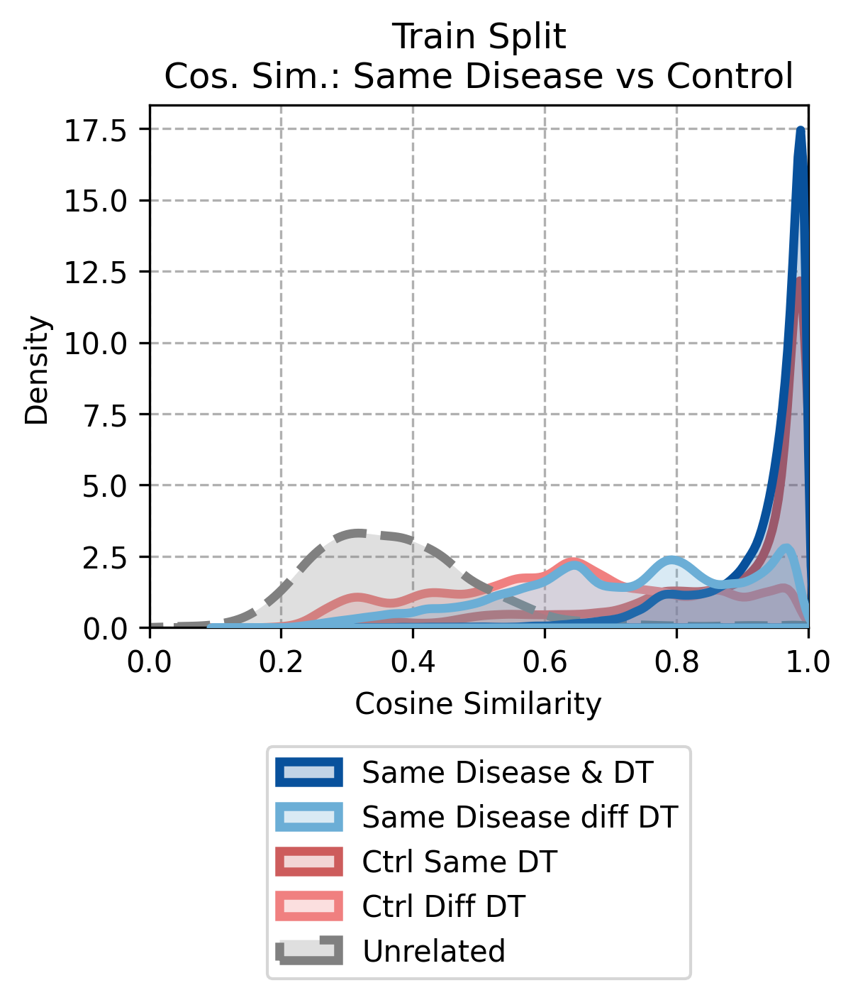

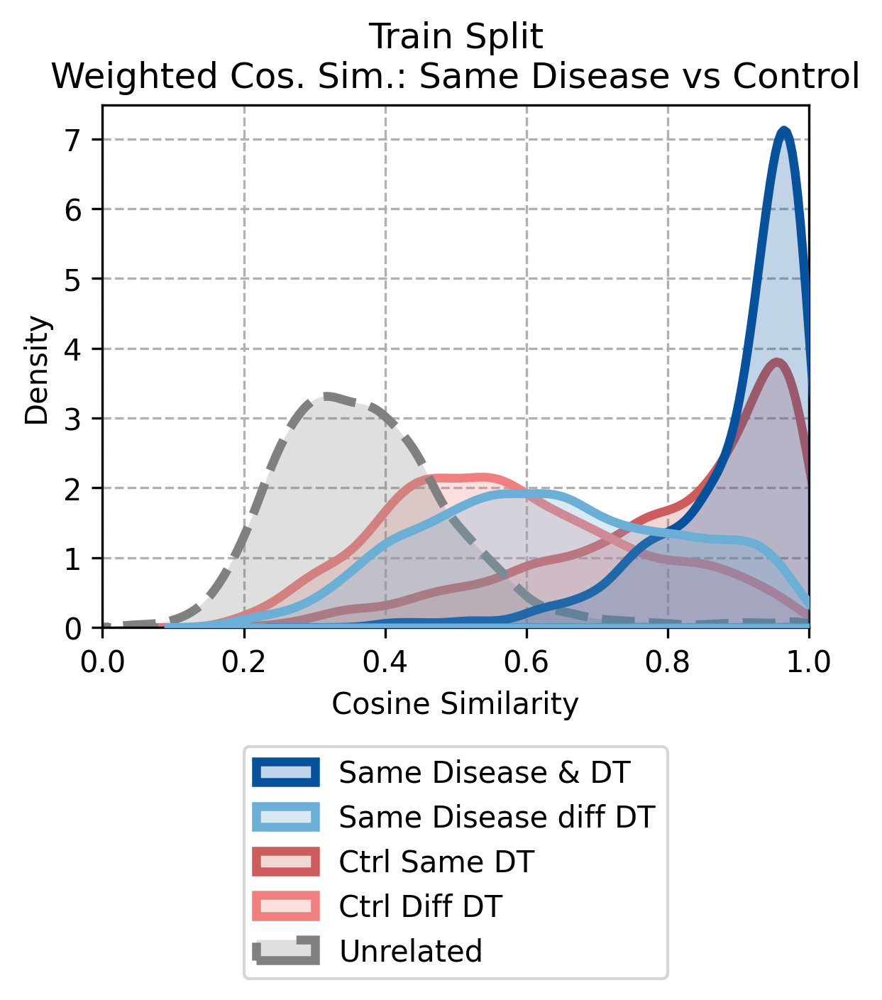

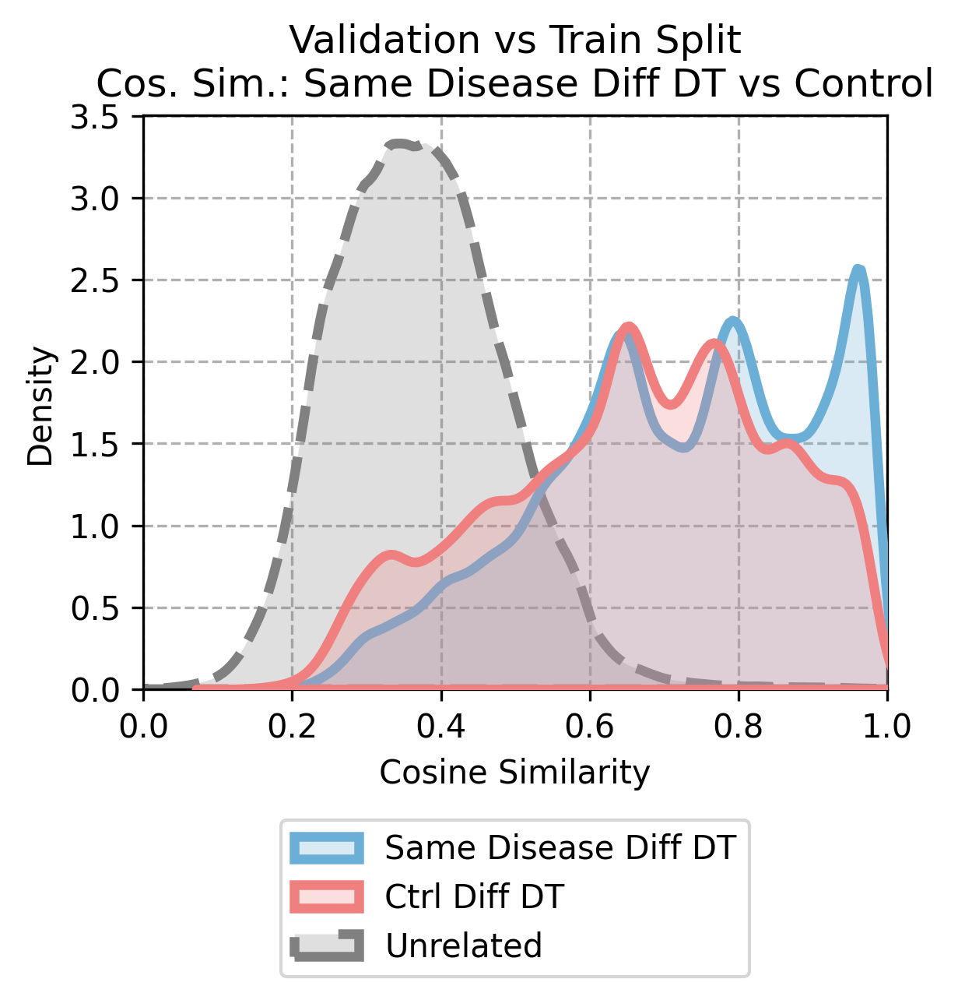

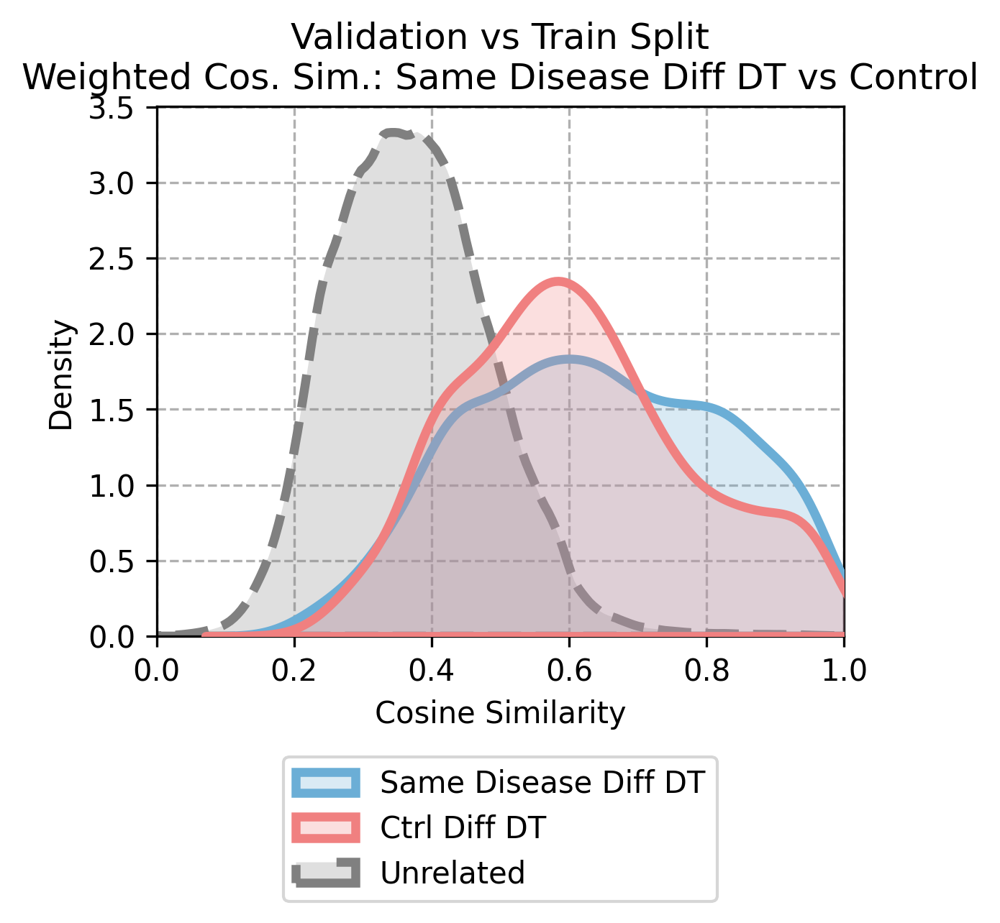

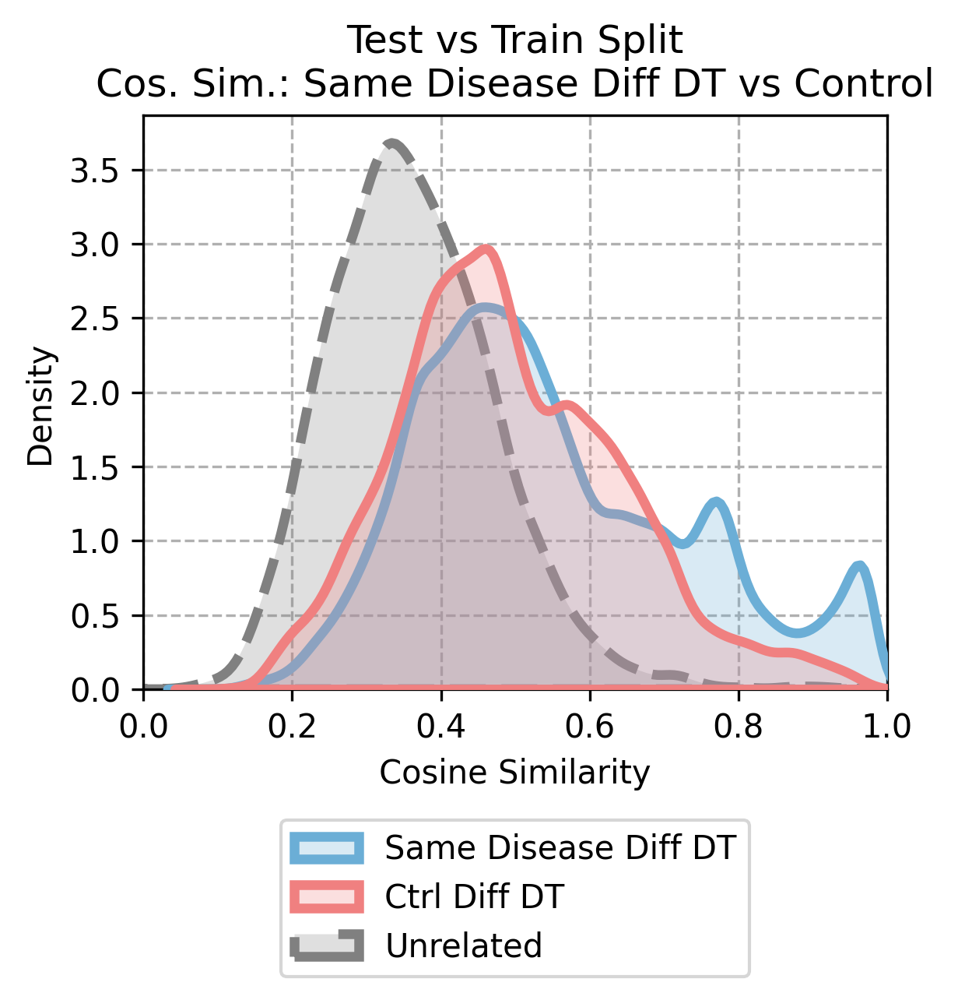

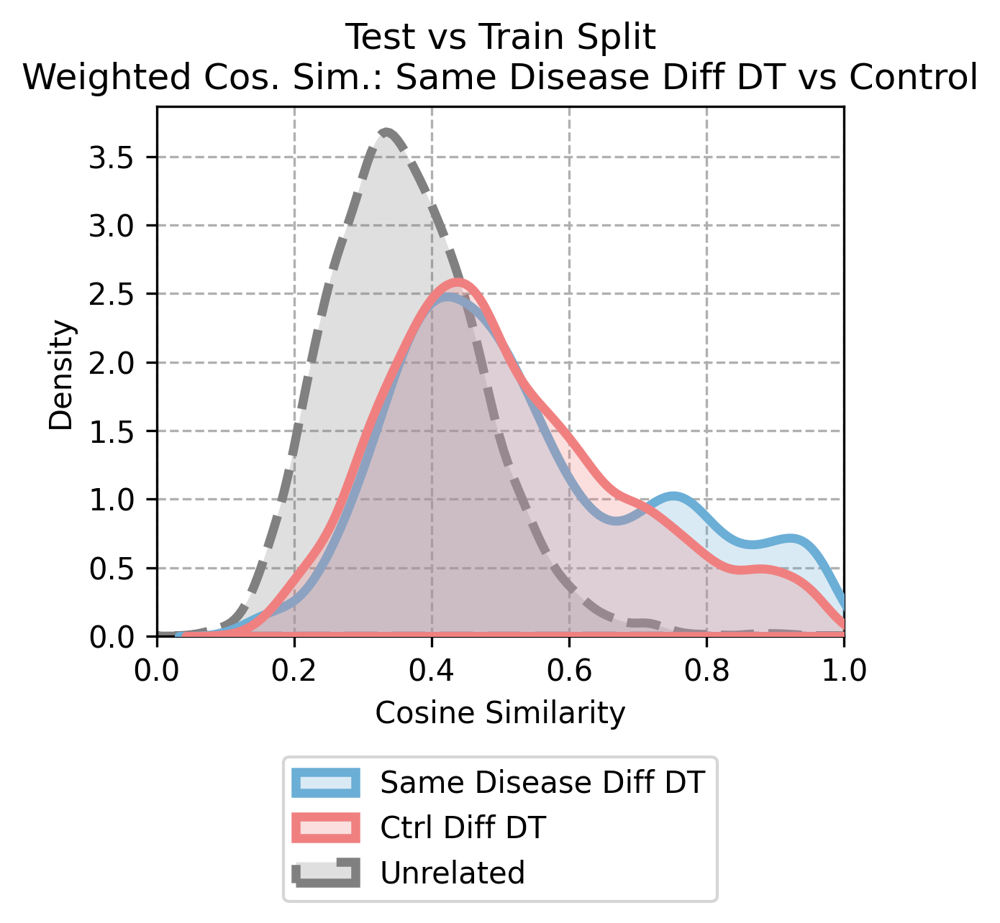

In [10]:
# 3. Plot Similarity
dpi_val = 300
# train
# unweighted
vz.plot_kde([tr_s_same_same, tr_s_same_diff, tr_s_ctrl_same, tr_s_ctrl_diff, tr_s_unr], 
            ["Same Disease & DT", "Same Disease diff DT", "Ctrl Same DT", "Ctrl Diff DT", "Unrelated"], 
            title="Train Split\nCos. Sim.: Same Disease vs Control", 
            colors=["#08519c","#6baed6", "indianred", "lightcoral", "gray"],dpi=dpi_val,
             weights=None, output_dir=os.path.join(output_dir, f"{embedding_type}-kde_train_dis_id.png"))

# weighted
vz.plot_kde([tr_s_same_same, tr_s_same_diff, tr_s_ctrl_same, tr_s_ctrl_diff, tr_s_unr], 
            ["Same Disease & DT", "Same Disease diff DT", "Ctrl Same DT", "Ctrl Diff DT", "Unrelated"], 
            title="Train Split\nWeighted Cos. Sim.: Same Disease vs Control", 
            colors=["#08519c","#6baed6", "indianred", "lightcoral", "gray"],
             weights=[tr_w_same_same, tr_w_same_diff, tr_w_ctrl_same, tr_w_ctrl_diff, None],output_dir=os.path.join(output_dir, f"{embedding_type}-kde_train_dis_id_w.png"),dpi=dpi_val)




# validation set
# unweighted
vz.plot_kde([vl_s_same_diff, vl_s_ctrl_diff, vl_s_unr], 
            ["Same Disease Diff DT", "Ctrl Diff DT", "Unrelated"], 
            title="Validation vs Train Split\nCos. Sim.: Same Disease Diff DT vs Control", 
            colors=["#6baed6", "lightcoral", "gray"],dpi=dpi_val,
             weights=None, output_dir=os.path.join(output_dir, f"{embedding_type}-kde_val_dis_id.png"))

# weighted
vz.plot_kde([vl_s_same_diff, vl_s_ctrl_diff, vl_s_unr], 
            ["Same Disease Diff DT", "Ctrl Diff DT", "Unrelated"], 
            title="Validation vs Train Split\nWeighted Cos. Sim.: Same Disease Diff DT vs Control", 
            colors=["#6baed6", "lightcoral", "gray"],
             weights=[vl_w_same_diff, vl_w_ctrl_diff, None],dpi=dpi_val, output_dir=os.path.join(output_dir, f"{embedding_type}-kde_val_dis_id_w.png"))


# test set
# unweighted
vz.plot_kde([ts_s_same_diff, ts_s_ctrl_diff, ts_s_unr], 
            ["Same Disease Diff DT", "Ctrl Diff DT", "Unrelated"], 
            title="Test vs Train Split\nCos. Sim.: Same Disease Diff DT vs Control", 
            colors=["#6baed6", "lightcoral", "gray"],dpi=dpi_val,
             weights=None, output_dir=os.path.join(output_dir, f"{embedding_type}-kde_test_dis_id.png"))

# weighted
vz.plot_kde([ts_s_same_diff, ts_s_ctrl_diff, ts_s_unr], 
            ["Same Disease Diff DT", "Ctrl Diff DT", "Unrelated"], 
            title="Test vs Train Split\nWeighted Cos. Sim.: Same Disease Diff DT vs Control", 
            colors=["#6baed6", "lightcoral", "gray"],
             weights=[ts_w_same_diff, ts_w_ctrl_diff, None],dpi=dpi_val, output_dir=os.path.join(output_dir, f"{embedding_type}-kde_test_dis_id_w.png"))


## 2.2 Stratified by disease category

In [ ]:
# imports
from scanpy import AnnData 
from tqdm import tqdm
import pandas as pd
import numpy as np
from scipy.stats import hypergeom

# variables


# functions
def get_top_k_dis(adata_qry:AnnData, 
                  adata_ref:AnnData, 
                  c_matrix_qry_ref:np.ndarray,
                  c_matrix_ref:np.ndarray,
                  do_diff_dt:bool=True, 
                  )->pd.DataFrame:
    """
    Get top K closest diseases for each query GEx
    """

    def _get_top_k(labels: np.ndarray, x: np.ndarray, k: int = 5) -> List[str]:
        """Return the top-k labels by descending score."""
        top_k_idx = np.argsort(x)[::-1][:k]
        return labels[top_k_idx].tolist()

    def _get_top_k_uniq(labels: np.ndarray, x: np.ndarray, k: int = 5, dist_thr:float=None) -> List[str]:
        """Return top-k unique labels by descending score."""
        top_k = []
        for i in np.argsort(x)[::-1]:
            label = labels[i]

            if dist_thr is not None:                    
                if x[i] < dist_thr:
                    break

            if label not in top_k:
                top_k.append(label)

            if len(top_k) == k:
                break
        return top_k
    
    def _get_dist_nn(labels: np.ndarray, x: np.ndarray, dist: float = 0.5) -> List[str]:
        """Return all labels within a certain distance."""
        return labels[np.where(x >= dist)].tolist()

    adata_qry.obs.reset_index(drop=True, inplace=True)
    adata_ref.obs.reset_index(drop=True, inplace=True)

    ref_doids = adata_ref.obs["doid_id"].values
    ref_datasets = adata_ref.obs["dataset"].values
    qry_doids = adata_qry.obs["doid_id"].values
    qry_datasets = adata_qry.obs["dataset"].values

    # get first instance of each unique element
    dt_first_idxs = list()
    datasets = adata_ref.obs["dataset"].to_list()
    for d in set(datasets):
        # only returns first instance!
        idx = datasets.index(d)
        dt_first_idxs.append(idx)

    # subset all distances to first instance of each dataset
    dt_matrix = c_matrix_ref[dt_first_idxs, :][:, dt_first_idxs]

    # get values below diagonal
    lower_tri_indices = np.tril_indices_from(dt_matrix, k=-1)
    dt_values = dt_matrix[lower_tri_indices]

    thr_90_pct = np.percentile(dt_values, 90)
    thr_95_pct = np.percentile(dt_values, 95)
    thr_99_pct = np.percentile(dt_values, 99)

    print(f"Distance thresholds (90, 95, 99 pct): {thr_90_pct:.3f}, {thr_95_pct:.3f}, {thr_99_pct:.3f}")

    results = list()
    for i in tqdm(range(len(adata_qry)), desc="Processing queries"):
        q_doid = qry_doids[i]
        q_dataset = qry_datasets[i]
        sims = np.array(c_matrix_qry_ref[i, :], copy=True)

        # If requested, mask similarities to samples from the same dataset
        if do_diff_dt:
            same_dt_mask = ref_datasets == q_dataset
            sims[same_dt_mask] = -1  # ignore self-dataset similarities

        results.append({
            "query_idx": i,
            "query_doid": q_doid,
            "top_1": _get_top_k(ref_doids, sims, k=1),
            "top_5": _get_top_k(ref_doids, sims, k=5),
            "top_10": _get_top_k(ref_doids, sims, k=10),
            "top_25": _get_top_k(ref_doids, sims, k=25),
            "top_50": _get_top_k(ref_doids, sims, k=50),
            "top_100": _get_top_k(ref_doids, sims, k=100),
            "top_1_unique": _get_top_k_uniq(ref_doids, sims, k=1),
            "top_3_unique": _get_top_k_uniq(ref_doids, sims, k=3),
            "top_5_unique": _get_top_k_uniq(ref_doids, sims, k=5),
            "top_5_unique_90": _get_top_k_uniq(ref_doids, sims, k=5, dist_thr=thr_90_pct),
            "top_5_unique_95": _get_top_k_uniq(ref_doids, sims, k=5, dist_thr=thr_95_pct),
            "top_5_unique_99": _get_top_k_uniq(ref_doids, sims, k=5, dist_thr=thr_99_pct),
            "top_10_unique": _get_top_k_uniq(ref_doids, sims, k=10),
            "top_25_unique": _get_top_k_uniq(ref_doids, sims, k=25),
            "nn_90_pct": _get_dist_nn(ref_doids, sims, dist=thr_90_pct),
            "nn_95_pct": _get_dist_nn(ref_doids, sims, dist=thr_95_pct),
            "nn_99_pct": _get_dist_nn(ref_doids, sims, dist=thr_99_pct),
        })

    return pd.DataFrame(results)

def get_counts(df:pd.DataFrame, rel_map:Dict, key_interest:str)->pd.DataFrame:
    df_query = df.copy()

    n_same, n_rel, n_unrel, n_total, n_total_unique = [], [], [], [], []

    for _, r in df_query.iterrows():
        topk = list(r[key_interest])  # keep duplicates
        doid = r["query_doid"]
        related = rel_map.get(doid, set())

        same = sum(1 for x in topk if x == doid)           # absolute count of the exact disease
        rel  = sum(1 for x in topk if x in related)        # absolute count of related diseases (counts repeats)
        total = len(topk)
        unrel = total - same - rel

        n_same.append(same)
        n_rel.append(rel)
        n_unrel.append(unrel)
        n_total.append(total)
        n_total_unique.append(len(set(topk)))

    df_query["n_same"]  = n_same
    df_query["n_rel"]   = n_rel
    df_query["n_unrel"] = n_unrel
    df_query["n_total"] = n_total
    df_query["n_total_unique"] = n_total_unique
    
    df_query["pct_same"]  = df_query["n_same"] / df_query["n_total"] * 100
    df_query["pct_rel"]   = df_query["n_rel"] / df_query["n_total"] * 100
    df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"] * 100

    df_query["hits_same"] = (df_query["n_same"] > 0).astype(int)
    df_query["hits_rel"]  = (df_query["n_rel"] > 0).astype(int)

    # get precision
    df_query["prec@k"] = (df_query["n_rel"]+df_query["n_same"]) / df_query["n_total"]

    return df_query



def plot_lollipop(x_vals, labels, title, metric, color):
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D

    # numeric positions for categories
    xpos = np.arange(len(labels))

    plt.figure(figsize=(16, 5))
    plt.scatter(xpos, x_vals, color=color, s=30, zorder=3)  # dots

    # stems first (so dots appear on top)
    plt.vlines(np.arange(len(labels)), 0.0, x_vals, color=color, alpha=1, linewidth=2, zorder=2)

    # cosmetics
    plt.xticks(xpos, labels, rotation=90,)
    plt.margins(x=0.01, y=0.1)
    plt.ylim(-0.01, max(1, max(x_vals)) + 0.1)
    plt.grid(linestyle='--', alpha=0.7, zorder=-3)

    # labels / title (note: you're plotting average_precision, not AUROC)
    plt.xlabel("Disease")
    plt.ylabel(f"{metric}")
    plt.title(f"{title}")

    # legend entries for point and red segments
    plt.legend(loc='best')

    plt.tight_layout()
    plt.show()



def barplot_composition(x_labels, vals_1, vals_2, vals_3, categories=["Same Disease", "Related Disease", "Unrelated Disease"], title="Disease composition", y_lab="Counts"):
    x = np.arange(len(x_labels))

    fig, ax = plt.subplots(figsize=(15, 5))

    # Stacked vertical bars
    ax.bar(x, vals_1, color="darkblue", label=categories[0], edgecolor="black")
    ax.bar(x,vals_2, bottom=vals_1,
                        color="skyblue", label=categories[1], edgecolor="black")
    ax.bar(
        x, vals_3,
        bottom=np.array(vals_1) + np.array(vals_2),
        color="white", edgecolor="black", hatch="//", label=categories[2]
    )

    # Labels and formatting
    ax.set_xticks(x)
    ax.set_xticklabels(x_labels, rotation=90)
    ax.set_ylabel(y_lab)
    ax.set_title(title)
    ax.legend()

    plt.margins(x=0.005, y=0.0)
    # plt.ylim(-0, 100)  # adjust if your totals differ
    plt.tight_layout()
    plt.show()

def add_hypergeom_hits(df_top_nn: pd.DataFrame, population:List, col_query="query_doid", col_hits="nn_99_pct", alpha=0.05):

    N = len(population)

    # get all hits list which pass hypergeom test
    _all_hits =list()
    for hits_i in tqdm(df_top_nn[col_hits]):
        _passed_hits = list()
        for h in set(hits_i):
            n = len(hits_i) # sample size
        
            K = population.count(h) # nº of success in population
            k = hits_i.count(h) # nº of observed successes sample
            
            p = hypergeom.sf(k - 1, N, K, n)
            if p < alpha:
                _passed_hits.append(h)

        _all_hits.append(_passed_hits)

    # store hits        
    df_top_nn[f"{col_hits}_hg"] = _all_hits

    return df_top_nn



# with controls
df_top_nn = get_top_k_dis(adata_test, adata_train, c_matrix_test_vs_train, c_matrix_train, do_diff_dt=True)

# without controls
mask_test = adata_test.obs["doid_id"] != "Control"
mask_train = adata_train.obs["doid_id"] != "Control"
df_top_nn_no_ctrl = get_top_k_dis(adata_test[mask_test], adata_train[mask_train], c_matrix_test_vs_train[mask_test,:][:,mask_train], c_matrix_train[mask_train,:][:,mask_train], do_diff_dt=True)

# add hypergeometric test to distance approach
df_top_nn = add_hypergeom_hits(df_top_nn, population=adata_train.obs["doid_id"].tolist(), col_hits="top_5_unique_95", alpha=0.1)
df_top_nn = add_hypergeom_hits(df_top_nn, population=adata_train.obs["doid_id"].tolist(), col_hits="top_5_unique_99", alpha=0.1)
df_top_nn = add_hypergeom_hits(df_top_nn, population=adata_train.obs["doid_id"].tolist(), col_hits="nn_99_pct", alpha=0.1)
df_top_nn = add_hypergeom_hits(df_top_nn, population=adata_train.obs["doid_id"].tolist(), col_hits="nn_95_pct", alpha=0.1)

df_top_nn_no_ctrl = add_hypergeom_hits(df_top_nn_no_ctrl, population=adata_train[mask_train].obs["doid_id"].tolist(), col_hits="top_5_unique_95",alpha=0.1)
df_top_nn_no_ctrl = add_hypergeom_hits(df_top_nn_no_ctrl, population=adata_train[mask_train].obs["doid_id"].tolist(), col_hits="top_5_unique_99",alpha=0.1)
df_top_nn_no_ctrl = add_hypergeom_hits(df_top_nn_no_ctrl, population=adata_train[mask_train].obs["doid_id"].tolist(), col_hits="nn_99_pct",alpha=0.1)
df_top_nn_no_ctrl = add_hypergeom_hits(df_top_nn_no_ctrl, population=adata_train[mask_train].obs["doid_id"].tolist(), col_hits="nn_95_pct", alpha=0.1)

Distance thresholds (90, 95, 99 pct): 0.562, 0.628, 0.781


Processing queries: 100%|██████████| 5248/5248 [00:58<00:00, 89.65it/s] 


Distance thresholds (90, 95, 99 pct): 0.553, 0.625, 0.789


100%|██████████| 3611/3611 [00:08<00:00, 437.84it/s]


In [12]:
population = adata_train[mask_train].obs["doid_id"].tolist()
col_hits="nn_95_pct"
alpha = 0.1
N = len(population)

# get all hits list which pass hypergeom test
_all_hits =list()
for hits_i in tqdm(df_top_nn[col_hits]):
    _passed_hits = list()
    for h in set(hits_i):
        n = len(hits_i) # sample size
    
        K = population.count(h) # nº of success in population
        k = hits_i.count(h) # nº of observed successes sample
        
        p = hypergeom.sf(k - 1, N, K, n)
        if p < alpha:
            _passed_hits.append(h)

        print(f"DOID: {h}\tP-value: {p:.4e}\tK: {K}\tN: {N}\t n: {n}\t k: {k}")


    _all_hits.append(_passed_hits)
    break



  0%|          | 0/5248 [00:00<?, ?it/s]

DOID: DOID:10584	P-value: 2.2709e-15	K: 5	N: 11823	 n: 16	 k: 5
DOID: DOID:768	P-value: 2.2709e-15	K: 5	N: 11823	 n: 16	 k: 5
DOID: Control	P-value: 0.0000e+00	K: 0	N: 11823	 n: 16	 k: 6


In [13]:
# aggregated by samples
format_pct = lambda x: [f"{x_i*100:.2f}" for x_i in x]
perf_results = list()
for k in ["top_1", "top_5", "top_5_unique", "top_5_unique_90","top_5_unique_95_hg", "top_5_unique_95", "top_5_unique_99",  "nn_95_pct", "nn_99_pct", "nn_99_pct_hg", "nn_95_pct_hg"]:
    for _df, _condition in zip([df_top_nn_no_ctrl, df_top_nn], ["No Control", "With Control"]):

        # group by disease
        _df_counts = get_counts(_df, rel_map, k)
        _hit_same = _df_counts.groupby("query_doid")["hits_same"].mean().mean()
        _hit_rel = _df_counts.groupby("query_doid")["hits_rel"].mean().mean()
        perf_results.append({
            "Key": k,
            "Across": "Diseases",
            "Condition": _condition,
            "Type": "Same Disease",
            "Hits Same Disease": f"{_hit_same*100:.1f}",
            "Precision@K": f"{_df_counts.groupby('query_doid')['prec@k'].mean().mean()*100:.1f}",
            "Size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
            "Unique Size": f'{_df_counts["n_total_unique"].mean():.0f}±{_df_counts["n_total_unique"].std():.0f}' if _df_counts["n_total_unique"].std() > 0 else f'{_df_counts["n_total_unique"].mean():.0f}',
            "Hits Related Disease": f"{_hit_rel*100:.1f}",
        })

        # across all samples
        _df_counts = get_counts(_df, rel_map, k)
        _hit_same = _df_counts["hits_same"].mean()
        _hit_rel = _df_counts["hits_rel"].mean()

        perf_results.append({
            "Key": k,
            "Across": "Samples",
            "Condition": _condition,
            "Type": "Related Disease",
            "Hits Same Disease": f"{_hit_same*100:.1f}",
            "Precision@K": f"{_df_counts['prec@k'].mean()*100:.1f}",
            "Size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
            "Unique Size": f'{_df_counts["n_total_unique"].mean():.0f}±{_df_counts["n_total_unique"].std():.0f}' if _df_counts["n_total_unique"].std() > 0 else f'{_df_counts["n_total_unique"].mean():.0f}',
            "Hits Related Disease": f"{_hit_rel*100:.1f}",
        })

df_perf_results = pd.DataFrame(perf_results)

df_perf_results.query("(Across == 'Samples') & (Condition == 'With Control')")

,Key,Across,Condition,Type,Hits Same Disease,Precision@K,Size,Unique Size,Hits Related Disease
3,top_1,Samples,With Control,Related Disease,21.5,59.6,1,1,38.1
7,top_5,Samples,With Control,Related Disease,33.0,59.4,5,2±1,44.5
11,top_5_unique,Samples,With Control,Related Disease,47.5,43.9,5,5,54.0
15,top_5_unique_90,Samples,With Control,Related Disease,47.5,43.9,5±0,5±0,54.0
19,top_5_unique_95_hg,Samples,With Control,Related Disease,16.2,43.5,3±1,3±1,52.2
23,top_5_unique_95,Samples,With Control,Related Disease,47.5,44.7,5±0,5±0,54.0
27,top_5_unique_99,Samples,With Control,Related Disease,38.3,47.1,4±2,4±2,49.7
31,nn_95_pct,Samples,With Control,Related Disease,70.9,53.4,821±584,18±8,62.0
35,nn_99_pct,Samples,With Control,Related Disease,45.0,57.5,264±305,6±4,51.1
39,nn_99_pct_hg,Samples,With Control,Related Disease,25.7,51.6,3±2,3±2,49.5


In [14]:
df_perf_results.query("Across == 'Diseases'")

,Key,Across,Condition,Type,Hits Same Disease,Precision@K,Size,Unique Size,Hits Related Disease
0,top_1,Diseases,No Control,Same Disease,12.0,45.1,1,1,33.1
2,top_1,Diseases,With Control,Same Disease,10.4,35.5,1,1,25.0
4,top_5,Diseases,No Control,Same Disease,18.1,46.5,5,2±1,48.8
6,top_5,Diseases,With Control,Same Disease,16.6,35.3,5,2±1,40.7
8,top_5_unique,Diseases,No Control,Same Disease,29.4,39.3,5,5,66.0
10,top_5_unique,Diseases,With Control,Same Disease,27.3,33.6,5,5,62.5
12,top_5_unique_90,Diseases,No Control,Same Disease,29.4,39.3,5±0,5±0,66.0
14,top_5_unique_90,Diseases,With Control,Same Disease,27.3,33.6,5±0,5±0,62.5
16,top_5_unique_95_hg,Diseases,No Control,Same Disease,25.3,40.0,3±1,3±1,60.2
18,top_5_unique_95_hg,Diseases,With Control,Same Disease,24.3,40.6,3±1,3±1,59.0


In [15]:
df_perf_results.query("Across == 'Samples'")

,Key,Across,Condition,Type,Hits Same Disease,Precision@K,Size,Unique Size,Hits Related Disease
1,top_1,Samples,No Control,Related Disease,7.6,69.0,1,1,61.4
3,top_1,Samples,With Control,Related Disease,21.5,59.6,1,1,38.1
5,top_5,Samples,No Control,Related Disease,10.9,69.9,5,2±1,69.3
7,top_5,Samples,With Control,Related Disease,33.0,59.4,5,2±1,44.5
9,top_5_unique,Samples,No Control,Related Disease,28.7,63.2,5,5,80.2
11,top_5_unique,Samples,With Control,Related Disease,47.5,43.9,5,5,54.0
13,top_5_unique_90,Samples,No Control,Related Disease,28.7,63.3,5±0,5±0,80.2
15,top_5_unique_90,Samples,With Control,Related Disease,47.5,43.9,5±0,5±0,54.0
17,top_5_unique_95_hg,Samples,No Control,Related Disease,26.0,58.4,3±1,3±1,68.5
19,top_5_unique_95_hg,Samples,With Control,Related Disease,16.2,43.5,3±1,3±1,52.2


### 2.2.1 Plot Top K

In [16]:
key_interest = "top_100"
df_counts = get_counts(df_top_nn, rel_map, key_interest)

doids_sorted = df_counts.groupby("query_doid")["pct_same"].mean().sort_values(ascending=False).index.tolist()
dis_sorted = [doid_to_term.get(d, d) for d in doids_sorted]

/tmp/ipykernel_232558/2339552335.py:181: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


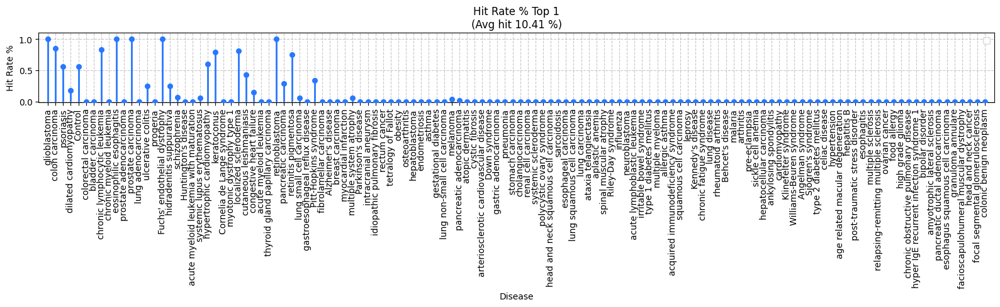

/tmp/ipykernel_232558/2339552335.py:181: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


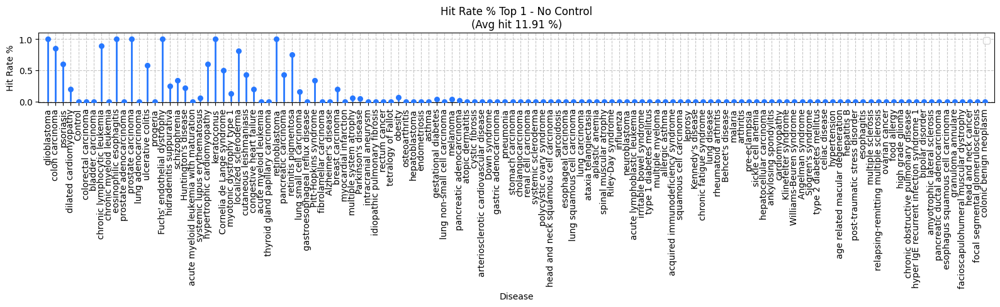

In [17]:
key_interest = "top_1"
df_counts = get_counts(df_top_nn, rel_map, key_interest)
_d_counts = df_counts.groupby("query_doid")["hits_same"].mean().to_dict()
_x_val = [_d_counts.get(d, 0) for d in doids_sorted]
plot_lollipop(_x_val, dis_sorted, f"Hit Rate % Top 1\n(Avg hit {np.mean(_x_val)*100:.2f} %)", metric="Hit Rate %", color="#2778ff")


key_interest = "top_1"
df_counts = get_counts(df_top_nn_no_ctrl, rel_map, key_interest)
_d_counts = df_counts.groupby("query_doid")["hits_same"].mean().to_dict()
_x_val = [_d_counts.get(d, 0) for d in doids_sorted]
plot_lollipop(_x_val, dis_sorted, f"Hit Rate % Top 1 - No Control\n(Avg hit {np.mean(_x_val)*100:.2f} %)", metric="Hit Rate %", color="#2778ff")

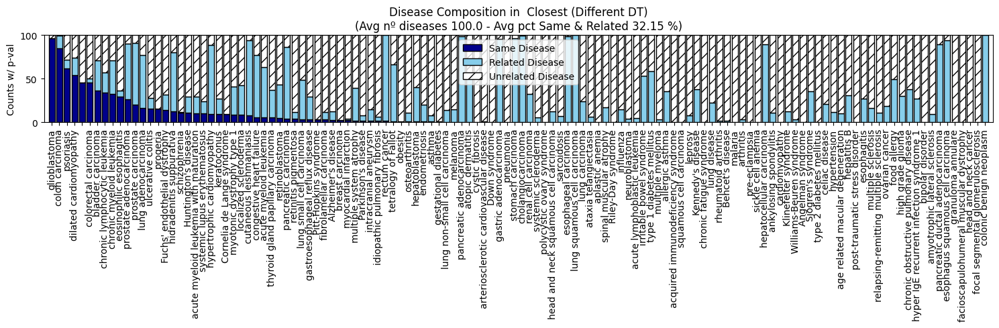

In [18]:
key_interest = "top_100"
df_counts = get_counts(df_top_nn, rel_map, key_interest)
_d_counts = df_counts.groupby("query_doid")["hits_same"].mean().to_dict()
_x_val = [_d_counts.get(d, 0) for d in doids_sorted]

# _df_order = df_counts.groupby("query_doid")["pct_same"].mean().sort_values(ascending=True).index.tolist()[:15]

title=f"Disease Composition in  Closest (Different DT)\n(Avg pct Same & Related {100-df_counts.groupby('query_doid')['pct_same'].mean().mean():.2f} %)",
y_lab="Counts in Top 5"
categories=["Same Disease", "Related Disease", "Unrelated Disease"]

barplot_composition(
    [doid_to_term.get(d) for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_same"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_rel"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_unrel"].mean() for d in doids_sorted],
    title=f"Disease Composition in  Closest (Different DT)\n(Avg nº diseases {df_counts.groupby('query_doid')['n_total'].mean().mean():.1f} - Avg pct Same & Related {100-df_counts.groupby('query_doid')['pct_unrel'].mean().mean():.2f} %)",
    y_lab=f"Counts w/ p-val"
)

### 2.2.3 Top K mean closest

In [19]:
def get_dis_aggr(adata_qry, adata_ref, c_matrix_qry_ref, do_diff_dt=True, pct:int="mean")->np.array:

    qry_doids = adata_qry.obs["doid_id"].values
    qry_datasets = adata_qry.obs["dataset"].values
    ref_doids = adata_ref.obs["doid_id"].values
    ref_datasets = adata_ref.obs["dataset"].values

    ref_dis = adata_ref.obs["doid_id"].unique()

    results = list()
    for i in tqdm(range(len(adata_qry)), desc="Processing queries"):
        d_i = qry_doids[i]
        dataset_i = qry_datasets[i]
        sims = np.array(c_matrix_qry_ref[i, :], copy=True)

        # distances to each disease
        agg_dist = list()
        for dis_j in ref_dis:

            idx_j = np.where(ref_doids == dis_j)[0]
            if len(idx_j) == 0:
                continue
            
            if do_diff_dt:  # remove same dataset comparisons
                same_dt_mask = ref_datasets[idx_j] == dataset_i
                idx_j = idx_j[~same_dt_mask]  
                if len(idx_j) == 0:
                    continue
                
            sim_i = sims[idx_j]

            if pct == "mean":
                agg_val = np.mean(sim_i)
            else:
                agg_val = np.percentile(sim_i, pct)
            agg_dist.append(agg_val)
        results.append(agg_dist)

    return np.array(results), ref_dis



def get_top_1_aggr(adata_qry, ref_dis, aggr_matrix)->pd.DataFrame:
    qry_doids = adata_qry.obs["doid_id"].values

    results = list()
    for i in tqdm(range(len(adata_qry)), desc="Processing queries"):
        d_i = qry_doids[i]
        sims = np.array(aggr_matrix[i, :], copy=True)

        top_1_idx = np.argmax(sims)
        top_1_doid = ref_dis[top_1_idx]

        results.append({
            "query_idx": i,
            "query_doid": d_i,
            "top_1_aggr": [top_1_doid],
        })

    return pd.DataFrame(results)


aggr, ref_dis = get_dis_aggr(adata_test, adata_train, c_matrix_test_vs_train, do_diff_dt=True,pct="mean")
df_top_nn_aggr = get_top_1_aggr(adata_test, ref_dis, aggr)

aggr_no_ctrl, ref_dis_no_ctrl = get_dis_aggr(adata_test[mask_test], adata_train[mask_train], c_matrix_test_vs_train[mask_test,:][:,mask_train], do_diff_dt=True,pct="mean")
df_top_nn_aggr_no_ctrl = get_top_1_aggr(adata_test[mask_test], ref_dis_no_ctrl, aggr_no_ctrl)


Processing queries: 100%|██████████| 3611/3611 [00:00<00:00, 216316.72it/s]


In [20]:
# aggregated by samples
format_pct = lambda x: [f"{x_i*100:.2f}" for x_i in x]
perf_results = list()
for k in ["top_1_aggr"]:
    for _df, _condition in zip([df_top_nn_aggr, df_top_nn_aggr_no_ctrl], ["Aggr_W_Ctrl", "Aggr_No_Ctrl"]):

        # group by disease
        _df_counts = get_counts(_df, rel_map, k)
        _hit_same = _df_counts.groupby("query_doid")["hits_same"].mean().mean()
        _hit_rel = _df_counts.groupby("query_doid")["hits_rel"].mean().mean()
        perf_results.append({
            "Key": k,
            "Across": "Diseases",
            "Condition": _condition,
            "Type": "Same Disease",
            "Hits Same Disease": f"{_hit_same*100:.1f}",
            "Precision@K": f"{_df_counts.groupby('query_doid')['prec@k'].mean().mean()*100:.1f}",
            "Set size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
            "Hits Related Disease": f"{_hit_rel*100:.1f}",
        })

        # across all samples
        _df_counts = get_counts(_df, rel_map, k)
        _hit_same = _df_counts["hits_same"].mean()
        _hit_rel = _df_counts["hits_rel"].mean()

        perf_results.append({
            "Key": k,
            "Across": "Samples",
            "Condition": _condition,
            "Type": "Related Disease",
            "Hits Same Disease": f"{_hit_same*100:.1f}",
            "Precision@K": f"{_df_counts['prec@k'].mean()*100:.1f}",
            "Set size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
            "Hits Related Disease": f"{_hit_rel*100:.1f}",
        })

df_perf_results = pd.DataFrame(perf_results)

df_perf_results

,Key,Across,Condition,Type,Hits Same Disease,Precision@K,Set size,Hits Related Disease
0,top_1_aggr,Diseases,Aggr_W_Ctrl,Same Disease,11.5,44.6,1,33.1
1,top_1_aggr,Samples,Aggr_W_Ctrl,Related Disease,5.0,48.3,1,43.3
2,top_1_aggr,Diseases,Aggr_No_Ctrl,Same Disease,11.6,45.0,1,33.4
3,top_1_aggr,Samples,Aggr_No_Ctrl,Related Disease,7.2,70.2,1,62.9


### 2.2.4 Quantile Testing

In [21]:
# build background distributions for EACH disease

def get_bg_dist(adata:AnnData, rel_map:dict, c_matrix:np.array)->dict:
    bg_dists = {}

    for d_i in tqdm(adata.obs["doid_id"].unique(), desc="Building background distributions"):
        # related disease
        r_i = rel_map.get(d_i, set())
        r_i = r_i | {d_i} # include self as related

        # get indices
        idx_i = np.argwhere(adata.obs["doid_id"] == d_i).flatten()
        idx_unr_i = np.argwhere(~adata.obs["doid_id"].isin(r_i)).flatten()

        dist_i = c_matrix[idx_i, :][:, idx_unr_i].flatten()
        bg_dists[d_i] = dict()
        bg_dists[d_i]["vec"] = dist_i
        bg_dists[d_i]["mean"] = float(np.mean(dist_i))
        bg_dists[d_i]["p50"] = float(np.percentile(dist_i, 50))
        bg_dists[d_i]["p90"] = float(np.percentile(dist_i, 90))
        bg_dists[d_i]["p95"] = float(np.percentile(dist_i, 95))
        bg_dists[d_i]["p99"] = float(np.percentile(dist_i, 99)) 

    return bg_dists


def get_bg_dist_same(adata:AnnData, rel_map:dict, c_matrix:np.array)->dict:
    bg_dists = {}

    for d_i in tqdm(adata.obs["doid_id"].unique(), desc="Building background distributions"):
        # related disease
        r_i = rel_map.get(d_i, set())
        r_i = r_i | {d_i} # include self as related

        # get indices
        idx_i = np.argwhere(adata.obs["doid_id"] == d_i).flatten()
        idx_unr_i = np.argwhere(~adata.obs["doid_id"].isin(r_i)).flatten()

        dist_i = c_matrix[idx_i, :][:, idx_unr_i].flatten()
        bg_dists[d_i] = dict()
        bg_dists[d_i]["vec"] = dist_i
        bg_dists[d_i]["mean"] = float(np.mean(dist_i))
        bg_dists[d_i]["p50"] = float(np.percentile(dist_i, 50))
        bg_dists[d_i]["p90"] = float(np.percentile(dist_i, 90))
        bg_dists[d_i]["p95"] = float(np.percentile(dist_i, 95))
        bg_dists[d_i]["p99"] = float(np.percentile(dist_i, 99)) 

    return bg_dists

# no control
bg_dist = get_bg_dist(adata_train, rel_map, c_matrix_train)

mask_train = adata_train.obs["doid_id"] != "Control"
bg_dist_no_ctrl = get_bg_dist(adata_train[mask_train], rel_map, c_matrix_train[mask_train,:][:,mask_train])



Building background distributions: 100%|██████████| 123/123 [00:04<00:00, 25.30it/s]


In [22]:
from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor, as_completed


def get_top_dis_statistics(adata_qry, adata_ref, c_matrix_qry_ref, bg_stats, do_diff_dt=True):

    qry_doids = adata_qry.obs["doid_id"].values
    qry_datasets = adata_qry.obs["dataset"].values
    ref_doids = adata_ref.obs["doid_id"].values
    ref_datasets = adata_ref.obs["dataset"].values


    results = list()
    for i in tqdm(range(len(adata_qry)), desc="Processing queries"):
        d_i = qry_doids[i]
        dataset_i = qry_datasets[i]
        sims = np.array(c_matrix_qry_ref[i, :], copy=True)

        for dis_j in adata_ref.obs["doid_id"].unique():
            if dis_j == "Control":
                continue
            idx_j = np.where(ref_doids == dis_j)[0]
            if len(idx_j) == 0:
                continue
            
            if do_diff_dt:  # remove same dataset comparisons
                same_dt_mask = ref_datasets[idx_j] == dataset_i
                idx_j = idx_j[~same_dt_mask]  
                if len(idx_j) == 0:
                    continue
                
            sim_i = sims[idx_j]

            # quantile testing against unrelated background
            from scipy import stats

            results.append({
                "query_idx": i,
                "query_doid": d_i,
                "ref_doid": dis_j,

                "qtl_test_90": stats.quantile_test(sim_i, q=bg_stats.get(dis_j)["p90"],p=0.9,alternative="greater").pvalue,
                "qtl_test_95": stats.quantile_test(sim_i, q=bg_stats.get(dis_j)["p95"],p=0.95,alternative="greater").pvalue,
                "qtl_test_99": stats.quantile_test(sim_i, q=bg_stats.get(dis_j)["p99"],p=0.99,alternative="greater").pvalue,
                "qtl_test_50": stats.quantile_test(sim_i, q=bg_stats.get(dis_j)["p50"],p=0.50,alternative="greater").pvalue,

                # "t_test": stats.ttest_ind(bg_stats.get(dis_j)["vec"], sim_i, equal_var=False, alternative="less").pvalue,
                # "t_test_1sample": stats.ttest_1samp(sim_i, np.mean(bg_stats.get(dis_j)["vec"]), alternative="greater").pvalue,
                # "rev_t_test_1sample": stats.ttest_1samp(bg_stats.get(dis_j)["vec"], np.mean(sim_i), alternative="less").pvalue,

            })

        # break

    return pd.DataFrame(results)

# control
df_stats = get_top_dis_statistics(adata_test, adata_train, c_matrix_test_vs_train, bg_dist_no_ctrl, do_diff_dt=True)
        
    

Processing queries: 100%|██████████| 5248/5248 [10:04<00:00,  8.68it/s]


In [23]:
df_stats

,query_idx,query_doid,ref_doid,qtl_test_90,qtl_test_95,qtl_test_99,qtl_test_50
0,0,Control,DOID:11714,1.000000,1.000000e+00,1.000000e+00,1.028632e-06
1,0,Control,DOID:10286,0.994500,1.000000e+00,1.000000e+00,9.410810e-02
2,0,Control,DOID:332,0.999975,9.998628e-01,1.000000e+00,1.076453e-22
3,0,Control,DOID:2526,1.000000,1.000000e+00,1.000000e+00,3.193656e-34
4,0,Control,DOID:8577,1.000000,1.000000e+00,1.000000e+00,9.998403e-01
...,...,...,...,...,...,...,...
645499,5247,DOID:635,DOID:235,1.000000,1.000000e+00,1.000000e+00,1.000000e+00
645500,5247,DOID:635,DOID:1749,0.001000,1.000000e+00,1.000000e+00,1.250000e-01
645501,5247,DOID:635,DOID:768,1.000000,1.000000e+00,1.000000e+00,3.125000e-02
645502,5247,DOID:635,DOID:9415,0.000010,3.125000e-07,1.000000e-10,3.125000e-02


In [24]:
from joblib import Parallel, delayed
from tqdm import tqdm
import numpy as np
import pandas as pd
from scipy import stats
from statsmodels.stats.multitest import multipletests

def _process_query(i, qry_doids, ref_doids, qry_datasets, ref_datasets,
                   c_matrix_qry_ref, bg_stats, do_diff_dt):
    """
    Identical to your original inner loop — just separated for parallel execution.
    """
    d_i = qry_doids[i]
    dataset_i = qry_datasets[i]
    sims = np.array(c_matrix_qry_ref[i, :], copy=True)

    qtl_results = list()
    ref_doids_seen = list()
    for dis_j in set(ref_doids):
        idx_j = np.where(ref_doids == dis_j)[0]

        if len(idx_j) == 0:
            continue

        if do_diff_dt:  # remove same dataset comparisons
            same_dt_mask = ref_datasets[idx_j] == dataset_i
            idx_j = idx_j[~same_dt_mask]
            if len(idx_j) == 0:
                continue

        sim_i = sims[idx_j]

        qtl_test_90 = stats.quantile_test(sim_i, q=bg_stats.get(dis_j)["p90"], p=0.9, alternative="greater").pvalue
        qtl_test_95 = stats.quantile_test(sim_i, q=bg_stats.get(dis_j)["p95"], p=0.95, alternative="greater").pvalue
        qtl_test_99 = stats.quantile_test(sim_i, q=bg_stats.get(dis_j)["p99"], p=0.99, alternative="greater").pvalue
        qtl_test_50 = stats.quantile_test(sim_i, q=bg_stats.get(dis_j)["p50"], p=0.50, alternative="greater").pvalue
        ref_doids_seen.append(dis_j)
        qtl_results.append((qtl_test_50,qtl_test_90, qtl_test_95, qtl_test_99))


    results = {
        "query_idx": [i]*len(ref_doids_seen),
        "query_doid": [d_i]*len(ref_doids_seen),
        "ref_doid": ref_doids_seen,

        "qtl_test_50": [x[0] for x in qtl_results],
        "qtl_test_90": [x[1] for x in qtl_results],
        "qtl_test_95": [x[2] for x in qtl_results],
        "qtl_test_99": [x[3] for x in qtl_results],
        
        "qtl_test_50_bonf": multipletests([x[0] for x in qtl_results], method="bonferroni")[1],
        "qtl_test_90_bonf": multipletests([x[1] for x in qtl_results], method="bonferroni")[1],
        "qtl_test_95_bonf": multipletests([x[2] for x in qtl_results], method="bonferroni")[1],
        "qtl_test_99_bonf": multipletests([x[3] for x in qtl_results], method="bonferroni")[1],
    }


    return pd.DataFrame(results)

def get_top_dis_statistics(adata_qry, adata_ref, c_matrix_qry_ref, bg_stats, do_diff_dt=True, n_jobs=-1):
    """
    Same as your original function, but parallelized with Joblib (loky backend).
    Works inside Jupyter and fully utilizes all CPU cores.
    """
    qry_doids = adata_qry.obs["doid_id"].to_numpy()
    qry_datasets = adata_qry.obs["dataset"].to_numpy()

    ref_doids = adata_ref.obs["doid_id"].to_numpy()
    ref_datasets = adata_ref.obs["dataset"].to_numpy()

    indices = range(len(adata_qry))

    # Parallel execution to speed up things!
    results = Parallel(n_jobs=n_jobs, backend="loky")(
        delayed(_process_query)(
            i, qry_doids, ref_doids, qry_datasets, ref_datasets,
            c_matrix_qry_ref, bg_stats, do_diff_dt
        )
        for i in tqdm(indices, desc="Processing queries (parallel)")
    )

    return pd.concat(results, ignore_index=True)


# control
df_stats = get_top_dis_statistics(
    adata_test,
    adata_train,
    c_matrix_test_vs_train,
    bg_dist,
    do_diff_dt=True,
    n_jobs=16,  # use all 16 cores
)

# no control

df_stats_no_ctrl = get_top_dis_statistics(
    adata_test[mask_test],
    adata_train[mask_train],
    c_matrix_test_vs_train[mask_test,:][:,mask_train],
    bg_dist,
    do_diff_dt=True,
    n_jobs=16,  # use all 16 cores
)


Processing queries (parallel): 100%|██████████| 3611/3611 [01:33<00:00, 38.43it/s]


In [25]:
def get_counts(df:pd.DataFrame, rel_map:Dict, key_interest:str)->pd.DataFrame:
    df_query = df.copy()

    n_same, n_rel, n_unrel, n_total, n_total_unique = [], [], [], [], []

    for _, r in df_query.iterrows():
        topk = list(r[key_interest])  # keep duplicates
        doid = r["query_doid"]
        related = rel_map.get(doid, set())

        same = sum(1 for x in topk if x == doid)           # absolute count of the exact disease
        rel  = sum(1 for x in topk if x in related)        # absolute count of related diseases (counts repeats)
        total = len(topk)
        unrel = total - same - rel

        n_same.append(same)
        n_rel.append(rel)
        n_unrel.append(unrel)
        n_total.append(total)
        n_total_unique.append(len(set(topk)))

    df_query["n_same"]  = n_same
    df_query["n_rel"]   = n_rel
    df_query["n_unrel"] = n_unrel
    df_query["n_total"] = n_total
    df_query["n_total_unique"] = n_total_unique
    
    df_query["pct_same"]  = df_query["n_same"] / df_query["n_total"] * 100
    df_query["pct_rel"]   = df_query["n_rel"] / df_query["n_total"] * 100
    df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"] * 100

    df_query["hits_same"] = (df_query["n_same"] > 0).astype(int)
    df_query["hits_rel"]  = (df_query["n_rel"] > 0).astype(int)

    # get precision
    df_query["prec@k"] = (df_query["n_rel"]+df_query["n_same"]) / df_query["n_total"]

    return df_query

In [26]:
def get_stats_counts(df:pd.DataFrame, rel_map:Dict, key_interest:str, pval:int=0.001, top_k:int=None)->pd.DataFrame:
    
    results_query = list()
    for q_i in tqdm(df["query_idx"].unique()):

        doid = df.query(f"(query_idx == @q_i)")["query_doid"].values[0]
        related = rel_map.get(doid, set())
        
        df_sub = df.query(f"(query_idx == @q_i) & ({key_interest} < @pval)")
        if top_k is not None:
            df_sub = df_sub.sort_values(key_interest, ascending=True).head(top_k)

        top_dis = df_sub["ref_doid"].to_list()

        if len(top_dis) == 0:
            n_same = 0
            n_rel = 0
            n_unrel = 0
            n_total = 0                
        else:
            n_same = sum(1 for x in top_dis if x == doid)     # absolute count of the exact disease
            n_rel  = sum(1 for x in top_dis if x in related)  # absolute count of related diseases (counts repeats)
            n_total = len(top_dis)
            n_unrel = n_total - n_same - n_rel
            n_total_unique = len(set(top_dis))

        results_query.append({
            "query_idx": q_i,
            "query_doid": doid,
            "n_same": n_same,
            "n_rel": n_rel,
            "n_unrel": n_unrel,
            "n_total": n_total,
            "n_total_unique": n_total_unique,
        })

    df_query = pd.DataFrame(results_query)

    df_query["n_same"]  = n_same
    df_query["n_rel"]   = n_rel
    df_query["n_unrel"] = n_unrel
    df_query["n_total"] = n_total
    df_query["n_total_unique"] = n_total_unique
    
    df_query["pct_same"]  = df_query["n_same"] / df_query["n_total"] * 100
    df_query["pct_rel"]   = df_query["n_rel"] / df_query["n_total"] * 100
    df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"] * 100

    df_query["hits_same"] = (df_query["n_same"] > 0).astype(int)
    df_query["hits_rel"]  = (df_query["n_rel"] > 0).astype(int)

    # get precision
    df_query["prec@k"] = (df_query["n_rel"]+df_query["n_same"]) / df_query["n_total"]


    return df_query

In [27]:
# with control
df_counts = get_stats_counts(df_stats, rel_map, "qtl_test_95", pval=0.001, top_k=None)

# no control
df_counts_no_ctrl = get_stats_counts(df_stats_no_ctrl, rel_map, "qtl_test_95", pval=0.001, top_k=None)


100%|██████████| 3611/3611 [00:06<00:00, 566.33it/s]


In [28]:
df_counts

,query_idx,query_doid,n_same,n_rel,n_unrel,n_total,n_total_unique,pct_same,pct_rel,pct_unrel,hits_same,hits_rel,prec@k
0,0,Control,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
1,1,Control,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
2,2,Control,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
3,3,Control,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
4,4,DOID:768,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5243,5243,Control,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
5244,5244,DOID:635,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
5245,5245,DOID:635,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
5246,5246,DOID:635,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0


In [29]:
df_counts

,query_idx,query_doid,n_same,n_rel,n_unrel,n_total,n_total_unique,pct_same,pct_rel,pct_unrel,hits_same,hits_rel,prec@k
0,0,Control,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
1,1,Control,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
2,2,Control,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
3,3,Control,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
4,4,DOID:768,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5243,5243,Control,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
5244,5244,DOID:635,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
5245,5245,DOID:635,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0
5246,5246,DOID:635,0,0,8,8,8,0.0,0.0,100.0,0,0,0.0


In [30]:
# aggregated by samples
format_pct = lambda x: [f"{x_i*100:.2f}" for x_i in x]
perf_results = list()
for k in ["qtl_test_95", "qtl_test_95_bonf", "qtl_test_99", "qtl_test_99_bonf"]:
    for _df, _condition in zip([df_stats_no_ctrl, df_stats], ["No Control", "With Control"]):

        # group by disease
        _df_counts = get_stats_counts(_df, rel_map, k, pval=0.001, top_k=None)
        _hit_same = _df_counts.groupby("query_doid")["hits_same"].mean().mean()
        _hit_rel = _df_counts.groupby("query_doid")["hits_rel"].mean().mean()
        perf_results.append({
            "Key": k,
            "Across": "Diseases",
            "Condition": _condition,
            "Type": "Same Disease",
            "Hits Same Disease": f"{_hit_same*100:.1f}",
            "Precision@K": f"{_df_counts.groupby('query_doid')['prec@k'].mean().mean()*100:.1f}",
            "Size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
            "Unique Size": f'{_df_counts["n_total_unique"].mean():.0f}±{_df_counts["n_total_unique"].std():.0f}' if _df_counts["n_total_unique"].std() > 0 else f'{_df_counts["n_total_unique"].mean():.0f}',
            "Hits Related Disease": f"{_hit_rel*100:.1f}",
        })

        # across all samples
        _df_counts = get_stats_counts(_df, rel_map, k, pval=0.001, top_k=None)
        _hit_same = _df_counts["hits_same"].mean()
        _hit_rel = _df_counts["hits_rel"].mean()

        perf_results.append({
            "Key": k,
            "Across": "Samples",
            "Condition": _condition,
            "Type": "Related Disease",
            "Hits Same Disease": f"{_hit_same*100:.1f}",
            "Precision@K": f"{_df_counts['prec@k'].mean()*100:.1f}",
            "Size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
            "Unique Size": f'{_df_counts["n_total_unique"].mean():.0f}±{_df_counts["n_total_unique"].std():.0f}' if _df_counts["n_total_unique"].std() > 0 else f'{_df_counts["n_total_unique"].mean():.0f}',
            "Hits Related Disease": f"{_hit_rel*100:.1f}",
        })

df_perf_results = pd.DataFrame(perf_results)

df_perf_results.query("Across == 'Samples'")

100%|██████████| 5248/5248 [00:13<00:00, 396.66it/s]


,Key,Across,Condition,Type,Hits Same Disease,Precision@K,Size,Unique Size,Hits Related Disease
1,qtl_test_95,Samples,No Control,Related Disease,0.0,0.0,8,8,0.0
3,qtl_test_95,Samples,With Control,Related Disease,0.0,0.0,8,8,0.0
5,qtl_test_95_bonf,Samples,No Control,Related Disease,0.0,0.0,5,5,0.0
7,qtl_test_95_bonf,Samples,With Control,Related Disease,0.0,0.0,5,5,0.0
9,qtl_test_99,Samples,No Control,Related Disease,0.0,0.0,3,3,0.0
11,qtl_test_99,Samples,With Control,Related Disease,0.0,0.0,3,3,0.0
13,qtl_test_99_bonf,Samples,No Control,Related Disease,0.0,0.0,1,1,0.0
15,qtl_test_99_bonf,Samples,With Control,Related Disease,0.0,0.0,1,1,0.0


In [31]:
get_stats_counts(_df, rel_map, k, pval=0.1, top_k=None)

100%|██████████| 5248/5248 [00:13<00:00, 388.95it/s]


,query_idx,query_doid,n_same,n_rel,n_unrel,n_total,n_total_unique,pct_same,pct_rel,pct_unrel,hits_same,hits_rel,prec@k
0,0,Control,0,0,2,2,2,0.0,0.0,100.0,0,0,0.0
1,1,Control,0,0,2,2,2,0.0,0.0,100.0,0,0,0.0
2,2,Control,0,0,2,2,2,0.0,0.0,100.0,0,0,0.0
3,3,Control,0,0,2,2,2,0.0,0.0,100.0,0,0,0.0
4,4,DOID:768,0,0,2,2,2,0.0,0.0,100.0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5243,5243,Control,0,0,2,2,2,0.0,0.0,100.0,0,0,0.0
5244,5244,DOID:635,0,0,2,2,2,0.0,0.0,100.0,0,0,0.0
5245,5245,DOID:635,0,0,2,2,2,0.0,0.0,100.0,0,0,0.0
5246,5246,DOID:635,0,0,2,2,2,0.0,0.0,100.0,0,0,0.0


In [32]:
_df_counts

,query_idx,query_doid,n_same,n_rel,n_unrel,n_total,n_total_unique,pct_same,pct_rel,pct_unrel,hits_same,hits_rel,prec@k
0,0,Control,0,0,1,1,1,0.0,0.0,100.0,0,0,0.0
1,1,Control,0,0,1,1,1,0.0,0.0,100.0,0,0,0.0
2,2,Control,0,0,1,1,1,0.0,0.0,100.0,0,0,0.0
3,3,Control,0,0,1,1,1,0.0,0.0,100.0,0,0,0.0
4,4,DOID:768,0,0,1,1,1,0.0,0.0,100.0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5243,5243,Control,0,0,1,1,1,0.0,0.0,100.0,0,0,0.0
5244,5244,DOID:635,0,0,1,1,1,0.0,0.0,100.0,0,0,0.0
5245,5245,DOID:635,0,0,1,1,1,0.0,0.0,100.0,0,0,0.0
5246,5246,DOID:635,0,0,1,1,1,0.0,0.0,100.0,0,0,0.0


In [33]:
df_perf_results

,Key,Across,Condition,Type,Hits Same Disease,Precision@K,Size,Unique Size,Hits Related Disease
0,qtl_test_95,Diseases,No Control,Same Disease,0.0,0.0,8,8,0.0
1,qtl_test_95,Samples,No Control,Related Disease,0.0,0.0,8,8,0.0
2,qtl_test_95,Diseases,With Control,Same Disease,0.0,0.0,8,8,0.0
3,qtl_test_95,Samples,With Control,Related Disease,0.0,0.0,8,8,0.0
4,qtl_test_95_bonf,Diseases,No Control,Same Disease,0.0,0.0,5,5,0.0
5,qtl_test_95_bonf,Samples,No Control,Related Disease,0.0,0.0,5,5,0.0
6,qtl_test_95_bonf,Diseases,With Control,Same Disease,0.0,0.0,5,5,0.0
7,qtl_test_95_bonf,Samples,With Control,Related Disease,0.0,0.0,5,5,0.0
8,qtl_test_99,Diseases,No Control,Same Disease,0.0,0.0,3,3,0.0
9,qtl_test_99,Samples,No Control,Related Disease,0.0,0.0,3,3,0.0


100%|██████████| 5248/5248 [00:13<00:00, 380.87it/s]
/tmp/ipykernel_232558/2339552335.py:181: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


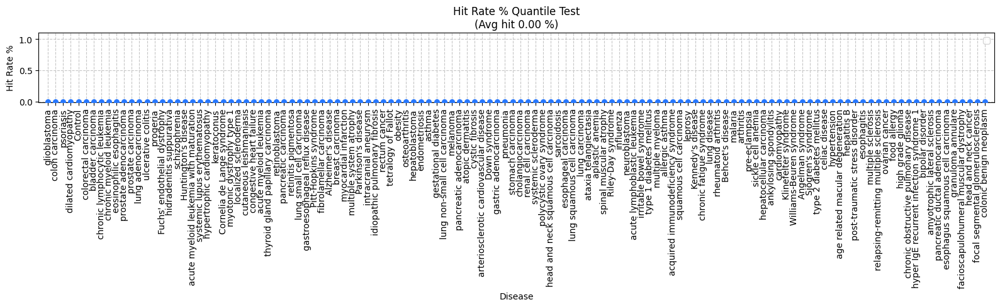

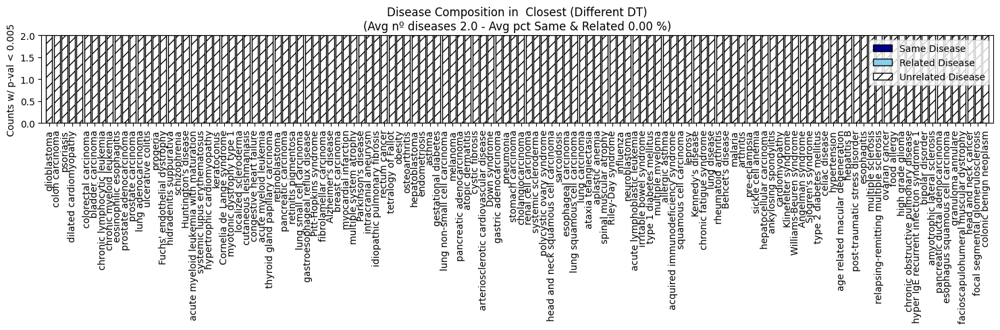

100%|██████████| 5248/5248 [00:13<00:00, 390.44it/s]
/tmp/ipykernel_232558/2339552335.py:181: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


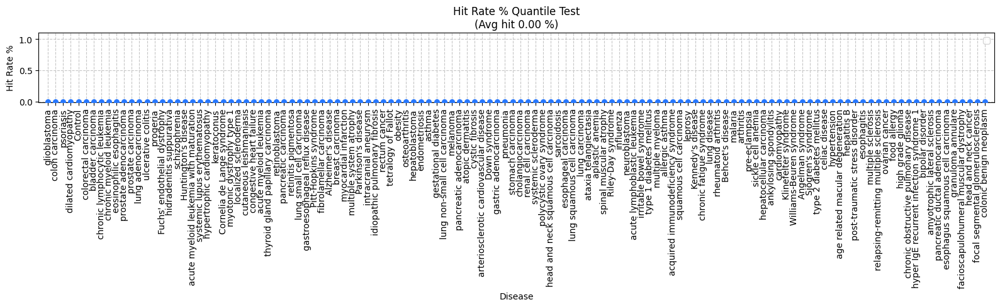

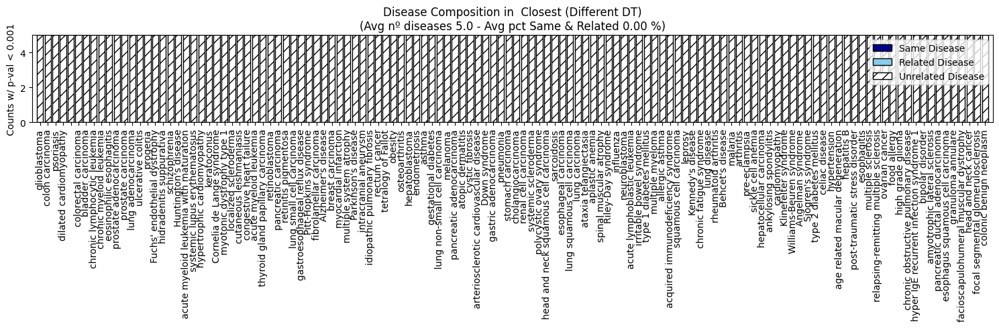

In [34]:
key_interest = "qtl_test_99_bonf"
pval = 0.005
df_counts = get_stats_counts(df_stats, rel_map, key_interest, pval=pval, top_k=None)
_d_counts = df_counts.groupby("query_doid")["hits_same"].mean().to_dict()
_x_val = [_d_counts.get(d, 0) for d in doids_sorted]
plot_lollipop(_x_val, dis_sorted, f"Hit Rate % Quantile Test\n(Avg hit {np.mean(_x_val)*100:.2f} %)", metric="Hit Rate %", color="#2778ff")

barplot_composition(
    [doid_to_term.get(d) for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_same"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_rel"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_unrel"].mean() for d in doids_sorted],
    title=f"Disease Composition in  Closest (Different DT)\n(Avg nº diseases {df_counts.groupby('query_doid')['n_total'].mean().mean():.1f} - Avg pct Same & Related {100-df_counts.groupby('query_doid')['pct_unrel'].mean().mean():.2f} %)",
    y_lab=f"Counts w/ p-val < {pval}"
)


key_interest = "qtl_test_95_bonf"
pval = 0.001
df_counts = get_stats_counts(df_stats, rel_map, key_interest, pval=pval, top_k=None)
_d_counts = df_counts.groupby("query_doid")["hits_same"].mean().to_dict()
_x_val = [_d_counts.get(d, 0) for d in doids_sorted]
plot_lollipop(_x_val, dis_sorted, f"Hit Rate % Quantile Test\n(Avg hit {np.mean(_x_val)*100:.2f} %)", metric="Hit Rate %", color="#2778ff")

barplot_composition(
    [doid_to_term.get(d) for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_same"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_rel"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_unrel"].mean() for d in doids_sorted],
    title=f"Disease Composition in  Closest (Different DT)\n(Avg nº diseases {df_counts.groupby('query_doid')['n_total'].mean().mean():.1f} - Avg pct Same & Related {100-df_counts.groupby('query_doid')['pct_unrel'].mean().mean():.2f} %)",
    y_lab=f"Counts w/ p-val < {pval}"
)



100%|██████████| 5248/5248 [00:13<00:00, 382.72it/s]
/tmp/ipykernel_232558/1567546241.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_train.obs.groupby("doid_id")["dataset"].nunique()>=5
/tmp/ipykernel_232558/1567546241.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  _doids_order = [k for k, v in dict(adata_train.obs.groupby("doid_id")["dataset"].nunique()).items() if k != "Control" and v >= 5]
/tmp/ipykernel_232558/2339552335.py:181: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no arg

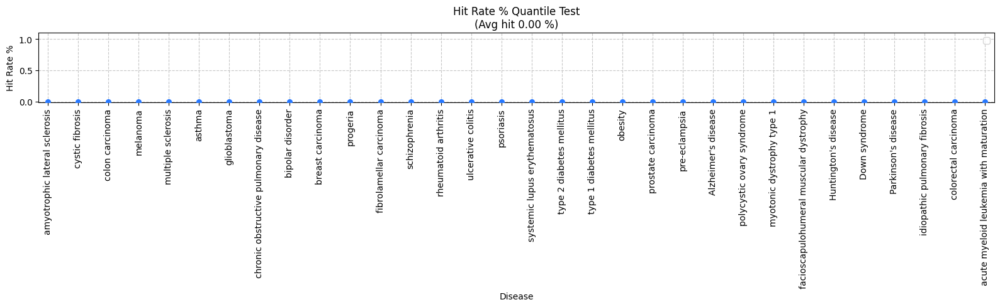

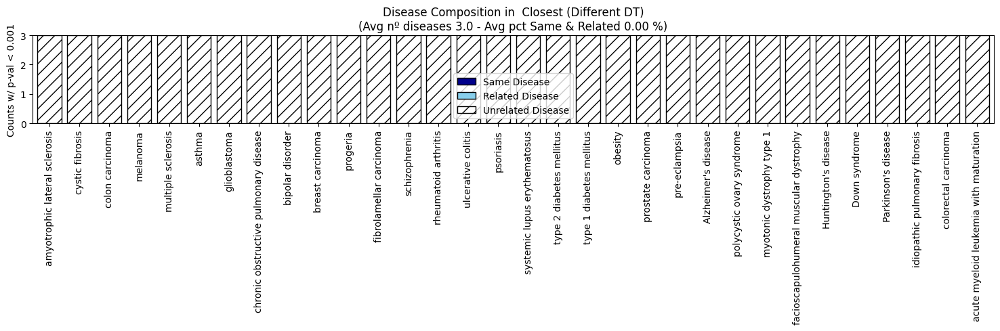

In [35]:
key_interest = "qtl_test_99"
pval = 0.001
df_counts = get_stats_counts(df_stats, rel_map, key_interest, pval=pval)

adata_train.obs.groupby("doid_id")["dataset"].nunique()>=5

_doids_order = [k for k, v in dict(adata_train.obs.groupby("doid_id")["dataset"].nunique()).items() if k != "Control" and v >= 5]

# _doids_order = df_counts.groupby("query_doid")["pct_unrel"].mean().sort_values(ascending=True).index.tolist()
_d_counts = df_counts.groupby("query_doid")["hits_same"].mean().to_dict()
_x_val = [_d_counts.get(d, 0) for d in _doids_order]
plot_lollipop(_x_val, [doid_to_term.get(d) for d in _doids_order], f"Hit Rate % Quantile Test\n(Avg hit {np.mean(_x_val)*100:.2f} %)", metric="Hit Rate %", color="#2778ff")

barplot_composition(
    [doid_to_term.get(d) for d in _doids_order],
    [df_counts.loc[df_counts["query_doid"] == d, "n_same"].mean() for d in _doids_order],
    [df_counts.loc[df_counts["query_doid"] == d, "n_rel"].mean() for d in _doids_order],
    [df_counts.loc[df_counts["query_doid"] == d, "n_unrel"].mean() for d in _doids_order],
    title=f"Disease Composition in  Closest (Different DT)\n(Avg nº diseases {df_counts.groupby('query_doid')['n_total'].mean().mean():.1f} - Avg pct Same & Related {100-df_counts.groupby('query_doid')['pct_unrel'].mean().mean():.2f} %)",
    y_lab=f"Counts w/ p-val < {pval}"
)

In [36]:
df_counts

,query_idx,query_doid,n_same,n_rel,n_unrel,n_total,n_total_unique,pct_same,pct_rel,pct_unrel,hits_same,hits_rel,prec@k
0,0,Control,0,0,3,3,3,0.0,0.0,100.0,0,0,0.0
1,1,Control,0,0,3,3,3,0.0,0.0,100.0,0,0,0.0
2,2,Control,0,0,3,3,3,0.0,0.0,100.0,0,0,0.0
3,3,Control,0,0,3,3,3,0.0,0.0,100.0,0,0,0.0
4,4,DOID:768,0,0,3,3,3,0.0,0.0,100.0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5243,5243,Control,0,0,3,3,3,0.0,0.0,100.0,0,0,0.0
5244,5244,DOID:635,0,0,3,3,3,0.0,0.0,100.0,0,0,0.0
5245,5245,DOID:635,0,0,3,3,3,0.0,0.0,100.0,0,0,0.0
5246,5246,DOID:635,0,0,3,3,3,0.0,0.0,100.0,0,0,0.0


100%|██████████| 5248/5248 [00:13<00:00, 377.76it/s]
/tmp/ipykernel_232558/2339552335.py:181: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


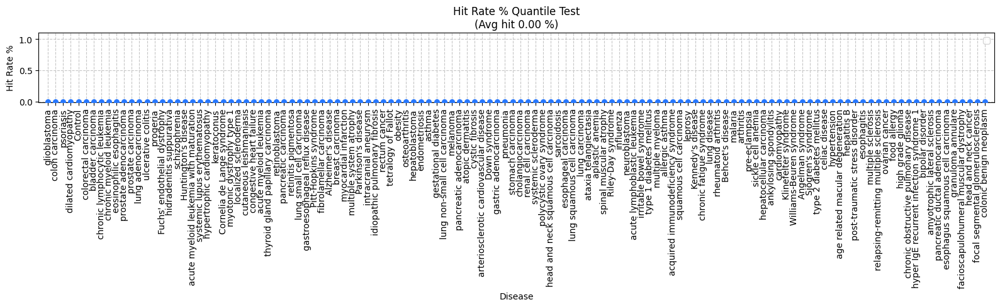

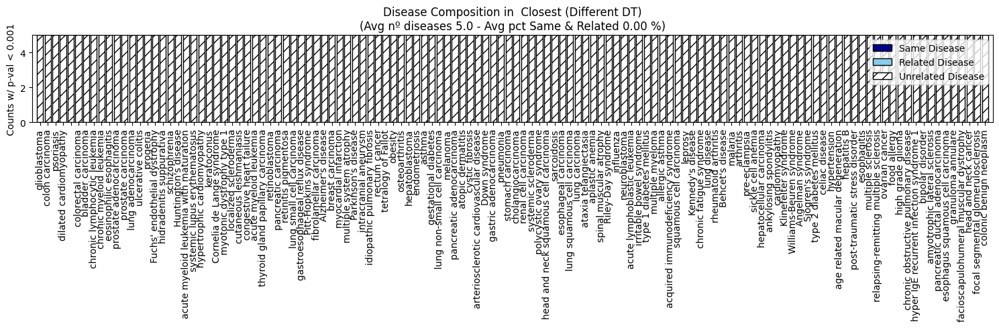

100%|██████████| 5248/5248 [00:13<00:00, 384.78it/s]
/tmp/ipykernel_232558/2339552335.py:181: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


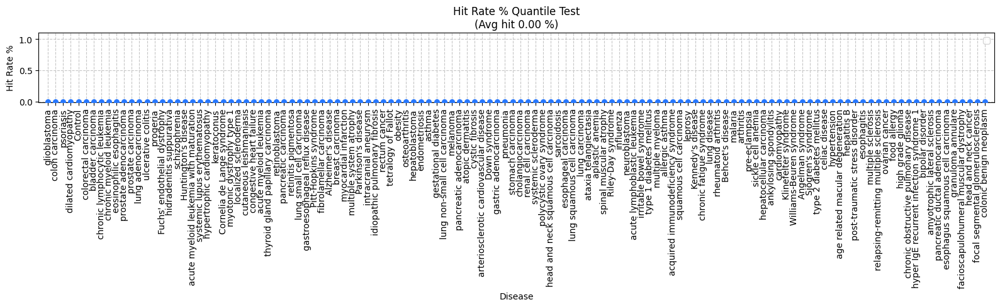

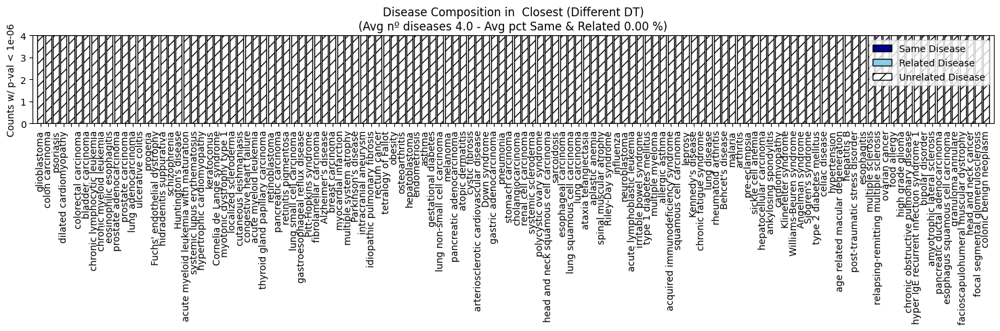

In [37]:
key_interest = "qtl_test_95_bonf"
pval = 0.001
df_counts = get_stats_counts(df_stats, rel_map, key_interest, pval=pval, top_k=None)
_d_counts = df_counts.groupby("query_doid")["hits_same"].mean().to_dict()
_x_val = [_d_counts.get(d, 0) for d in doids_sorted]
plot_lollipop(_x_val, dis_sorted, f"Hit Rate % Quantile Test\n(Avg hit {np.mean(_x_val)*100:.2f} %)", metric="Hit Rate %", color="#2778ff")

barplot_composition(
    [doid_to_term.get(d) for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_same"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_rel"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_unrel"].mean() for d in doids_sorted],
    title=f"Disease Composition in  Closest (Different DT)\n(Avg nº diseases {df_counts.groupby('query_doid')['n_total'].mean().mean():.1f} - Avg pct Same & Related {100-df_counts.groupby('query_doid')['pct_unrel'].mean().mean():.2f} %)",
    y_lab=f"Counts w/ p-val < {pval}"
)

key_interest = "qtl_test_95_bonf"
pval = 0.000001
df_counts = get_stats_counts(df_stats, rel_map, key_interest, pval=pval, top_k=None)
_d_counts = df_counts.groupby("query_doid")["hits_same"].mean().to_dict()
_x_val = [_d_counts.get(d, 0) for d in doids_sorted]
plot_lollipop(_x_val, dis_sorted, f"Hit Rate % Quantile Test\n(Avg hit {np.mean(_x_val)*100:.2f} %)", metric="Hit Rate %", color="#2778ff")

barplot_composition(
    [doid_to_term.get(d) for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_same"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_rel"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_unrel"].mean() for d in doids_sorted],
    title=f"Disease Composition in  Closest (Different DT)\n(Avg nº diseases {df_counts.groupby('query_doid')['n_total'].mean().mean():.1f} - Avg pct Same & Related {100-df_counts.groupby('query_doid')['pct_unrel'].mean().mean():.2f} %)",
    y_lab=f"Counts w/ p-val < {pval}"
)

In [38]:
if "query_dis" not in df_stats.columns:
    df_stats.insert(2, "query_dis", df_stats["query_doid"].map(doid_to_term))
    df_stats.insert(2, "ref_dis", df_stats["ref_doid"].map(doid_to_term))


In [39]:
df_stats.query("query_dis == 'asthma'")


,query_idx,query_doid,ref_dis,query_dis,ref_doid,qtl_test_50,qtl_test_90,qtl_test_95,qtl_test_99,qtl_test_50_bonf,qtl_test_90_bonf,qtl_test_95_bonf,qtl_test_99_bonf
375596,3029,DOID:2841,chronic obstructive pulmonary disease,asthma,DOID:3083,2.193067e-31,0.038711,0.207593,0.436271,2.719403e-29,1.0,1.0,1.0
375597,3029,DOID:2841,Down syndrome,asthma,DOID:14250,9.993753e-01,0.999845,0.979774,1.000000,1.000000e+00,1.0,1.0,1.0
375598,3029,DOID:2841,pneumonia,asthma,DOID:552,8.125000e-01,1.000000,1.000000,1.000000,1.000000e+00,1.0,1.0,1.0
375599,3029,DOID:2841,chronic myeloid leukemia,asthma,DOID:8552,1.000000e+00,0.962060,0.561530,1.000000,1.000000e+00,1.0,1.0,1.0
375600,3029,DOID:2841,hepatocellular carcinoma,asthma,DOID:684,9.999959e-01,1.000000,1.000000,1.000000,1.000000e+00,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
378195,3049,DOID:2841,endometriosis,asthma,DOID:289,9.975483e-01,0.918448,0.969436,1.000000,1.000000e+00,1.0,1.0,1.0
378196,3049,DOID:2841,Down syndrome,asthma,DOID:14250,1.076839e-04,0.999845,0.999771,1.000000,1.335280e-02,1.0,1.0,1.0
378197,3049,DOID:2841,Parkinson's disease,asthma,DOID:14330,5.145192e-04,1.000000,1.000000,1.000000,6.380039e-02,1.0,1.0,1.0
378198,3049,DOID:2841,multiple myeloma,asthma,DOID:9538,2.119751e-01,1.000000,1.000000,1.000000,1.000000e+00,1.0,1.0,1.0


100%|██████████| 3611/3611 [00:06<00:00, 527.33it/s]
/tmp/ipykernel_232558/2339552335.py:181: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


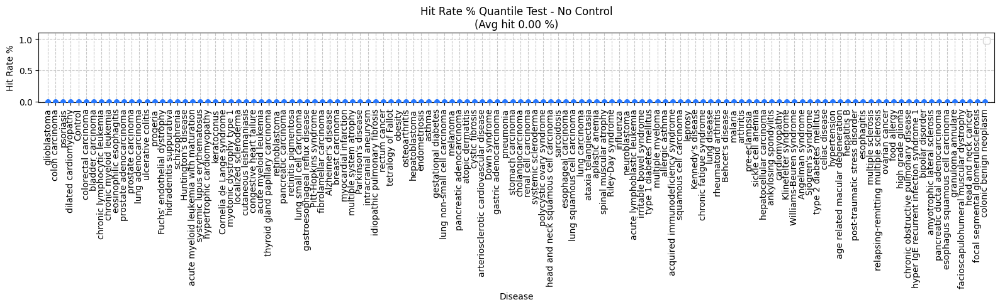

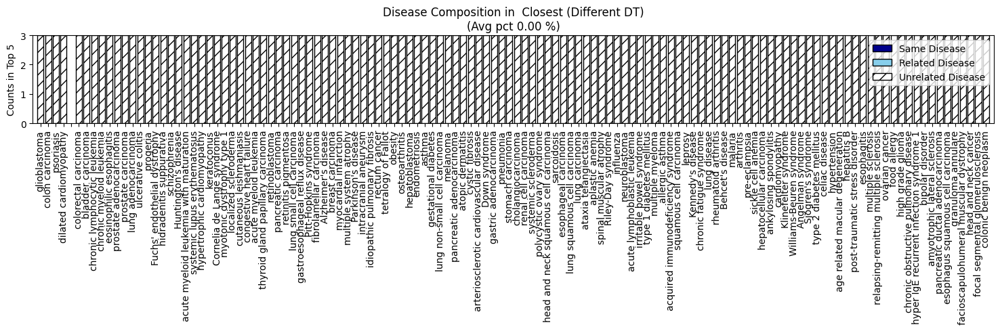

In [40]:
key_interest = "qtl_test_99"

df_counts = get_stats_counts(df_stats_no_ctrl, rel_map, key_interest, pval=0.001, top_k=3)
_d_counts = df_counts.groupby("query_doid")["hits_same"].mean().to_dict()
_x_val = [_d_counts.get(d, 0) for d in doids_sorted]
plot_lollipop(_x_val, dis_sorted, f"Hit Rate % Quantile Test - No Control\n(Avg hit {np.mean(_x_val)*100:.2f} %)", metric="Hit Rate %", color="#2778ff")

barplot_composition(
    [doid_to_term.get(d) for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_same"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_rel"].mean() for d in doids_sorted],
    [df_counts.loc[df_counts["query_doid"] == d, "n_unrel"].mean() for d in doids_sorted],
    title=f"Disease Composition in  Closest (Different DT)\n(Avg pct {100-df_counts.groupby('query_doid')['pct_unrel'].mean().mean():.2f} %)",
    y_lab="Counts in Top 5"
)

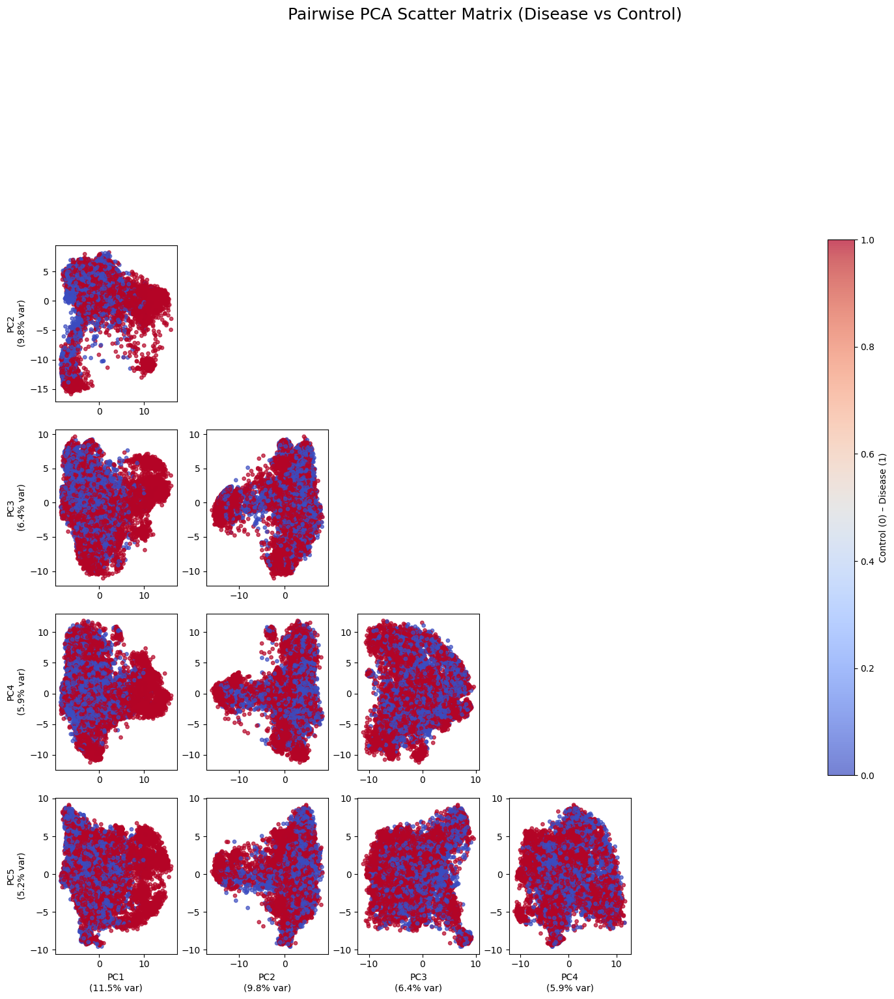

In [41]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

# Perform PCA
pca = PCA(n_components=5)
pca_result = pca.fit_transform(embeddings_train)
var_explained = pca.explained_variance_ratio_ * 100

# Label colors
labels = ["Control" if doid == "Control" else "Disease" for doid in adata_train.obs["doid_id"]]
colors = np.array([0 if l == "Control" else 1 for l in labels])

# Set up the grid
n_components = pca.n_components
fig, axes = plt.subplots(n_components, n_components, figsize=(3*n_components, 3*n_components))
cmap = "coolwarm"

for i in range(n_components):
    for j in range(n_components):
        ax = axes[i, j]
        if i > j:
            sc = ax.scatter(
                pca_result[:, j],
                pca_result[:, i],
                c=colors,
                cmap=cmap,
                alpha=0.7,
                s=15
            )
        else:
            ax.axis("off")

        # Label only edge axes for readability
        if i == n_components - 1 and i > j:
            ax.set_xlabel(f"PC{j+1}\n({var_explained[j]:.1f}% var)")
        if j == 0 and i > 0:
            ax.set_ylabel(f"PC{i+1}\n({var_explained[i]:.1f}% var)")

plt.suptitle("Pairwise PCA Scatter Matrix (Disease vs Control)", fontsize=18, y=1.02)
plt.tight_layout()
fig.colorbar(sc, ax=axes, location='right', shrink=0.6, label="Control (0) – Disease (1)")
plt.show()


In [42]:
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# --- Perform PCA ---
pca = PCA(n_components=5)
pca_result = pca.fit_transform(embeddings_test)
var_explained = pca.explained_variance_ratio_ * 100


<Figure size 500x500 with 0 Axes>

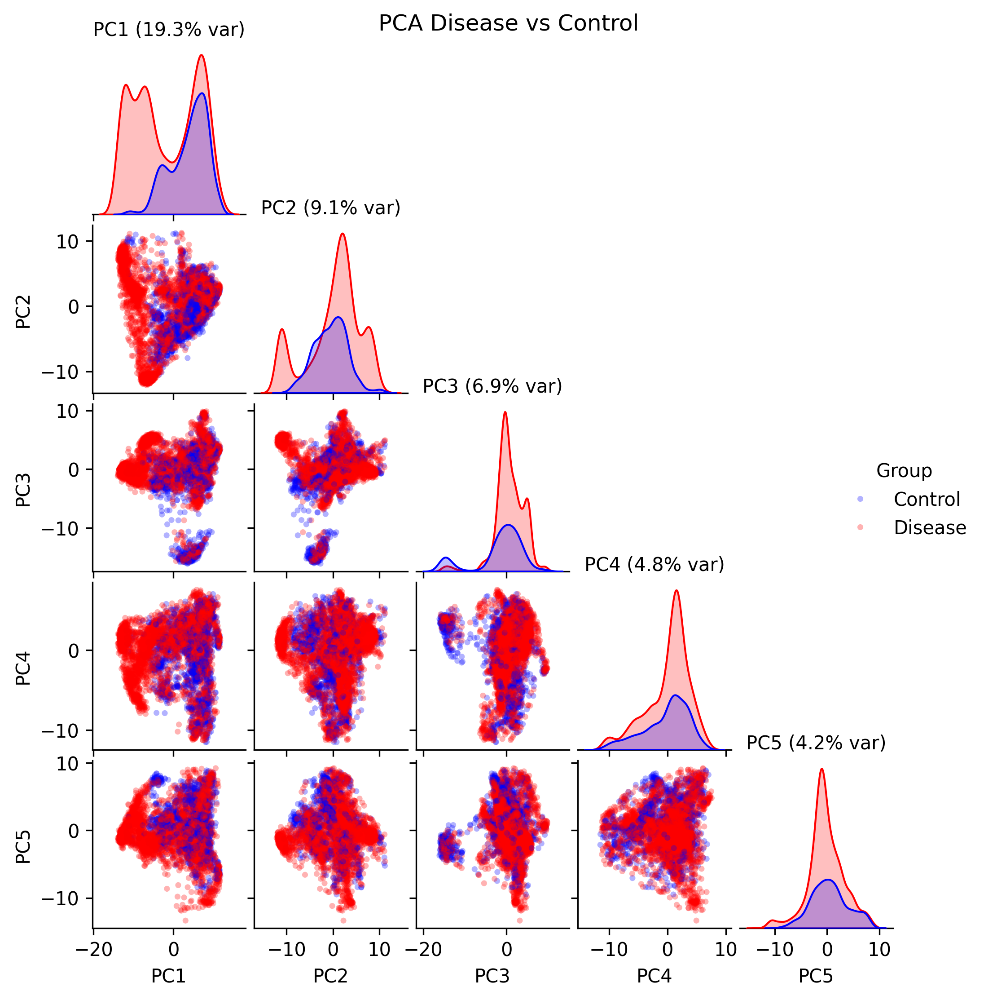

In [43]:

# --- Build dataframe for seaborn ---
pca_df = pd.DataFrame(pca_result, columns=[f"PC{i+1}" for i in range(pca.n_components)])
pca_df["Group"] = ["Control" if doid == "Control" else "Disease" for doid in adata_test.obs["doid_id"]]

plt.figure(figsize=(5, 5))

# --- Pairplot ---
g = sns.pairplot(
    data=pca_df,
    vars=[f"PC{i+1}" for i in range(pca.n_components)],
    hue="Group",
    # palette="coolwarm",
    palette={"Control": "blue", "Disease": "red"},
    corner=True,  # shows only lower triangle
    diag_kind="kde",  # KDE on the diagonal
    plot_kws=dict(alpha=0.3, s=10, linewidth=0)
)

# --- Label variance explained ---
for i, ax in enumerate(np.diag(g.axes)):
    ax.set_title(f"PC{i+1} ({var_explained[i]:.1f}% var)", fontsize=10)

g.fig.set_size_inches(7, 7)  # total figure size (optional override)
g.fig.set_dpi(300)
g.fig.suptitle("PCA Disease vs Control", y=1.02)
plt.show()


### ROC AUC

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from scanpy import AnnData
import random
from tqdm import tqdm
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def get_perf_per_dis(adata_qry:AnnData, adata_ref:AnnData, rel_map:dict, c_matrix:np.ndarray, doid_to_term:dict, use_control:bool=True, remove_same_dataset:bool=False)->pd.DataFrame:
    results_per_dis = list()
    adata_qry.obs.reset_index(inplace=True, drop=True)
    adata_ref.obs.reset_index(inplace=True, drop=True)
    aggr_method = lambda x: np.percentile(x, 99, axis=1)
    aggr_method = lambda x: np.percentile(x, 95, axis=1)
    # aggr_method = lambda x: np.percentile(x, 90, axis=1)

    # aggr_method = lambda x: np.max(x, axis=1)
    for doid_i in tqdm(adata_qry.obs["doid_id"].unique(), desc="Processing samples"):
        
        if doid_i == "Control":
            continue
        
        # get related & unrelated diseases
        related_i = rel_map.get(doid_i, set())
        unrelated_i = set(adata_ref.obs.query(f"(doid_id not in @related_i) & (doid_id != @doid_i) & (doid_id != 'Control')")["doid_id"].values)

        # same disease idxs
        idx_1 = np.array(adata_qry.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)   
        idx_2 = np.array(adata_ref.obs.query(f"(doid_id == '{doid_i}')").index).astype(int) 
        
        idx_pairs_same = np.array(list(itertools.product(idx_1, idx_2)))
        same_block = c_matrix[np.ix_(idx_1, idx_2)]
        s_same = aggr_method(same_block)
        # related diseases
        s_related = list()
        for rel_doid in related_i:
            idx_rel = np.array(adata_ref.obs.query(f"(doid_id == '{rel_doid}')").index).astype(int)
            rel_block = c_matrix[np.ix_(idx_1, idx_rel)]
            s_related.extend(aggr_method(rel_block))

        # unrelated diseases
        s_unrelated = list()
        for unr_doid in unrelated_i:
            idx_unr = np.array(adata_ref.obs.query(f"(doid_id == '{unr_doid}')").index).astype(int)
            unr_block = c_matrix[np.ix_(idx_1, idx_unr)]
            s_unrelated.extend(aggr_method(unr_block))

        s_same = list(s_same)
        s_related = list(s_related)
        s_unrelated = list(s_unrelated)

        # same disease vs unrelated
        rel_ap_i = average_precision_score(
            [1] * (len(s_same) + len(s_related)) + [0] * len(s_unrelated),
            s_same + s_related + s_unrelated
        )
        rel_random_i = (1 + len(s_related)) / (len(s_same) + len(s_related) + len(s_unrelated)) if (len(s_same) + len(s_related) + len(s_unrelated)) > 0 else 0
        rel_auroc_i = roc_auc_score(
            [1] * (len(s_same) + len(s_related)) + [0] * len(s_unrelated),
            s_same + s_related + s_unrelated
        )


        # same disease vs unrelated
        ap_i = average_precision_score(
            [1]*len(s_same) + [0] * len(s_unrelated),
            s_same + s_unrelated
        )
        random_i = (len(s_same)) / (len(s_same) + len(s_unrelated)) if (len(s_same) + len(s_unrelated)) > 0 else 0
        auroc_i = roc_auc_score(
            [1]*len(s_same) + [0] * len(s_unrelated),
            s_same  + s_unrelated
        )

        # return [s_same, s_unrelated]

        results_per_dis.append({
            "doid_id": doid_i,
            "disease": doid_to_term.get(doid_i),
            "ap": ap_i,
            "random": random_i,
            "auroc": auroc_i,
            "precision": precision_score([1] * len(s_same) + [0] * len(s_unrelated),np.where(np.concatenate([s_same, s_unrelated]) >= 0.7, 1, 0)),
            "recall": recall_score([1] * len(s_same) + [0] * len(s_unrelated),np.where(np.concatenate([s_same, s_unrelated]) >= 0.7, 1, 0)),
            "n_same_query": len(idx_1),
            "n_same_ref": len(idx_2),
            "rel_ap": rel_ap_i,
            "rel_random": rel_random_i,
            "rel_auroc": rel_auroc_i
        })



    df_per_dis = pd.DataFrame(results_per_dis)
    return df_per_dis

df_test_per_dis = get_perf_per_dis(adata_test, adata_train, rel_map, c_matrix_test_vs_train, doid_to_term)
df_valid_per_dis = get_perf_per_dis(adata_valid, adata_train, rel_map,c_matrix_valid_vs_train, doid_to_term)


Processing samples:   2%|▏         | 2/124 [00:00<00:09, 12.29it/s]/home/ddalton/Data/old_home/miniconda3/envs/scgpt_2/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
Processing samples:  35%|███▍      | 43/124 [00:07<00:13,  5.98it/s]/home/ddalton/Data/old_home/miniconda3/envs/scgpt_2/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
Processing samples:  75%|███████▌  | 93/124 [00:15<00:04,  6.28it/s]/home/ddalton/Data/old_home/miniconda3/envs/scgpt_2/lib/python3.12/site-packages/sklearn/metrics/

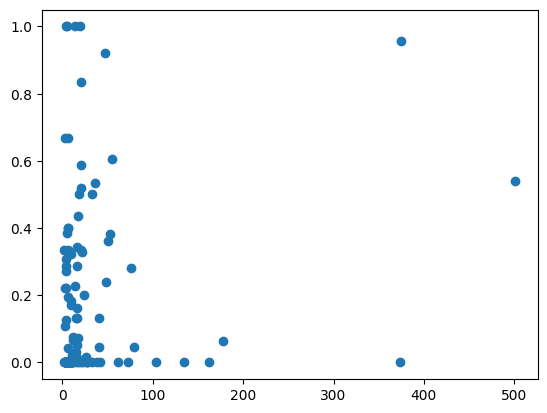

In [45]:

plt.scatter( df_test_per_dis["n_same_query"], df_test_per_dis["precision"])

In [46]:
df_test_per_dis

,doid_id,disease,ap,random,auroc,precision,recall,n_same_query,n_same_ref,rel_ap,rel_random,rel_auroc
0,DOID:768,retinoblastoma,1.000000,0.008547,1.000000,1.000000,1.000000,5,5,0.681548,0.050407,0.920000
1,DOID:11722,myotonic dystrophy type 1,0.368715,0.008197,0.993479,0.133333,1.000000,16,49,0.520274,0.008638,0.993705
2,DOID:5517,stomach carcinoma,0.658730,0.012048,0.994634,0.000000,0.000000,5,52,0.512214,0.326829,0.585521
3,DOID:8552,chronic myeloid leukemia,0.827882,0.008621,0.996348,0.172414,1.000000,10,79,0.903641,0.057724,0.988239
4,DOID:235,colonic benign neoplasm,0.006047,0.010101,0.040249,0.000000,0.000000,6,3,0.453058,0.196477,0.618152
...,...,...,...,...,...,...,...,...,...,...,...,...
118,DOID:0080199,colorectal carcinoma,0.508259,0.010989,0.710417,0.285714,0.500000,4,317,0.543360,0.262195,0.734764
119,DOID:1932,Angelman syndrome,0.101376,0.008130,0.953552,0.107143,1.000000,3,2,0.101376,0.002710,0.953552
120,DOID:8534,gastroesophageal reflux disease,0.637542,0.009091,0.983690,0.333333,0.666667,6,5,0.361524,0.107046,0.721749
121,DOID:3910,lung adenocarcinoma,0.718125,0.011364,0.991200,0.000000,0.000000,8,479,0.703376,0.285569,0.870505


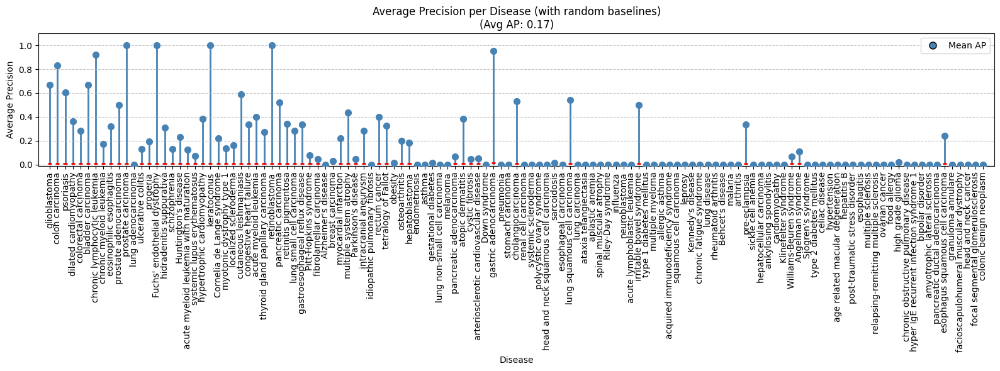

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

doids_sorted_no_ctrl = [x for x in doids_sorted if x != "Control"]

# plot values
plot_data = df_test_per_dis.groupby("doid_id")["precision"].mean().to_dict()
x_vals = [plot_data.get(d, np.nan) for d in doids_sorted_no_ctrl]

# random values
random_vals = df_test_per_dis.groupby("doid_id")["random"].mean().to_dict()
random_x_vals = [random_vals.get(d, np.nan) for d in doids_sorted_no_ctrl]

# numeric positions for categories
xpos = np.arange(len(doids_sorted_no_ctrl))

plt.figure(figsize=(16, 6))
plt.scatter(xpos, x_vals, color="steelblue", s=50, zorder=3)  # dots

# small horizontal red lines centered at each x
half_len = 0.25  # half-length of the red segment
for i, y in enumerate(random_x_vals):
    if np.isfinite(y):
        plt.hlines(y, i - half_len, i + half_len, color="red", linewidth=2, zorder=2)

# stems first (so dots appear on top)
plt.vlines(np.arange(len(doids_sorted_no_ctrl)), 0.0, x_vals, color="steelblue", alpha=1, linewidth=2, zorder=1)

# cosmetics
plt.xticks(xpos, [doid_to_term.get(d) for d in doids_sorted_no_ctrl], rotation=90)
plt.margins(x=0.01, y=0.1)
plt.ylim(-0.01, 1.1)
plt.grid(axis='y', linestyle='--', alpha=0.7, zorder=2)

# labels / title (note: you're plotting average_precision, not AUROC)
plt.xlabel("Disease")
plt.ylabel("Average Precision")
plt.title(f"Average Precision per Disease (with random baselines)\n(Avg AP: {np.nanmean(x_vals):.2f})")

# legend entries for point and red segments
legend_elems = [
    Line2D([0], [0], marker='o', color='none', markerfacecolor='steelblue', markersize=8, label='Mean AP'),
]
plt.legend(handles=legend_elems, loc='best')

plt.tight_layout()
plt.show()

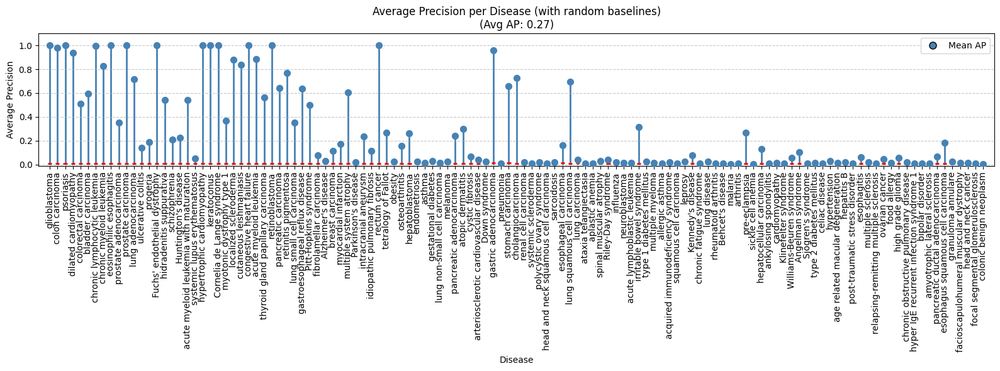

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

doids_sorted_no_ctrl = [x for x in doids_sorted if x != "Control"]

# plot values
plot_data = df_test_per_dis.groupby("doid_id")["ap"].mean().to_dict()
x_vals = [plot_data.get(d, np.nan) for d in doids_sorted_no_ctrl]

# random values
random_vals = df_test_per_dis.groupby("doid_id")["random"].mean().to_dict()
random_x_vals = [random_vals.get(d, np.nan) for d in doids_sorted_no_ctrl]

# numeric positions for categories
xpos = np.arange(len(doids_sorted_no_ctrl))

plt.figure(figsize=(16, 6))
plt.scatter(xpos, x_vals, color="steelblue", s=50, zorder=3)  # dots

# small horizontal red lines centered at each x
half_len = 0.25  # half-length of the red segment
for i, y in enumerate(random_x_vals):
    if np.isfinite(y):
        plt.hlines(y, i - half_len, i + half_len, color="red", linewidth=2, zorder=2)

# stems first (so dots appear on top)
plt.vlines(np.arange(len(doids_sorted_no_ctrl)), 0.0, x_vals, color="steelblue", alpha=1, linewidth=2, zorder=1)

# cosmetics
plt.xticks(xpos, [doid_to_term.get(d) for d in doids_sorted_no_ctrl], rotation=90)
plt.margins(x=0.01, y=0.1)
plt.ylim(-0.01, 1.1)
plt.grid(axis='y', linestyle='--', alpha=0.7, zorder=2)

# labels / title (note: you're plotting average_precision, not AUROC)
plt.xlabel("Disease")
plt.ylabel("Average Precision")
plt.title(f"Average Precision per Disease (with random baselines)\n(Avg AP: {np.nanmean(x_vals):.2f})")

# legend entries for point and red segments
legend_elems = [
    Line2D([0], [0], marker='o', color='none', markerfacecolor='steelblue', markersize=8, label='Mean AP'),
]
plt.legend(handles=legend_elems, loc='best')

plt.tight_layout()
plt.show()

In [49]:

# plot values
plot_data = df_test_per_dis.groupby("doid")["roc_auc"].mean().to_dict()
x_vals = [plot_data.get(d, np.nan) for d in doids_sorted]

# random values
random_vals = df_test_per_dis.groupby("doid")["random"].mean().to_dict()
random_x_vals = [random_vals.get(d, np.nan) for d in doids_sorted]

# numeric positions for categories
xpos = np.arange(len(doids_sorted))

plt.figure(figsize=(16, 6))
plt.scatter(xpos, x_vals, color="steelblue", s=50, zorder=3)  # dots

# small horizontal red lines centered at each x
plt.axhline(y=0.5, color='gray', linestyle='--', linewidth=1, zorder=-1)

# stems first (so dots appear on top)
plt.vlines(np.arange(len(doids_sorted)), 0.0, x_vals, color="steelblue", alpha=1, linewidth=2, zorder=2)

# cosmetics
plt.xticks(xpos, [doid_to_term.get(d, d) for d in doids_sorted], rotation=90)
plt.margins(x=0.01, y=0.1)
plt.ylim(-0.01, 1.1)
plt.grid(linestyle='--', alpha=0.7, zorder=-3)

# labels / title (note: you're plotting average_precision, not AUROC)
plt.xlabel("Disease")
plt.ylabel("ROC AUC")
plt.title("ROC AUC per Disease")

# legend entries for point and red segments
plt.legend(loc='best')

plt.tight_layout()

KeyError: 'doid'

In [ ]:
def get_perf_per_dis(adata_qry:AnnData, adata_ref:AnnData, rel_map:dict, c_matrix:np.ndarray, doid_to_term:dict, use_control:bool=True)->pd.DataFrame:
    results_per_dis = list()
    adata_qry.obs.reset_index(inplace=True, drop=True)
    adata_ref.obs.reset_index(inplace=True, drop=True)
    for doid_i in tqdm(adata_qry.obs["doid_id"].unique()):
        if doid_i == "Control":
            continue
        # get related & unrelated diseases
        related_i = rel_map.get(doid_i, set())

        # unrelated_i = set(df_unrelated.query(f"do1 == '{doid_i}'")["do2"].values)
        # unrelated_i = unrelated_i.union(set(df_unrelated.query(f"do2 == '{doid_i}'")["do1"].values))
        # unrelated_i = list(unrelated_i)

        # get idxs
        idx_1 = np.array(adata_qry.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)    # query disease
        idx_2 = np.array(adata_ref.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)    # reference disease
        idx_3 = np.array(adata_ref.obs.query(f"(doid_id in @related_i)").index).astype(int)  # reference unrelated diseases
        # idx_4 = np.array(adata_ref.obs.query(f"(doid_id in @unrelated_i)").index).astype(int)  # reference unrelated diseases
        
        if use_control: # get dsaids of unrelated diseases which include controls!
            unr_dsaids = adata_ref.obs.query(f"(doid_id not in @related_i) & (doid_id != @doid_i) & (doid_id != 'Control')")["dsaid"].unique()
            idx_5 = np.array(adata_ref.obs.query(f"(dsaid in @unr_dsaids)").index).astype(int)  # reference unrelated diseases

        else:   # only unrelated diseases, no controls
            idx_5 = np.array(adata_ref.obs.query(f"(doid_id not in @related_i) & (doid_id != @doid_i) & (doid_id != 'Control')").index).astype(int)  # reference unrelated diseases

        if len(idx_1) == 0 or len(idx_2) == 0 or len(idx_5) == 0:
            print(f"Skipping {doid_i} - {doid_to_term.get(doid_i)} due to lack of pairs")
            print(f"Nº same: {len(idx_2)}\tNº unrelated: {len(idx_5)}")
            continue
            
        idx_pairs_1 = np.array(list(itertools.product(idx_1, idx_2)))
        idx_pairs_2 = np.array(list(itertools.product(idx_1, idx_5)))

        _s_same = c_matrix[idx_pairs_1[:, 0], idx_pairs_1[:, 1]]
        _s_unrelated = c_matrix[idx_pairs_2[:, 0], idx_pairs_2[:, 1]]        

        # results per disease
        ap_i = average_precision_score(
            [1] * len(_s_same) + [0] * (len(_s_unrelated)),
            np.concatenate([_s_same, _s_unrelated])
        )
        random_i = len(_s_same) / (len(_s_same) + len(_s_unrelated)) if (len(_s_same) + len(_s_unrelated)) > 0 else 0
        auroc_i = roc_auc_score(
            [1] * len(_s_same) + [0] * (len(_s_same)),
            np.concatenate([_s_same, np.array(random.sample(list(_s_unrelated), len(_s_same)))])
        )
        
        results_per_dis.append({
            "average_precision": ap_i,
            "roc_auc": auroc_i,
            "random": random_i,
            "disease": doid_to_term.get(doid_i),
            "doid": doid_i,
            "n_positives": len(_s_same),
            "n_unrelated": len(_s_unrelated),
        })

    df_per_dis = pd.DataFrame(results_per_dis)

    return df_per_dis


def get_perf_per_smp(adata_qry:AnnData, adata_ref:AnnData, rel_map:dict, c_matrix:np.ndarray, doid_to_term:dict, use_control:bool=True, remove_same_dataset:bool=False)->pd.DataFrame:
    results_per_dis = list()
    adata_qry.obs.reset_index(inplace=True, drop=True)
    adata_ref.obs.reset_index(inplace=True, drop=True)
    for i, r in tqdm(adata_qry.obs.iterrows(), total=adata_qry.n_obs, desc="Processing samples"):
        doid_i = r["doid_id"]
        if doid_i == "Control":
            continue
        # get related & unrelated diseases
        related_i = rel_map.get(doid_i, set())

        # unrelated_i = set(df_unrelated.query(f"do1 == '{doid_i}'")["do2"].values)
        # unrelated_i = unrelated_i.union(set(df_unrelated.query(f"do2 == '{doid_i}'")["do1"].values))
        # unrelated_i = list(unrelated_i)

        # get idxs
        idx_1 = np.array([i])    # query disease
        idx_2 = np.array(adata_ref.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)    # reference disease
        idx_3 = np.array(adata_ref.obs.query(f"(doid_id in @related_i)").index).astype(int)  # reference unrelated diseases
        
        if use_control: # get dsaids of unrelated diseases which include controls!
            unr_dsaids = adata_ref.obs.query(f"(doid_id not in @related_i) & (doid_id != @doid_i) & (doid_id != 'Control')")["dsaid"].unique()
            idx_4 = np.array(adata_ref.obs.query(f"(dsaid in @unr_dsaids)").index).astype(int)  # reference unrelated diseases

        else:   # only unrelated diseases, no controls
            idx_4 = np.array(adata_ref.obs.query(f"(doid_id not in @related_i) & (doid_id != @doid_i) & (doid_id != 'Control')").index).astype(int)  # reference unrelated diseases

        if len(idx_1) == 0 or len(idx_2) == 0 or len(idx_4) == 0:
            print(f"Skipping {doid_i} - {doid_to_term.get(doid_i)} due to lack of pairs")
            print(f"Nº same: {len(idx_2)}\tNº unrelated: {len(idx_4)}")
            continue
            
        idx_pairs_1 = np.array(list(itertools.product(idx_1, idx_2)))
        idx_pairs_2 = np.array(list(itertools.product(idx_1, idx_3)))
        idx_pairs_3 = np.array(list(itertools.product(idx_1, idx_4)))

        _s_same = c_matrix[idx_pairs_1[:, 0], idx_pairs_1[:, 1]]
        _s_related = c_matrix[idx_pairs_2[:, 0], idx_pairs_2[:, 1]]
        _s_unrelated = c_matrix[idx_pairs_3[:, 0], idx_pairs_3[:, 1]]        

        # results per disease
        ap_i = average_precision_score(
            [1] * len(_s_same) + [0] * (len(_s_unrelated)),
            np.concatenate([_s_same, _s_unrelated])
        )
        random_i = len(_s_same) / (len(_s_same) + len(_s_unrelated)) if (len(_s_same) + len(_s_unrelated)) > 0 else 0
        auroc_i = roc_auc_score(
            [1] * len(_s_same) + [0] * (len(_s_same)),
            np.concatenate([_s_same, np.array(random.sample(list(_s_unrelated), len(_s_same)))])
        )
        
        # results for smae + related vs unrelated !
        ap_i = average_precision_score(
            [1] * (len(_s_same) + len(_s_related)) + [0] * (len(_s_unrelated)),
            np.concatenate([_s_same, _s_related, _s_unrelated])
        )
        random_i = (len(_s_same) + len(_s_related)) / (len(_s_same) + len(_s_related) + len(_s_unrelated)) if (len(_s_same) + len(_s_related) + len(_s_unrelated)) > 0 else 0
        auroc_i = roc_auc_score(
            [1] * (len(_s_same) + len(_s_related)) + [0] * (len(_s_same) + len(_s_related)),
            np.concatenate([_s_same, _s_related, np.array(random.sample(list(_s_unrelated), len(_s_same) + len(_s_related)))])
        )


        results_per_dis.append({
            "average_precision": ap_i,
            "roc_auc": auroc_i,
            "random": random_i,
            "disease": doid_to_term.get(doid_i),
            "doid": doid_i,
            "n_positives": len(_s_same),
            "n_unrelated": len(_s_unrelated),
        })


    df_per_dis = pd.DataFrame(results_per_dis)

    return df_per_dis



def get_perf_per_dis_2(adata_qry:AnnData, adata_ref:AnnData, df_related:pd.DataFrame, df_unrelated:pd.DataFrame, c_matrix:np.ndarray, doid_to_term:dict)->pd.DataFrame:
    results_per_dis = list()
    for doid_i in tqdm(adata_qry.obs["doid_id"].unique()):
        if doid_i == "Control":
            continue
        # get related & unrelated diseases
        related_i = set(df_related.query(f"do1 == '{doid_i}'")["do2"].values)
        related_i = related_i.union(set(df_related.query(f"do2 == '{doid_i}'")["do1"].values))
        related_i = list(related_i)

        unrelated_i = set(df_unrelated.query(f"do1 == '{doid_i}'")["do2"].values)
        unrelated_i = unrelated_i.union(set(df_unrelated.query(f"do2 == '{doid_i}'")["do1"].values))
        unrelated_i = list(unrelated_i)

        # get idxs
        idx_1 = np.array(adata_qry.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)    # query disease
        idx_2 = np.array(adata_ref.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)    # reference disease
        idx_3 = np.array(adata_ref.obs.query(f"(doid_id in @related_i)").index).astype(int)  # reference unrelated diseases
        idx_4 = np.array(adata_ref.obs.query(f"(doid_id in @unrelated_i)").index).astype(int)  # reference unrelated diseases
        dsaids = adata_ref.obs.query(f"(doid_id in @unrelated_i)")["dsaid"].unique()
        idx_5 = np.array(adata_ref.obs.query(f"(dsaid in @dsaids)").index).astype(int)  # reference unrelated diseases
        # idx_5 = np.array(adata_ref.obs.query(f"(doid_id in @unrelated_i)").index).astype(int)  

        if len(idx_1) == 0 or len(idx_2) == 0 or len(idx_5) == 0:
            print(f"Skipping {doid_i} - {doid_to_term.get(doid_i)} due to lack of pairs")
            print(f"Nº same: {len(idx_2)}\tNº unrelated: {len(idx_5)}")
            continue
            
        idx_pairs_1 = np.array(list(itertools.product(idx_1, idx_2)))
        idx_pairs_2 = np.array(list(itertools.product(idx_1, idx_5)))

        _s_same = c_matrix[idx_pairs_1[:, 0], idx_pairs_1[:, 1]]
        _s_unrelated = c_matrix[idx_pairs_2[:, 0], idx_pairs_2[:, 1]]        

        # results per disease
        ap_i = average_precision_score(
            [1] * len(_s_same) + [0] * (len(_s_unrelated)),
            np.concatenate([_s_same, _s_unrelated])
        )
        random_i = len(_s_same) / (len(_s_same) + len(_s_unrelated)) if (len(_s_same) + len(_s_unrelated)) > 0 else 0
        auroc_i = roc_auc_score(
            [1] * len(_s_same) + [0] * (len(_s_same)),
            np.concatenate([_s_same, np.array(random.sample(list(_s_unrelated), len(_s_same)))])
        )
        
        results_per_dis.append({
            "average_precision": ap_i,
            "roc_auc": auroc_i,
            "random": random_i,
            "disease": doid_to_term.get(doid_i),
            "doid": doid_i,
            "n_positives": len(_s_same),
            "n_unrelated": len(_s_unrelated),
        })

    df_per_dis = pd.DataFrame(results_per_dis)

    return df_per_dis, dsaids

df_valid_per_dis = get_perf_per_dis(adata_valid, adata_train, rel_map,c_matrix_valid_vs_train, doid_to_term, use_control=False)
df_valid_per_smp = get_perf_per_smp(adata_valid, adata_train, rel_map,c_matrix_valid_vs_train, doid_to_term, use_control=False)
# df_valid_per_dis_2, u2 = get_perf_per_dis_2(adata_valid, adata_train, df_related, df_unrelated, c_matrix_valid_vs_train, doid_to_term)


Processing samples: 100%|██████████| 2034/2034 [00:15<00:00, 129.70it/s]


In [ ]:
def get_perf_per_smp(adata_qry:AnnData, adata_ref:AnnData, rel_map:dict, c_matrix:np.ndarray, doid_to_term:dict, use_control:bool=True, remove_same_dataset:bool=False)->pd.DataFrame:
    results_per_dis = list()
    adata_qry.obs.reset_index(inplace=True, drop=True)
    adata_ref.obs.reset_index(inplace=True, drop=True)
    for i, r in tqdm(adata_qry.obs.iterrows(), total=adata_qry.n_obs, desc="Processing samples"):
        doid_i = r["doid_id"]
        if doid_i == "Control":
            continue
        # get related & unrelated diseases
        related_i = rel_map.get(doid_i, set())

        # unrelated_i = set(df_unrelated.query(f"do1 == '{doid_i}'")["do2"].values)
        # unrelated_i = unrelated_i.union(set(df_unrelated.query(f"do2 == '{doid_i}'")["do1"].values))
        # unrelated_i = list(unrelated_i)

        # get idxs
        idx_1 = np.array([i])    # query disease
        idx_2 = np.array(adata_ref.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)    # reference disease
        idx_3 = np.array(adata_ref.obs.query(f"(doid_id in @related_i)").index).astype(int)  # reference unrelated diseases
        
        if use_control: # get dsaids of unrelated diseases which include controls!
            unr_dsaids = adata_ref.obs.query(f"(doid_id not in @related_i) & (doid_id != @doid_i) & (doid_id != 'Control')")["dsaid"].unique()
            idx_4 = np.array(adata_ref.obs.query(f"(dsaid in @unr_dsaids)").index).astype(int)  # reference unrelated diseases

        else:   # only unrelated diseases, no controls
            idx_4 = np.array(adata_ref.obs.query(f"(doid_id not in @related_i) & (doid_id != @doid_i) & (doid_id != 'Control')").index).astype(int)  # reference unrelated diseases

        if len(idx_1) == 0 or len(idx_2) == 0 or len(idx_4) == 0:
            print(f"Skipping {doid_i} - {doid_to_term.get(doid_i)} due to lack of pairs")
            print(f"Nº same: {len(idx_2)}\tNº unrelated: {len(idx_4)}")
            continue
            
        idx_pairs_1 = np.array(list(itertools.product(idx_1, idx_2)))
        idx_pairs_2 = np.array(list(itertools.product(idx_1, idx_3)))
        idx_pairs_3 = np.array(list(itertools.product(idx_1, idx_4)))

        _s_same = c_matrix[idx_pairs_1[:, 0], idx_pairs_1[:, 1]]
        _s_related = c_matrix[idx_pairs_2[:, 0], idx_pairs_2[:, 1]]
        _s_unrelated = c_matrix[idx_pairs_3[:, 0], idx_pairs_3[:, 1]]        

        # results per disease
        ap_i = average_precision_score(
            [1] * len(_s_same) + [0] * (len(_s_unrelated)),
            np.concatenate([_s_same, _s_unrelated])
        )
        random_i = len(_s_same) / (len(_s_same) + len(_s_unrelated)) if (len(_s_same) + len(_s_unrelated)) > 0 else 0
        auroc_i = roc_auc_score(
            [1] * len(_s_same) + [0] * (len(_s_same)),
            np.concatenate([_s_same, np.array(random.sample(list(_s_unrelated), len(_s_same)))])
        )
        
        # results for smae + related vs unrelated !
        ap_i = average_precision_score(
            [1] * (len(_s_same) + len(_s_related)) + [0] * (len(_s_unrelated)),
            np.concatenate([_s_same, _s_related, _s_unrelated])
        )
        random_i = (len(_s_same) + len(_s_related)) / (len(_s_same) + len(_s_related) + len(_s_unrelated)) if (len(_s_same) + len(_s_related) + len(_s_unrelated)) > 0 else 0
        auroc_i = roc_auc_score(
            [1] * (len(_s_same) + len(_s_related)) + [0] * (len(_s_same) + len(_s_related)),
            np.concatenate([_s_same, _s_related, np.array(random.sample(list(_s_unrelated), len(_s_same) + len(_s_related)))])
        )


        results_per_dis.append({
            "average_precision": ap_i,
            "roc_auc": auroc_i,
            "random": random_i,
            "disease": doid_to_term.get(doid_i),
            "doid": doid_i,
            "n_positives": len(_s_same),
            "n_unrelated": len(_s_unrelated),
        })


    df_per_dis = pd.DataFrame(results_per_dis)

    return df_per_dis

In [ ]:
def get_perf_per_smp(adata_qry:AnnData, adata_ref:AnnData, rel_map:dict, c_matrix:np.ndarray, doid_to_term:dict, use_control:bool=True, remove_same_dataset:bool=False)->pd.DataFrame:
    results_per_dis = list()
    adata_qry.obs.reset_index(inplace=True, drop=True)
    adata_ref.obs.reset_index(inplace=True, drop=True)
    aggr_method = lambda x: np.percentile(x, 95)
    # aggr_method = lambda x: np.min(x)
    for i, r in tqdm(adata_qry.obs.iterrows(), total=adata_qry.n_obs, desc="Processing samples"):
        doid_i = r["doid_id"]
        if doid_i == "Control":
            continue
        
        # get related & unrelated diseases
        related_i = rel_map.get(doid_i, set())
        unrelated_i = set(adata_ref.obs.query(f"(doid_id not in @related_i) & (doid_id != @doid_i) & (doid_id != 'Control')")["doid_id"].values)

        # same disease idxs
        idx_1 = np.array([i])    # query disease
        idx_2 = np.array(adata_ref.obs.query(f"(doid_id == '{doid_i}')").index).astype(int) 
        s_same = aggr_method(c_matrix[idx_1[0], idx_2])

        # related diseases
        s_related = list()
        for rel_doid in related_i:
            idx_rel = np.array(adata_ref.obs.query(f"(doid_id == '{rel_doid}')").index).astype(int)
            if len(idx_rel) == 0:
                continue
            s_rel = aggr_method(c_matrix[idx_1[0], idx_rel])
            s_related.append(s_rel)
        
        # unrelated diseases
        s_unrelated = list()
        for unr_doid in unrelated_i:
            idx_unr = np.array(adata_ref.obs.query(f"(doid_id == '{unr_doid}')").index).astype(int)
            if len(idx_unr) == 0:
                continue
            s_unr = aggr_method(c_matrix[idx_1[0], idx_unr])
            s_unrelated.append(s_unr)
        
        # same disease vs unrelated
        rel_ap_i = average_precision_score(
            [1] * (1 + len(s_related)) + [0] * len(s_unrelated),
            [s_same] + s_related + s_unrelated
        )
        rel_random_i = (1 + len(s_related)) / (1 + len(s_related) + len(s_unrelated)) if (1 + len(s_related) + len(s_unrelated)) > 0 else 0
        rel_auroc_i = roc_auc_score(
            [1] * (1 + len(s_related)) + [0] * len(s_unrelated),
            [s_same] + s_related + s_unrelated
        )

        # same disease vs unrelated
        ap_i = average_precision_score(
            [1] + [0] * len(s_unrelated),
            [s_same] + s_unrelated
        )
        random_i = (1) / (1 + len(s_unrelated)) if (1 + len(s_unrelated)) > 0 else 0
        auroc_i = roc_auc_score(
            [1] + [0] * len(s_unrelated),
            [s_same]  + s_unrelated
        )
        results_per_dis.append({
            "doid_id": doid_i,
            "disease": doid_to_term.get(doid_i),
            "ap": ap_i,
            "random": random_i,
            "auroc": auroc_i,
            "rel_ap": rel_ap_i,
            "rel_random": rel_random_i,
            "rel_auroc": rel_auroc_i
        })

     
    df_per_dis = pd.DataFrame(results_per_dis)
    return df_per_dis


def get_perf_per_dis(adata_qry:AnnData, adata_ref:AnnData, rel_map:dict, c_matrix:np.ndarray, doid_to_term:dict, use_control:bool=True, remove_same_dataset:bool=False)->pd.DataFrame:
    results_per_dis = list()
    adata_qry.obs.reset_index(inplace=True, drop=True)
    adata_ref.obs.reset_index(inplace=True, drop=True)
    aggr_method = lambda x: np.percentile(x, 99, axis=1)
    aggr_method = lambda x: np.percentile(x, 95, axis=1)

    # aggr_method = lambda x: np.max(x, axis=1)
    for doid_i in tqdm(adata_qry.obs["doid_id"].unique(), desc="Processing samples"):
        
        if doid_i == "Control":
            continue
        
        # get related & unrelated diseases
        related_i = rel_map.get(doid_i, set())
        unrelated_i = set(adata_ref.obs.query(f"(doid_id not in @related_i) & (doid_id != @doid_i) & (doid_id != 'Control')")["doid_id"].values)

        # same disease idxs
        idx_1 = np.array(adata_qry.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)   
        idx_2 = np.array(adata_ref.obs.query(f"(doid_id == '{doid_i}')").index).astype(int) 
        
        idx_pairs_same = np.array(list(itertools.product(idx_1, idx_2)))
        same_block = c_matrix[np.ix_(idx_1, idx_2)]
        s_same = aggr_method(same_block)
        # related diseases
        s_related = list()
        for rel_doid in related_i:
            idx_rel = np.array(adata_ref.obs.query(f"(doid_id == '{rel_doid}')").index).astype(int)
            rel_block = c_matrix[np.ix_(idx_1, idx_rel)]
            s_related.extend(aggr_method(rel_block))

        # unrelated diseases
        s_unrelated = list()
        for unr_doid in unrelated_i:
            idx_unr = np.array(adata_ref.obs.query(f"(doid_id == '{unr_doid}')").index).astype(int)
            unr_block = c_matrix[np.ix_(idx_1, idx_unr)]
            s_unrelated.extend(aggr_method(unr_block))

        s_same = list(s_same)
        s_related = list(s_related)
        s_unrelated = list(s_unrelated)

        # same disease vs unrelated
        rel_ap_i = average_precision_score(
            [1] * (len(s_same) + len(s_related)) + [0] * len(s_unrelated),
            s_same + s_related + s_unrelated
        )
        rel_random_i = (1 + len(s_related)) / (len(s_same) + len(s_related) + len(s_unrelated)) if (len(s_same) + len(s_related) + len(s_unrelated)) > 0 else 0
        rel_auroc_i = roc_auc_score(
            [1] * (len(s_same) + len(s_related)) + [0] * len(s_unrelated),
            s_same + s_related + s_unrelated
        )


        # same disease vs unrelated
        ap_i = average_precision_score(
            [1]*len(s_same) + [0] * len(s_unrelated),
            s_same + s_unrelated
        )
        random_i = (len(s_same)) / (len(s_same) + len(s_unrelated)) if (len(s_same) + len(s_unrelated)) > 0 else 0
        auroc_i = roc_auc_score(
            [1]*len(s_same) + [0] * len(s_unrelated),
            s_same  + s_unrelated
        )
        results_per_dis.append({
            "doid_id": doid_i,
            "disease": doid_to_term.get(doid_i),
            "ap": ap_i,
            "random": random_i,
            "auroc": auroc_i,
            "rel_ap": rel_ap_i,
            "rel_random": rel_random_i,
            "rel_auroc": rel_auroc_i
        })



    df_per_dis = pd.DataFrame(results_per_dis)
    return df_per_dis



# df_test_per_per_smp = get_perf_per_smp(adata_test, adata_train, rel_map,c_matrix_test_vs_train, doid_to_term, use_control=False)
# _df_play = get_perf_per_smp(adata_test, adata_train, rel_map, c_matrix_test_vs_train, doid_to_term, use_control=False)
_df_test = get_perf_per_dis(adata_test, adata_train, rel_map,c_matrix_test_vs_train, doid_to_term, use_control=False)

Processing samples: 100%|██████████| 124/124 [00:19<00:00,  6.31it/s]


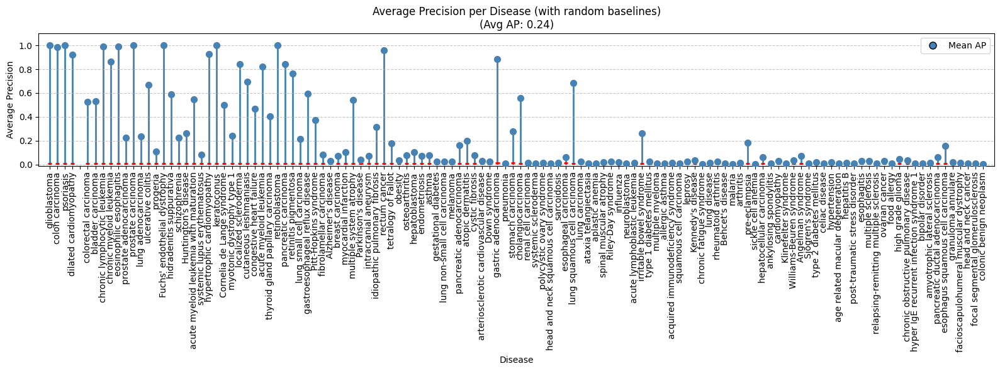

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# plot values
plot_data = _df_test.groupby("doid_id")["ap"].mean().to_dict()
x_vals = [plot_data.get(d, np.nan) for d in doids_sorted]

# random values
random_vals = _df_test.groupby("doid_id")["random"].mean().to_dict()
random_x_vals = [random_vals.get(d, np.nan) for d in doids_sorted]

# numeric positions for categories
xpos = np.arange(len(doids_sorted))

plt.figure(figsize=(16, 6))
plt.scatter(xpos, x_vals, color="steelblue", s=50, zorder=3)  # dots

# small horizontal red lines centered at each x
half_len = 0.25  # half-length of the red segment
for i, y in enumerate(random_x_vals):
    if np.isfinite(y):
        plt.hlines(y, i - half_len, i + half_len, color="red", linewidth=2, zorder=2)

# stems first (so dots appear on top)
plt.vlines(np.arange(len(doids_sorted)), 0.0, x_vals, color="steelblue", alpha=1, linewidth=2, zorder=1)

# cosmetics
plt.xticks(xpos, [doid_to_term.get(d) for d in doids_sorted], rotation=90)
plt.margins(x=0.01, y=0.1)
plt.ylim(-0.01, 1.1)
plt.grid(axis='y', linestyle='--', alpha=0.7, zorder=2)

# labels / title (note: you're plotting average_precision, not AUROC)
plt.xlabel("Disease")
plt.ylabel("Average Precision")
plt.title(f"Average Precision per Disease (with random baselines)\n(Avg AP: {np.nanmean(x_vals):.2f})")

# legend entries for point and red segments
legend_elems = [
    Line2D([0], [0], marker='o', color='none', markerfacecolor='steelblue', markersize=8, label='Mean AP'),
]
plt.legend(handles=legend_elems, loc='best')

plt.tight_layout()
plt.show()

In [ ]:
_df_test

,doid_id,disease,ap,random,auroc,rel_ap,rel_random,rel_auroc
0,DOID:768,retinoblastoma,1.000000,0.000431,1.000000,0.245139,0.019707,0.871578
1,DOID:11722,myotonic dystrophy type 1,0.276298,0.004172,0.988020,0.570370,0.006766,0.990701
2,DOID:5517,stomach carcinoma,0.051426,0.007588,0.628991,0.591093,0.420452,0.509509
3,DOID:8552,chronic myeloid leukemia,0.821914,0.006742,0.995178,0.734123,0.009050,0.970376
4,DOID:235,colonic benign neoplasm,0.000245,0.000323,0.148140,0.608410,0.214582,0.795122
...,...,...,...,...,...,...,...,...
118,DOID:0080199,colorectal carcinoma,0.910524,0.043460,0.979790,0.698804,0.383151,0.759904
119,DOID:1932,Angelman syndrome,0.004841,0.000169,0.974452,0.004841,0.000085,0.974452
120,DOID:8534,gastroesophageal reflux disease,1.000000,0.000450,1.000000,0.154464,0.061237,0.703937
121,DOID:3910,lung adenocarcinoma,0.865308,0.064879,0.992418,0.871746,0.375624,0.902819


In [ ]:
df_test_per_dis = get_perf_per_dis(adata_test, adata_train, rel_map,c_matrix_test_vs_train, doid_to_term, use_control=False)
df_test_per_smp = get_perf_per_smp(adata_test, adata_train, rel_map,c_matrix_test_vs_train, doid_to_term, use_control=False)

Processing samples: 100%|██████████| 5248/5248 [00:41<00:00, 126.70it/s]


In [ ]:
df_test_per_dis

,average_precision,roc_auc,random,disease,doid,n_positives,n_unrelated
0,1.000000,1.000000,0.000431,retinoblastoma,DOID:768,25,57930
1,0.264083,0.987232,0.004172,myotonic dystrophy type 1,DOID:11722,784,187120
2,0.050434,0.681450,0.007588,stomach carcinoma,DOID:5517,260,34005
3,0.657882,0.994680,0.006742,chronic myeloid leukemia,DOID:8552,790,116380
4,0.000179,0.104938,0.000323,colonic benign neoplasm,DOID:235,18,55704
...,...,...,...,...,...,...,...
118,0.478347,0.622905,0.043460,colorectal carcinoma,DOID:0080199,1268,27908
119,0.003852,1.000000,0.000169,Angelman syndrome,DOID:1932,6,35463
120,0.491430,0.950000,0.000450,gastroesophageal reflux disease,DOID:8534,30,66570
121,0.816630,0.989629,0.064879,lung adenocarcinoma,DOID:3910,3832,55232


disease
Alzheimer's disease                  0.110237
Angelman syndrome                    0.005400
Behcet's disease                     0.001543
Cornelia de Lange syndrome           0.174418
Down syndrome                        0.083984
                                       ...   
tetralogy of Fallot                  0.176543
thyroid gland papillary carcinoma    0.280148
type 1 diabetes mellitus             0.018894
type 2 diabetes mellitus             0.019265
ulcerative colitis                   0.468021
Name: average_precision, Length: 123, dtype: float64

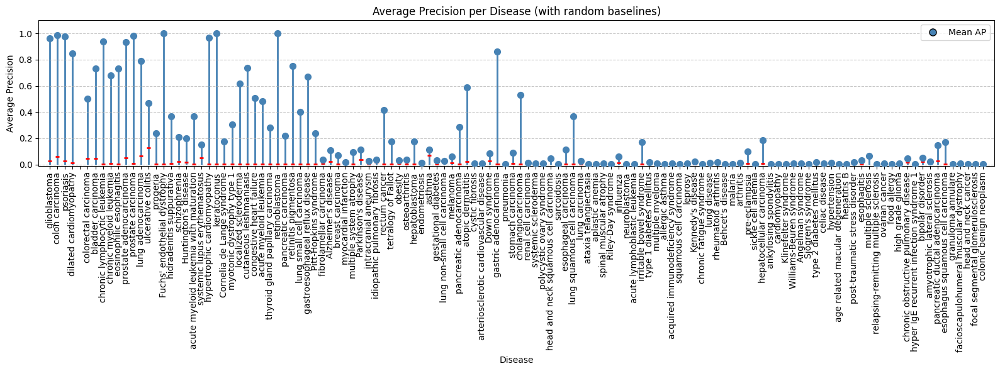

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# plot values
plot_data = df_test_per_dis.groupby("doid")["average_precision"].mean().to_dict()
plot_data = df_test_per_smp.groupby("doid")["average_precision"].mean().to_dict()
x_vals = [plot_data.get(d, np.nan) for d in doids_sorted]

# random values
random_vals = df_test_per_dis.groupby("doid")["random"].mean().to_dict()
random_x_vals = [random_vals.get(d, np.nan) for d in doids_sorted]

# numeric positions for categories
xpos = np.arange(len(doids_sorted))

plt.figure(figsize=(16, 6))
plt.scatter(xpos, x_vals, color="steelblue", s=50, zorder=3)  # dots

# small horizontal red lines centered at each x
half_len = 0.25  # half-length of the red segment
for i, y in enumerate(random_x_vals):
    if np.isfinite(y):
        plt.hlines(y, i - half_len, i + half_len, color="red", linewidth=2, zorder=2)

# stems first (so dots appear on top)
plt.vlines(np.arange(len(doids_sorted)), 0.0, x_vals, color="steelblue", alpha=1, linewidth=2, zorder=1)

# cosmetics
plt.xticks(xpos, [doid_to_term.get(d) for d in doids_sorted], rotation=90)
plt.margins(x=0.01, y=0.1)
plt.ylim(-0.01, 1.1)
plt.grid(axis='y', linestyle='--', alpha=0.7, zorder=2)

# labels / title (note: you're plotting average_precision, not AUROC)
plt.xlabel("Disease")
plt.ylabel("Average Precision")
plt.title("Average Precision per Disease (with random baselines)")

# legend entries for point and red segments
legend_elems = [
    Line2D([0], [0], marker='o', color='none', markerfacecolor='steelblue', markersize=8, label='Mean AP'),
]
plt.legend(handles=legend_elems, loc='best')

plt.tight_layout()
plt.show()

In [ ]:
adata_valid.obs

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,disease_study,library,doid_study,doid_id,do_id,doid_disease,celltype_id,sample_id,test_split_1
0,DSA03144.GSM4114356.Control,GSE138614,GSE138614,506,148,DSA03144,Brain,19402,Control,Control,Multiple Sclerosis,RNA-Seq,D,Control,Control,Control,0,GSM4114356,0
1,DSA01561.GSM3308428.Control,GSE117769,GSE117769,2057,567,DSA01561,Blood,19402,Control,Control,Rheumatoid Arthritis,RNA-Seq,D,Control,Control,Control,0,GSM3308428,0
2,DSA03923.GSM4735789.Control,GSE156651,GSE156651,187,57,DSA03923,Whole blood,19402,Control,Control,Eosinophilic Esophagitis,RNA-Seq,D,Control,Control,Control,0,GSM4735789,0
3,DSA09833.GSM4848882.Case,GSE159859,GSE159859,2116,585,DSA09833,nan,19402,Pitt-Hopkins Syndrome,DOID:0060488,Pitt-Hopkins Syndrome,RNA-Seq,D,DOID:0060488,DOID:0060488,Pitt-Hopkins syndrome,220,GSM4848882,0
4,DSA06620.GSM2042128.Control,GSE76987,GSE76987,743,207,DSA06620,Colon,19402,Control,Control,Colon Cancer,RNA-Seq,D,Control,Control,Control,0,GSM2042128,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2029,DSA07497.GSM2373855.Case,GSE88805,GSE88805,1930,533,DSA07497,Stomach,19402,Gastric Adenocarcinoma,DOID:3717,Gastric Adenocarcinoma,RNA-Seq,D,DOID:3717,DOID:3717,gastric adenocarcinoma,78,GSM2373855,0
2030,DSA05072.GSM5978113.Case,GSE193677,GSE193677,1154,313,DSA05072,Bowel,19402,Ulcerative Colitis,DOID:8577,Ulcerative Colitis,RNA-Seq,D,DOID:8577,DOID:8577,ulcerative colitis,123,GSM5978113,0
2031,DSA05049.GSM5788632.Case,GSE193309,GSE193309,1802,495,DSA05049,Skin,19402,Atopic Dermatitis,DOID:3310,Atopic Dermatitis,RNA-Seq,D,DOID:3310,DOID:3310,atopic dermatitis,70,GSM5788632,0
2032,DSA05473.GSM6529135.Control,GSE212384,GSE212384,804,219,DSA05473,Blood,19402,Control,Control,Lung Disease,RNA-Seq,D,Control,Control,Control,0,GSM6529135,0


In [ ]:
df_valid_per_dis

,average_precision,roc_auc,random,disease,doid,n_positives,n_unrelated
0,0.725397,1.0,0.000423,Pitt-Hopkins syndrome,DOID:0060488,5,11818


In [ ]:
df_valid_per_dis

,average_precision,roc_auc,random,disease,doid,n_positives,n_unrelated
0,0.725397,1.0,0.000423,Pitt-Hopkins syndrome,DOID:0060488,5,11818


In [ ]:
df_valid_per_dis_2

,average_precision,roc_auc,random,disease,doid,n_positives,n_unrelated
0,0.725397,1.0,0.000423,Pitt-Hopkins syndrome,DOID:0060488,5,11818


In [ ]:
df_valid_per_dis, u = get_perf_per_dis(adata_test[mask_test], adata_train[mask_train], rel_map,c_matrix_test_vs_train[mask_test][:, mask_train], doid_to_term)

  0%|          | 0/123 [00:00<?, ?it/s]


In [ ]:
df_valid_per_dis_, u = get_perf_per_dis(adata_test, adata_train, rel_map,c_matrix_test_vs_train, doid_to_term)

  1%|          | 1/124 [00:00<00:06, 18.95it/s]


In [ ]:
set(u2) - set(u)

set()

In [ ]:
len(u2)

796

In [ ]:
df_valid_per_dis

,average_precision,roc_auc,random,disease,doid,n_positives,n_unrelated
0,0.725397,1.0,0.000423,Pitt-Hopkins syndrome,DOID:0060488,5,11818


In [ ]:
df_valid_per_dis_2


,average_precision,roc_auc,random,disease,doid,n_positives,n_unrelated
0,0.555043,1.0,0.000273,Pitt-Hopkins syndrome,DOID:0060488,5,18293


In [ ]:
df_valid_per_dis

,average_precision,roc_auc,random,disease,doid,n_positives,n_unrelated
0,0.306404,1.000000,0.000273,Pitt-Hopkins syndrome,DOID:0060488,5,18305
1,0.480437,0.983714,0.025500,lung adenocarcinoma,DOID:3910,25387,970165
2,0.349354,0.965186,0.017023,colorectal carcinoma,DOID:0080199,11095,640675
3,0.066591,0.856840,0.002452,breast carcinoma,DOID:3459,225,91525
4,0.165172,0.954099,0.012729,post-traumatic stress disorder,DOID:2055,6136,475930
...,...,...,...,...,...,...,...
101,0.319797,1.000000,0.000491,chronic fatigue syndrome,DOID:8544,9,18305
102,0.156793,1.000000,0.000273,esophagitis,DOID:11963,5,18305
103,0.412865,1.000000,0.000491,keratoconus,DOID:10126,9,18305
104,0.500000,1.000000,0.000273,gastric adenocarcinoma,DOID:3717,5,18305


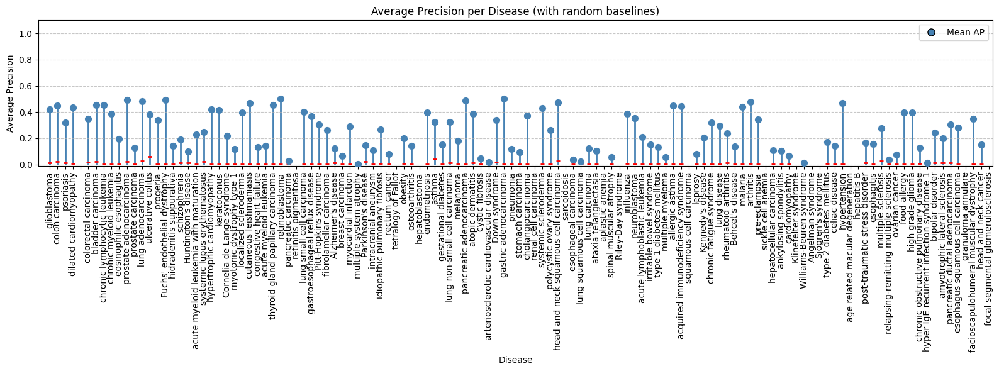

In [ ]:
df_test_per_dis

,average_precision,roc_auc,random,disease,doid,n_positives,n_unrelated
0,0.498034,1.000000,0.000273,retinoblastoma,DOID:768,25,91525
1,0.082461,0.981721,0.002670,myotonic dystrophy type 1,DOID:11722,784,292880
2,0.003814,0.610902,0.002833,stomach carcinoma,DOID:5517,260,91525
3,0.200020,0.987029,0.004297,chronic myeloid leukemia,DOID:8552,790,183050
4,0.000091,0.064815,0.000164,colonic benign neoplasm,DOID:235,18,109830
...,...,...,...,...,...,...,...
118,0.173035,0.585865,0.017023,colorectal carcinoma,DOID:0080199,1268,73220
119,0.002127,1.000000,0.000109,Angelman syndrome,DOID:1932,6,54915
120,0.043874,0.971111,0.000273,gastroesophageal reflux disease,DOID:8534,30,109830
121,0.145190,0.922893,0.025500,lung adenocarcinoma,DOID:3910,3832,146440


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# plot values
plot_data = df_test_per_dis.groupby("disease")["roc_auc"].mean().to_dict()
x_vals = [plot_data.get(d, np.nan) for d in dis_order]

# random values
random_vals = df_test_per_dis.groupby("disease")["random"].mean().to_dict()
random_x_vals = [random_vals.get(d, np.nan) for d in dis_order]

# numeric positions for categories
xpos = np.arange(len(dis_order))

plt.figure(figsize=(16, 6))
plt.scatter(xpos, x_vals, color="steelblue", s=50, zorder=3)  # dots

# small horizontal red lines centered at each x
plt.axhline(y=0.5, color='gray', linestyle='--', linewidth=1, zorder=-1)

# stems first (so dots appear on top)
plt.vlines(np.arange(len(dis_order)), 0.0, x_vals, color="steelblue", alpha=1, linewidth=2, zorder=2)

# cosmetics
plt.xticks(xpos, dis_order, rotation=90)
plt.margins(x=0.01, y=0.1)
plt.ylim(-0.01, 1.1)
plt.grid(linestyle='--', alpha=0.7, zorder=-3)

# labels / title (note: you're plotting average_precision, not AUROC)
plt.xlabel("Disease")
plt.ylabel("ROC AUC")
plt.title("ROC AUC per Disease")

# legend entries for point and red segments
plt.legend(loc='best')

plt.tight_layout()
plt.show()


In [ ]:
df_counts

,query_idx,query_doid,n_same,n_rel,n_unrel,n_total,pct_same,pct_rel,pct_unrel,hits_same
0,0,DOID:768,0,4,1,5,0.0,80.0,20.0,0
1,1,DOID:768,1,4,0,5,20.0,80.0,0.0,1
2,2,DOID:768,1,3,0,4,25.0,75.0,0.0,1
3,3,DOID:768,1,4,0,5,20.0,80.0,0.0,1
4,4,DOID:768,1,4,0,5,20.0,80.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...
3606,3606,DOID:3910,0,4,1,5,0.0,80.0,20.0,0
3607,3607,DOID:635,0,0,2,2,0.0,0.0,100.0,0
3608,3608,DOID:635,0,0,3,3,0.0,0.0,100.0,0
3609,3609,DOID:635,0,0,3,3,0.0,0.0,100.0,0


<Axes: ylabel='Density'>

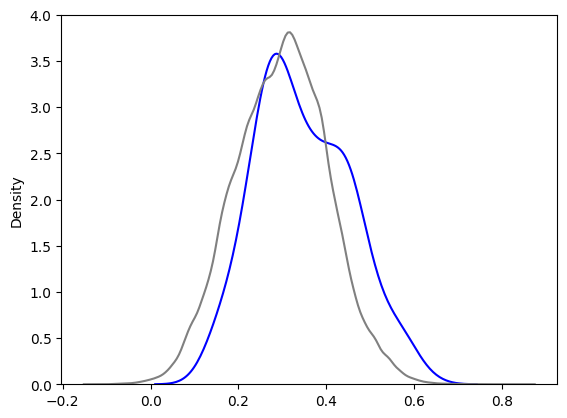

In [ ]:
sns.kdeplot(s1, label="same disease", color="blue")
sns.kdeplot(s2, label="unrelated disease", color="gray")

(0.0, 100.0)

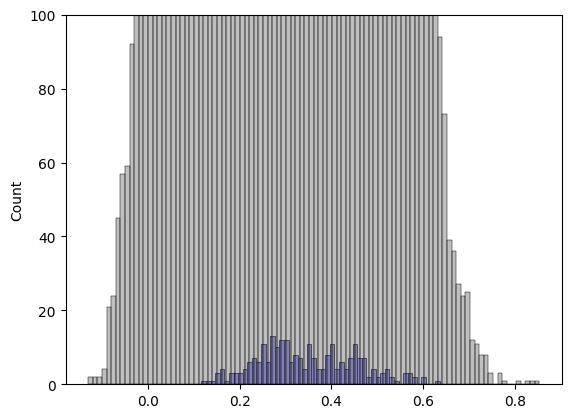

In [ ]:
sns.histplot(s1, label="same disease", color="blue", binwidth=0.01, alpha=0.5)
sns.histplot(s2, label="unrelated disease", color="gray", binwidth=0.01, alpha=0.5)
plt.ylim(0, 100)

In [ ]:
df_test_per_dis = get_perf_per_dis(adata_test, adata_train, df_related, df_unrelated, c_matrix_test_vs_train, doid_to_term)
df_valid_per_dis = get_perf_per_dis(adata_valid, adata_train, df_related, df_unrelated, c_matrix_valid_vs_train, doid_to_term)


NameError: name 'df_related' is not defined

In [ ]:
def _get_top_k(y_true:np.ndarray, y_score:np.ndarray)->int:
    # sort by score
    order = np.argsort(y_score, kind="mergesort")
    order = order[::-1] # descending

    # get rank of first true positive
    rank_pos = np.argwhere(y_true[order] == 1).flatten()

    # get top k
    top_k = min(rank_pos) + 1  # +1 to convert from 0-based to 1-based rank
    return top_k

In [ ]:
df_test_per_smp = get_perf_per_smp(adata_test, adata_train, df_related, df_unrelated, c_matrix_test_vs_train, doid_to_term)
df_valid_per_smp = get_perf_per_smp(adata_valid, adata_train, df_related, df_unrelated, c_matrix_valid_vs_train, doid_to_term)


100%|██████████| 188/188 [00:43<00:00,  4.30it/s]


In [ ]:
_df_test_colaps = df_test_per_smp.groupby("doid")[["top_k", "n_related_top100", "n_unrelated_top100", "n_same_top100"]].mean().reset_index()
_df_valid_colaps = df_valid_per_smp.groupby("doid")[["top_k", "n_related_top100", "n_unrelated_top100", "n_same_top100"]].mean().reset_index()
df_test_merge = df_test_per_dis.merge(_df_test_colaps, on="doid", suffixes=("_dis", "_smp"))
df_valid_merge = df_valid_per_dis.merge(_df_valid_colaps, on="doid", suffixes=("_dis", "_smp"))

In [ ]:
# cap average precision 


df_test_merge["average_precision"] = df_test_merge["average_precision"].apply(lambda x: 0 if x <0.05 else x)

# sort diseases
dis_order = df_test_merge.sort_values(
    by=["average_precision", "n_related_top100", "n_same_top100"],
    ascending=[False, False, False],
    na_position="last",   # put NaNs at the end
    kind="mergesort"      # stable: keeps original order within ties
)["disease"].unique().tolist()


In [ ]:
df_test_merge

,average_precision,roc_auc,random,disease,doid,n_positives,n_unrelated,top_k,n_related_top100,n_unrelated_top100,n_same_top100
0,0.000000,0.544931,0.002018,polycystic ovary syndrome,DOID:11612,720,355995,2748.333333,18.888889,81.111111,0.000000
1,0.230470,0.903266,0.013403,Parkinson's disease,DOID:14330,13375,984550,184.120000,38.960000,53.080000,7.960000
2,0.000000,0.489615,0.006731,B-lymphoblastic leukemia/lymphoma,DOID:0080630,14210,2097060,2643.685714,73.871429,26.128571,0.000000
3,0.000000,0.593616,0.000335,prediabetes syndrome,DOID:11716,252,752202,1961.222222,0.000000,100.000000,0.000000
4,0.155216,0.958574,0.004623,celiac disease,DOID:10608,604,130052,3.500000,78.750000,1.750000,19.500000
...,...,...,...,...,...,...,...,...,...,...,...
201,0.826626,0.999203,0.001103,malignant astrocytoma,DOID:3069,496,448992,7.375000,76.375000,9.187500,14.437500
202,0.154334,0.935803,0.001546,facioscapulohumeral muscular dystrophy,DOID:11727,2508,1619598,5.868421,20.315789,55.105263,24.578947
203,0.973224,0.998620,0.004830,thyroid gland papillary carcinoma,DOID:3969,8007,1649646,3.215686,33.529412,0.000000,66.470588
204,0.000000,0.894444,0.000461,thyroid gland medullary carcinoma,DOID:3973,30,65048,357.000000,99.500000,0.500000,0.000000


In [ ]:
df_test_merge["average_precision"] = df_test_merge["average_precision"].apply(lambda x: 0 if x <0.05 else x)


dis_order = df_test_merge.sort_values(
    by=["average_precision", "n_unrelated_top100"],
    ascending=[False, True],
    na_position="last",   # put NaNs at the end
    kind="mergesort"      # stable: keeps original order within ties
)

dis_order = dis_order["disease"].to_list()

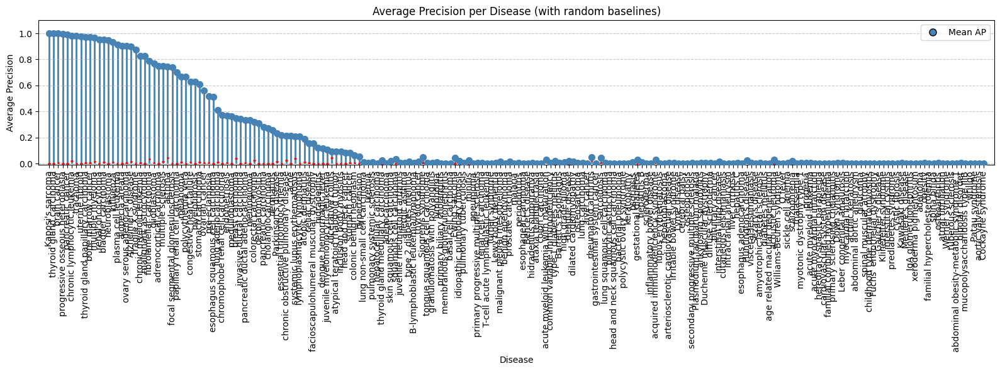

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# plot values
plot_data = df_test_per_dis.groupby("disease")["average_precision"].mean().to_dict()
x_vals = [plot_data.get(d, np.nan) for d in dis_order]

# random values
random_vals = df_test_per_dis.groupby("disease")["random"].mean().to_dict()
random_x_vals = [random_vals.get(d, np.nan) for d in dis_order]

# numeric positions for categories
xpos = np.arange(len(dis_order))

plt.figure(figsize=(16, 6))
plt.scatter(xpos, x_vals, color="steelblue", s=50, zorder=3)  # dots

# small horizontal red lines centered at each x
half_len = 0.25  # half-length of the red segment
for i, y in enumerate(random_x_vals):
    if np.isfinite(y):
        plt.hlines(y, i - half_len, i + half_len, color="red", linewidth=2, zorder=2)

# stems first (so dots appear on top)
plt.vlines(np.arange(len(dis_order)), 0.0, x_vals, color="steelblue", alpha=1, linewidth=2, zorder=1)

# cosmetics
plt.xticks(xpos, dis_order, rotation=90)
plt.margins(x=0.01, y=0.1)
plt.ylim(-0.01, 1.1)
plt.grid(axis='y', linestyle='--', alpha=0.7, zorder=2)

# labels / title (note: you're plotting average_precision, not AUROC)
plt.xlabel("Disease")
plt.ylabel("Average Precision")
plt.title("Average Precision per Disease (with random baselines)")

# legend entries for point and red segments
legend_elems = [
    Line2D([0], [0], marker='o', color='none', markerfacecolor='steelblue', markersize=8, label='Mean AP'),
]
plt.legend(handles=legend_elems, loc='best')

plt.tight_layout()
plt.show()


In [ ]:

# Example data
# _dis_sorted = list(df_test_per_smp.groupby("disease")["n_same_top100"].mean().sort_values(ascending=False).index.to_list())[::-1]
# _dis_sorted = plot_data.index.to_list()[::-1]

df_test_per_smp["disease"] = pd.Categorical(df_test_per_smp["disease"], categories=dis_order, ordered=True)
df_test_per_smp.sort_values("disease", inplace=True)

_same_counts = df_test_per_smp.groupby("disease")["n_same_top100"].mean().to_dict()
_related_counts = df_test_per_smp.groupby("disease")["n_related_top100"].mean().to_dict()
_unrelated_counts = df_test_per_smp.groupby("disease")["n_unrelated_top100"].mean().to_dict()


# get ordered counts
_same_counts = [_same_counts[d] for d in dis_order]
_related_counts = [_related_counts[d] for d in dis_order]
_unrelated_counts = [_unrelated_counts[d] for d in dis_order]


x = np.arange(len(dis_order))

fig, ax = plt.subplots(figsize=(15, 6))

# Stacked vertical bars
bars_same = ax.bar(x, _same_counts, color="darkblue", label="Same disease", edgecolor="black")
bars_related = ax.bar(x, _related_counts, bottom=_same_counts,
                      color="skyblue", label="Related disease", edgecolor="black")
bars_unrelated = ax.bar(
    x, _unrelated_counts,
    bottom=np.array(_same_counts) + np.array(_related_counts),
    color="white", edgecolor="black", hatch="//", label="Unrelated disease"
)

# Labels and formatting
ax.set_xticks(x)
ax.set_xticklabels(dis_order, rotation=90)
ax.set_ylabel("Counts")
ax.set_title("Disease composition by category (Vertical)")
ax.legend()

plt.margins(x=0.0, y=0.0)
plt.ylim(-0, 100)  # adjust if your totals differ
plt.tight_layout()
plt.show()


NameError: name 'df_test_per_smp' is not defined

In [ ]:
def get_same_dis(adata_qry:pd.DataFrame, adata_ref:pd.DataFrame, s_matrix:np.array,df_related:pd.DataFrame, df_unrelated:pd.DataFrame,do_diff_dt:bool=True)->Tuple[Tuple[np.array, np.array],Tuple[np.array, np.array]]:
    """Get same disease similarity"""
    
    datasets_1 = adata_qry.obs["dataset"].values
    datasets_2 = adata_ref.obs["dataset"].values

    # Store results
    results_per_dis = list()

    # Process same disease pairs
    for do_id in tqdm(adata_qry.obs["doid_id"].unique(), desc="Processing same disease pairs"): # loop through all unique diseases
        if do_id.startswith("Control"): # skip controls
            continue

        # get related & unrelated diseases
        related_i = set(df_related.query(f"do1 == '{do_id}'")["do2"].values)
        related_i = related_i.union(set(df_related.query(f"do2 == '{do_id}'")["do1"].values))
        related_i = list(related_i)

        unrelated_i = set(df_unrelated.query(f"do1 == '{do_id}'")["do2"].values)
        unrelated_i = unrelated_i.union(set(df_unrelated.query(f"do2 == '{do_id}'")["do1"].values))
        unrelated_i = list(unrelated_i)

        idx_1 = np.array(adata_qry.obs.query(f"(doid_id == '{do_id}')").index).astype(int)    # query disease
        idx_2 = np.array(adata_ref.obs.query(f"(doid_id == '{do_id}')").index).astype(int)    # reference disease
        dsaids = adata_ref.obs.query(f"(doid_id in @unrelated_i)")["dsaid"].unique()
        idx_3 = np.array(adata_ref.obs.query(f"(dsaid in @dsaids)").index).astype(int)  # reference unrelated diseases

        unrelated_pairs = np.array(list(itertools.product(idx_1, idx_3)))
        s_unrelated_i = s_matrix[unrelated_pairs[:, 0], unrelated_pairs[:, 1]]        

        same_pairs = list(itertools.product(idx_1, idx_2))

        if do_diff_dt:
            # print(f"Filtering same disease pairs by different datasets {len(same_pairs)}")
            # filter by datasets
            same_pairs = np.array([p for p in same_pairs if datasets_1[p[0]] != datasets_2[p[1]]])
            # print(f"Filtered same disease pairs to {len(same_pairs)} based on different datasets")

        if len(same_pairs) == 0 or len(unrelated_pairs) == 0:
            print(f"Skipping {do_id} - {doid_to_term.get(do_id)} due to lack of pairs")
            print(f"Nº same: {len(same_pairs)}\tNº unrelated: {len(unrelated_pairs)}")
            continue
        s_same_i = s_matrix[same_pairs[:, 0], same_pairs[:, 1]]

        # compute metrics
        ap_i = average_precision_score(
            [1] * len(s_same_i) + [0] * (len(s_unrelated_i)),
            np.concatenate([s_same_i, s_unrelated_i])
        )

        auroc_i = roc_auc_score(
            [1] * len(s_same_i) + [0] * (len(s_unrelated_i)),
            np.concatenate([s_same_i, s_unrelated_i])
        )

        random_i = len(s_same_i) / (len(s_same_i) + len(s_unrelated_i)) if (len(s_same_i) + len(s_unrelated_i)) > 0 else 0
        
        from sklearn.metrics import recall_score, precision_score
        precision_i = precision_score(
            [1] * len(s_same_i) + [0] * (len(s_unrelated_i)),
            (np.concatenate([s_same_i, s_unrelated_i]) > 0.5).astype(int)
        )

        recall_i = recall_score(
            [1] * len(s_same_i) + [0] * (len(s_unrelated_i)),
            (np.concatenate([s_same_i, s_unrelated_i]) > 0.5).astype(int)
        )

        from sklearn.metrics import accuracy_score
        accuracy_i = accuracy_score(
            [1] * len(s_same_i) + [0] * (len(s_unrelated_i)),
            (np.concatenate([s_same_i, s_unrelated_i]) > 0.5).astype(int)
        )

        from sklearn.metrics import top_k_accuracy_score
        top_5_acc = top_k_accuracy_score(
            [1] * len(s_same_i) + [0] * (len(s_unrelated_i)),
            np.concatenate([s_same_i, s_unrelated_i]),
            k=5
        )

        top_10_acc = top_k_accuracy_score(
            [1] * len(s_same_i) + [0] * (len(s_unrelated_i)),
            np.concatenate([s_same_i, s_unrelated_i]),
            k=10
        )

        top_20_acc = top_k_accuracy_score(
            [1] * len(s_same_i) + [0] * (len(s_unrelated_i)),
            np.concatenate([s_same_i, s_unrelated_i]),
            k=20
        )

        top_50_acc = top_k_accuracy_score(
            [1] * len(s_same_i) + [0] * (len(s_unrelated_i)),
            np.concatenate([s_same_i, s_unrelated_i]),
            k=50
        )

        top_100_acc = top_k_accuracy_score(
            [1] * len(s_same_i) + [0] * (len(s_unrelated_i)),
            np.concatenate([s_same_i, s_unrelated_i]),
            k=100
        )

        results_per_dis.append({
            "average_precision": ap_i,
            "random": random_i,
            "roc_auc": auroc_i,
            "precision": precision_i,
            "recall": recall_i,
            "accuracy": accuracy_i,
            "top_5_acc": top_5_acc,
            "top_10_acc": top_10_acc,
            "top_20_acc": top_20_acc,
            "top_50_acc": top_50_acc,
            "top_100_acc": top_100_acc,
            "disease": doid_to_term.get(do_id),
            "doid": do_id,
            "n_positives": len(s_same_i),
            "n_unrelated": len(s_unrelated_i),
        })


    return results_per_dis


get_same_dis(adata_test, adata_train, c_matrix_test_vs_train, df_related, df_unrelated)

Processing same disease pairs:   0%|          | 0/207 [00:00<?, ?it/s]/home/ddalton/Data/old_home/miniconda3/envs/scgpt_2/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:2025: UndefinedMetricWarning: 'k' (5) greater than or equal to 'n_classes' (2) will result in a perfect score and is therefore meaningless.
  warnings.warn(
/home/ddalton/Data/old_home/miniconda3/envs/scgpt_2/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:2025: UndefinedMetricWarning: 'k' (10) greater than or equal to 'n_classes' (2) will result in a perfect score and is therefore meaningless.
  warnings.warn(
/home/ddalton/Data/old_home/miniconda3/envs/scgpt_2/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:2025: UndefinedMetricWarning: 'k' (20) greater than or equal to 'n_classes' (2) will result in a perfect score and is therefore meaningless.
  warnings.warn(
/home/ddalton/Data/old_home/miniconda3/envs/scgpt_2/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:2025: UndefinedMetric

[{'average_precision': 0.0019318864007515024,
  'random': 0.0020184180648416803,
  'roc_auc': 0.5316721754831139,
  'precision': 0.00013618102998252344,
  'recall': 0.008333333333333333,
  'accuracy': 0.8745020534600452,
  'top_5_acc': 1.0,
  'top_10_acc': 1.0,
  'top_20_acc': 1.0,
  'top_50_acc': 1.0,
  'top_100_acc': 1.0,
  'disease': 'polycystic ovary syndrome',
  'doid': 'DOID:11612',
  'n_positives': 720,
  'n_unrelated': 355995},
 {'average_precision': 0.2304697157032491,
  'random': 0.01340281083247739,
  'roc_auc': 0.9055179851319711,
  'precision': 0.09600827104303082,
  'recall': 0.60403738317757,
  'accuracy': 0.9184648144900669,
  'top_5_acc': 1.0,
  'top_10_acc': 1.0,
  'top_20_acc': 1.0,
  'top_50_acc': 1.0,
  'top_100_acc': 1.0,
  'disease': "Parkinson's disease",
  'doid': 'DOID:14330',
  'n_positives': 13375,
  'n_unrelated': 984550},
 {'average_precision': 0.0058542496618712025,
  'random': 0.006730546069427406,
  'roc_auc': 0.48566254386112745,
  'precision': 0.00050

In [ ]:
df_related.query("lin > 0.8")

,do1,do2,pair_sorted,resnik,lin,jiang,mica_node,shortest_path_length
1824596,DOID:0050156,DOID:3082,"(DOID:0050156, DOID:3082)",7.951700,0.831669,3.218876,DOID:3082,2
2957243,DOID:0050458,DOID:4960,"(DOID:0050458, DOID:4960)",8.567886,0.874481,2.459589,DOID:4960,3
2959174,DOID:0050458,DOID:9538,"(DOID:0050458, DOID:9538)",8.780980,0.838026,3.394379,DOID:0070004,3
6036940,DOID:0050783,DOID:0050784,"(DOID:0050783, DOID:0050784)",9.848820,0.893117,2.357310,DOID:2377,2
6044785,DOID:0050783,DOID:2377,"(DOID:0050783, DOID:2377)",9.848820,0.943541,1.178655,DOID:2377,1
...,...,...,...,...,...,...,...,...
70357788,DOID:8893,DOID:986,"(DOID:8893, DOID:986)",8.206592,0.824167,3.501699,DOID:0060039,2
70369174,DOID:8997,DOID:9538,"(DOID:8997, DOID:9538)",8.780980,0.838026,3.394379,DOID:0070004,3
70380749,DOID:9111,DOID:9146,"(DOID:9111, DOID:9146)",9.561138,0.866797,2.938574,DOID:9065,2
70408845,DOID:9351,DOID:9352,"(DOID:9351, DOID:9352)",7.571553,0.830610,3.088198,DOID:9351,1


In [ ]:

def get_perf_per_smp(adata_qry:Anndata, adata_ref:Anndata, df_related:pd.DataFrame, df_unrelated:pd.DataFrame, c_matrix:np.ndarray, doid_to_term:dict, do_diff_dt:bool=True)->pd.DataFrame:

    def _get_matrix_sim(idx_pairs, c_matrix):
        if len(idx_pairs) == 0:
            return np.array([])
        return c_matrix[idx_pairs[:, 0], idx_pairs[:, 1]]



    def _get_top_k(y_true:np.ndarray, y_score:np.ndarray)->int:
        y_true = np.array(y_true)
        y_score = np.array(y_score)

        # sort by score
        order = np.argsort(y_score, kind="mergesort")
        order = order[::-1] # descending
        y_true_ordered = y_true[order]

        # get rank of first true positive
        rank_pos = np.argwhere(y_true_ordered == 1).flatten()

        if len(rank_pos) == 0:
            return [] # No true positives found

        # get top k
        rank_pos = rank_pos + 1  # +1 to convert from 0-based to 1-based rank
        return rank_pos
    
    def _get_top_k_unique(y_label:np.ndarray, y_score:np.ndarray, k=5)->int:
        y_label = np.array(y_label)
        y_score = np.array(y_score)

        # sort by score
        order = np.argsort(y_score, kind="mergesort")
        order = order[::-1] # descending

        diseases_sorted = y_label[order]

        # Deduplicate while preserving order
        seen = set()
        unique_diseases = []
        for d in diseases_sorted:
            if d not in seen:
                seen.add(d)
                unique_diseases.append(d)
            if len(unique_diseases) == k:
                break

        return unique_diseases
    

    def _get_top_k_dis(y_label:np.ndarray, y_score:np.ndarray, k=5)->int:
        y_label = np.array(y_label)
        y_score = np.array(y_score)

        # sort by score
        order = np.argsort(y_score, kind="mergesort")
        order = order[::-1] # descending

        diseases_sorted = y_label[order]

        return diseases_sorted[:k]


    results_per_smp = list()
    datasets_1 = adata_qry.obs["dataset"].values
    datasets_2 = adata_ref.obs["dataset"].values

    for doid_i in tqdm(adata_qry.obs["doid_id"].unique()):  # loop through all unique diseases
        if doid_i == "Control": # skip controls
            continue

        # get related & unrelated diseases
        related_i = set(df_related.query(f"do1 == '{doid_i}'")["do2"].values)
        related_i = related_i.union(set(df_related.query(f"do2 == '{doid_i}'")["do1"].values))
        related_i = list(related_i)

        unrelated_i = set(df_unrelated.query(f"do1 == '{doid_i}'")["do2"].values)
        unrelated_i = unrelated_i.union(set(df_unrelated.query(f"do2 == '{doid_i}'")["do1"].values))
        unrelated_i = list(unrelated_i)

        # get idxs
        idx_1 = np.array(adata_qry.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)    # query disease
        idx_2 = np.array(adata_ref.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)    # reference disease
        idx_3 = np.array(adata_ref.obs.query(f"(doid_id in @related_i)").index).astype(int)  # reference unrelated diseases
        idx_4 = np.array(adata_ref.obs.query(f"(doid_id in @unrelated_i)").index).astype(int)  # reference unrelated diseases
        dsaids = adata_ref.obs.query(f"(doid_id in @unrelated_i)")["dsaid"].unique()
        idx_5 = np.array(adata_ref.obs.query(f"(dsaid in @dsaids)").index).astype(int)  # reference unrelated diseases & controls

        if len(idx_1) == 0:
            print(f"Skipping {doid_i} - {doid_to_term.get(doid_i)} due to lack of pairs")
            print(f"Nº same: {len(idx_1)}\tNº related: {len(idx_2)}\tNº unrelated: {len(idx_3)}")
            continue

        for idx_j in idx_1: # loop through samples 
            idx_pairs_1 = list(itertools.product([idx_j], idx_2))   # same disease pairs 
            idx_pairs_2 = np.array(list(itertools.product([idx_j], idx_3))) # related disease pairs
            idx_pairs_3 = np.array(list(itertools.product([idx_j], idx_4))) # unrelated disease pairs

            if do_diff_dt:  # remove pairs from same dataset
                idx_pairs_1 = np.array([p for p in idx_pairs_1 if datasets_1[p[0]] != datasets_2[p[1]]])
                idx_pairs_2 = np.array([p for p in idx_pairs_2 if datasets_1[p[0]] != datasets_2[p[1]]])
                # idx_pairs_3 = np.array([p for p in idx_pairs_3 if datasets_1[p[0]] != datasets_2[p[1]]])  # usually not needed for unrelated pairs


            _s_same = _get_matrix_sim(idx_pairs_1, c_matrix)
            _s_related = _get_matrix_sim(idx_pairs_2, c_matrix)
            _s_unrelated = _get_matrix_sim(idx_pairs_3, c_matrix)

            # _top_k = return_top_k(_s_same, np.concatenate([_s_related, _s_unrelated]))
            # _composition = return_composition_top_k(_s_same, _s_related, _s_unrelated, k=100)


            top_k_dis_j = _get_top_k(
                [1] * len(_s_same) + [0] * (len(_s_related) + len(_s_unrelated)),
                np.concatenate([_s_same, _s_related, _s_unrelated])
            )

            top_k_rel_j = _get_top_k(
                [1] * len(_s_related) + [0] * (len(_s_same) + len(_s_unrelated)),
                np.concatenate([_s_related, _s_same, _s_unrelated])
            )

            doids_same_j = list(adata_ref.obs["doid_id"].values[idx_pairs_1[:, 1]])  if len(idx_pairs_1) > 0 else [] 
            doids_related_j = list(adata_ref.obs["doid_id"].values[idx_pairs_2[:, 1]]) if len(idx_pairs_2) > 0 else []
            doids_unrelated_j = list(adata_ref.obs["doid_id"].values[idx_pairs_3[:, 1]]) if len(idx_pairs_3) > 0 else []


            top_k_doids_j = _get_top_k_unique(
                doids_same_j + 
                doids_related_j + 
                doids_unrelated_j,
                np.concatenate([_s_same, _s_related, _s_unrelated]),
                k=5
            )

            # for top 10 closest perform hypergeometric test to see if same disease is enriched
            from scipy.stats import hypergeom
            # rv = hypergeom(N, K, n)
            _top_k_dis = _get_top_k_dis(
                            doids_same_j + 
                            doids_related_j + 
                            doids_unrelated_j,
                            np.concatenate([_s_same, _s_related, _s_unrelated]),
                            k=100
                        )
            all_dis = doids_same_j + doids_related_j + doids_unrelated_j
            pvals = list()
            for _dis in set(_top_k_dis):
                N = len(_s_same) + len(_s_related) + len(_s_unrelated)  # total number of items
                rv = hypergeom(N, all_dis.count(_dis), 100)  # hypergeometric distribution
                p_val = rv.sf(list(_top_k_dis).count(_dis)-1)  # survival function (1 - cdf) for k-1
                pvals.append((_dis, p_val))



            # results per sample
            results_per_smp.append({
                "doid": doid_i,
                "disease": doid_to_term.get(doid_i),
                "top_k_dis": min(top_k_dis_j) if len(top_k_dis_j)>0 else np.nan,
                "k_rank_dis":top_k_dis_j,
                "top_k_rel": min(top_k_rel_j) if len(top_k_rel_j)>0 else np.nan,
                "k_rank_rel":top_k_rel_j,
                "n_positives": len(_s_same),
                "n_related": len(_s_related),
                "n_total": len(_s_same) + len(_s_related) + len(_s_unrelated),
                "top_k_doids_j": top_k_doids_j,
                "top_k_dis_pvals": pvals,
            })

        df_per_smp = pd.DataFrame(results_per_smp)

    return  df_per_smp


df_test_per_smp_v2 = get_perf_per_smp(adata_test, adata_train, df_related, df_unrelated, c_matrix_test_vs_train, doid_to_term, do_diff_dt=True)

100%|██████████| 207/207 [03:18<00:00,  1.04it/s]


In [ ]:
df_test_per_smp_v2

,doid,disease,top_k_dis,k_rank_dis,top_k_rel,k_rank_rel,n_positives,n_related,n_total,top_k_doids_j,top_k_dis_pvals
0,DOID:11612,polycystic ovary syndrome,1214,"[1214, 1437, 2448, 2721, 2927, 3093, 3097, 355...",3.0,"[3, 45, 63, 79, 95, 106, 122, 132, 146, 162, 1...",80,2270,28507,"[DOID:9352, DOID:7148, DOID:4905, DOID:3083, D...","[(DOID:2801, 0.05468782639427513), (DOID:13378..."
1,DOID:11612,polycystic ovary syndrome,2282,"[2282, 2606, 2720, 2897, 3152, 3409, 3758, 402...",21.0,"[21, 228, 278, 372, 389, 440, 456, 490, 517, 5...",80,2270,28507,"[DOID:9352, DOID:3369, DOID:7147, DOID:10591, ...","[(DOID:2801, 0.05468782639427513), (DOID:13378..."
2,DOID:11612,polycystic ovary syndrome,3967,"[3967, 4140, 4610, 5370, 5667, 6290, 6397, 640...",70.0,"[70, 1223, 1393, 1411, 1450, 1451, 1468, 1582,...",80,2270,28507,"[DOID:9352, DOID:11727, DOID:0050156, DOID:113...","[(DOID:8398, 0.5232102111061137), (DOID:11727,..."
3,DOID:11612,polycystic ovary syndrome,2933,"[2933, 3880, 5408, 5890, 6626, 7480, 8227, 842...",1.0,"[1, 5, 7, 9, 14, 15, 16, 19, 22, 23, 24, 25, 2...",80,2270,28507,"[DOID:3498, DOID:4007, DOID:9206, DOID:5015, D...","[(DOID:4007, 0.013226116460296651), (DOID:4450..."
4,DOID:11612,polycystic ovary syndrome,4159,"[4159, 4878, 5785, 7108, 7344, 7587, 7817, 804...",28.0,"[28, 37, 40, 45, 54, 69, 86, 101, 108, 144, 15...",80,2270,28507,"[DOID:3459, DOID:9970, DOID:3083, DOID:2841, D...","[(DOID:9206, 0.0074902885352226434), (DOID:551..."
...,...,...,...,...,...,...,...,...,...,...,...
5678,DOID:3565,meningioma,37,"[37, 40, 76, 90, 91, 95, 100, 117, 149, 155, 1...",1.0,"[1, 2, 3, 4, 7, 8, 9, 10, 11, 12, 13, 15, 16, ...",20,9092,28507,"[DOID:3069, DOID:3068, DOID:3312, DOID:5419, D...","[(DOID:14250, 0.003358978329298143), (DOID:600..."
5679,DOID:3565,meningioma,593,"[593, 804, 813, 930, 998, 1085, 1130, 1131, 13...",1.0,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",20,9092,28507,"[DOID:1909, DOID:3070, DOID:0080199, DOID:3905...","[(DOID:1909, 5.527114575761006e-184), (DOID:39..."
5680,DOID:3565,meningioma,24,"[24, 29, 45, 389, 402, 475, 525, 775, 876, 878...",1.0,"[1, 2, 3, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, ...",20,9092,28507,"[DOID:10652, DOID:14330, DOID:14250, DOID:3312...","[(DOID:14250, 0.25854314938487455), (DOID:1221..."
5681,DOID:3565,meningioma,12,"[12, 18, 26, 30, 34, 38, 58, 64, 81, 87, 92, 1...",1.0,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15...",20,9092,28507,"[DOID:3068, DOID:3069, DOID:3565, DOID:10941, ...","[(DOID:3068, 1.2380155109604039e-116), (DOID:4..."


In [ ]:
df_test_per_smp_v2["n_unique_hits"] = [len(set(r["top_k_doids_j"])&set([r["doid"]])) for _, r in df_test_per_smp_v2.iterrows()]

In [ ]:
df_test_per_smp_v2["n_unique_hits"] 

0       0
1       0
2       0
3       0
4       0
       ..
5678    0
5679    0
5680    0
5681    1
5682    0
Name: n_unique_hits, Length: 5683, dtype: int64

In [ ]:
from scipy.stats import hypergeom
def hypergeom_expected(N, K, n):
    """
    N = population size
    K = number of positives in population
    n = draws (e.g., top-k)
    """
    rv = hypergeom(N, K, n)
    # exp = rv.mean()          # same as n * K / N

    # var = rv.var()           # variance (optional)
    exp = n * K / N
    return exp

def hypergeom_pval(N, K, n, k):
    """
    N = population size
    K = number of positives in population
    n = draws (e.g., top-k)
    k = observed positives in draws
    """
    rv = hypergeom(N, K, n)
    pval = rv.sf(k-1)  # P(X >= k) = 1 - P(X <= k-1)
    return pval


for k in [1, 5, 10, 20, 50, 100, 183]:
    df_test_per_smp_v2[f"top_{k}_dis"] = df_test_per_smp_v2["top_k_dis"].apply(lambda x: 1 if x <= k else 0)
    df_test_per_smp_v2[f"top_{k}_rel"] = df_test_per_smp_v2["top_k_rel"].apply(lambda x: 1 if x <= k else 0)

    df_test_per_smp_v2[f"n_{k}_dis"] = df_test_per_smp_v2["k_rank_dis"].apply(lambda x: (np.array(x)<=k).sum())
    df_test_per_smp_v2[f"n_{k}_rel"] = df_test_per_smp_v2["k_rank_rel"].apply(lambda x: (np.array(x)<=k).sum())

    # Random expectation
    df_test_per_smp_v2[f"top_{k}_dis_exp"] = df_test_per_smp_v2.apply(
        lambda row: hypergeom_expected(
            N=row["n_total"],
            K=row["n_positives"],
            n=k,
        ) if not np.isnan(row[f"top_{k}_dis"]) else np.nan,
        axis=1
    )
    df_test_per_smp_v2[f"top_{k}_rel_exp"] = df_test_per_smp_v2.apply(
        lambda row: hypergeom_expected(
            N=row["n_total"],
            K=row["n_related"],
            n=k,
        ) if not np.isnan(row[f"top_{k}_rel"]) else np.nan,
        axis=1
    )

    # Hypergeometric p-value
    df_test_per_smp_v2[f"top_{k}_dis_pval"] = df_test_per_smp_v2.apply(
        lambda row: hypergeom_pval(
            N=row["n_total"],
            K=row["n_positives"],
            n=k,    
            k=row[f"n_{k}_dis"],
        ) if not np.isnan(row[f"top_{k}_dis"]) else np.nan,
        axis=1
    )
    df_test_per_smp_v2[f"top_{k}_rel_pval"] = df_test_per_smp_v2.apply(
        lambda row: hypergeom_pval(
            N=row["n_total"],
            K=row["n_related"],
            n=k,    
            k=row[f"n_{k}_rel"],
        ) if not np.isnan(row[f"top_{k}_rel"]) else np.nan,
        axis=1
    )


d_2_k = df_test_per_smp_v2.groupby("disease")["top_50_dis"].sum().to_dict()
d_2_count = df_test_per_smp_v2.groupby("disease")["top_50_dis"].count().to_dict()
dis_val = {k: v / d_2_count[k] for k, v in d_2_k.items()}

rel_2_k = df_test_per_smp_v2.groupby("disease")["top_50_rel"].sum().to_dict()
rel_2_count = df_test_per_smp_v2.groupby("disease")["top_50_rel"].count().to_dict()
rel_val = {k: v / rel_2_count[k] for k, v in rel_2_k.items()}

In [ ]:
df_test_per_smp_v2

,doid,disease,top_k_dis,k_rank_dis,top_k_rel,k_rank_rel,n_positives,n_related,n_total,top_k_doids_j,...,top_100_dis_pval,top_100_rel_pval,top_183_dis,top_183_rel,n_183_dis,n_183_rel,top_183_dis_exp,top_183_rel_exp,top_183_dis_pval,top_183_rel_pval
0,DOID:11612,polycystic ovary syndrome,1214,"[1214, 1437, 2448, 2721, 2927, 3093, 3097, 355...",3.0,"[3, 45, 63, 79, 95, 106, 122, 132, 146, 162, 1...",80,2270,28507,"[DOID:9352, DOID:7148, DOID:4905, DOID:3083, D...",...,1.000000e+00,9.079588e-01,0,1,0,13,0.513558,14.572210,1.000000e+00,7.058253e-01
1,DOID:11612,polycystic ovary syndrome,2282,"[2282, 2606, 2720, 2897, 3152, 3409, 3758, 402...",21.0,"[21, 228, 278, 372, 389, 440, 456, 490, 517, 5...",80,2270,28507,"[DOID:9352, DOID:3369, DOID:7147, DOID:10591, ...",...,1.000000e+00,9.997547e-01,0,1,0,1,0.513558,14.572210,1.000000e+00,9.999998e-01
2,DOID:11612,polycystic ovary syndrome,3967,"[3967, 4140, 4610, 5370, 5667, 6290, 6397, 640...",70.0,"[70, 1223, 1393, 1411, 1450, 1451, 1468, 1582,...",80,2270,28507,"[DOID:9352, DOID:11727, DOID:0050156, DOID:113...",...,1.000000e+00,9.997547e-01,0,1,0,1,0.513558,14.572210,1.000000e+00,9.999998e-01
3,DOID:11612,polycystic ovary syndrome,2933,"[2933, 3880, 5408, 5890, 6626, 7480, 8227, 842...",1.0,"[1, 5, 7, 9, 14, 15, 16, 19, 22, 23, 24, 25, 2...",80,2270,28507,"[DOID:3498, DOID:4007, DOID:9206, DOID:5015, D...",...,1.000000e+00,1.580657e-21,0,1,0,60,0.513558,14.572210,1.000000e+00,3.797145e-22
4,DOID:11612,polycystic ovary syndrome,4159,"[4159, 4878, 5785, 7108, 7344, 7587, 7817, 804...",28.0,"[28, 37, 40, 45, 54, 69, 86, 101, 108, 144, 15...",80,2270,28507,"[DOID:3459, DOID:9970, DOID:3083, DOID:2841, D...",...,1.000000e+00,6.925764e-01,0,1,0,12,0.513558,14.572210,1.000000e+00,7.970358e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5678,DOID:3565,meningioma,37,"[37, 40, 76, 90, 91, 95, 100, 117, 149, 155, 1...",1.0,"[1, 2, 3, 4, 7, 8, 9, 10, 11, 12, 13, 15, 16, ...",20,9092,28507,"[DOID:3069, DOID:3068, DOID:3312, DOID:5419, D...",...,3.941729e-13,2.175137e-20,1,1,12,143,0.128390,58.365875,4.092131e-22,5.647187e-38
5679,DOID:3565,meningioma,593,"[593, 804, 813, 930, 998, 1085, 1130, 1131, 13...",1.0,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",20,9092,28507,"[DOID:1909, DOID:3070, DOID:0080199, DOID:3905...",...,1.000000e+00,3.767410e-46,0,1,0,177,0.128390,58.365875,1.000000e+00,2.231633e-79
5680,DOID:3565,meningioma,24,"[24, 29, 45, 389, 402, 475, 525, 775, 876, 878...",1.0,"[1, 2, 3, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, ...",20,9092,28507,"[DOID:10652, DOID:14330, DOID:14250, DOID:3312...",...,4.572054e-05,3.264693e-35,1,1,3,173,0.128390,58.365875,2.737339e-04,9.528084e-73
5681,DOID:3565,meningioma,12,"[12, 18, 26, 30, 34, 38, 58, 64, 81, 87, 92, 1...",1.0,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15...",20,9092,28507,"[DOID:3068, DOID:3069, DOID:3565, DOID:10941, ...",...,9.176575e-23,3.635713e-29,1,1,19,160,0.128390,58.365875,1.673089e-41,2.634048e-55


In [ ]:
df_test_per_smp_v2[df_test_per_smp_v2["n_total"]!=11823]

,doid,disease,top_k_dis,k_rank_dis,top_k_rel,k_rank_rel,n_positives,n_related,n_total,top_k_doids_j,...,top_100_dis_pval,top_100_rel_pval,top_183_dis,top_183_rel,n_183_dis,n_183_rel,top_183_dis_exp,top_183_rel_exp,top_183_dis_pval,top_183_rel_pval
0,DOID:11612,polycystic ovary syndrome,1214,"[1214, 1437, 2448, 2721, 2927, 3093, 3097, 355...",3.0,"[3, 45, 63, 79, 95, 106, 122, 132, 146, 162, 1...",80,2270,28507,"[DOID:9352, DOID:7148, DOID:4905, DOID:3083, D...",...,1.000000e+00,9.079588e-01,0,1,0,13,0.513558,14.572210,1.000000e+00,7.058253e-01
1,DOID:11612,polycystic ovary syndrome,2282,"[2282, 2606, 2720, 2897, 3152, 3409, 3758, 402...",21.0,"[21, 228, 278, 372, 389, 440, 456, 490, 517, 5...",80,2270,28507,"[DOID:9352, DOID:3369, DOID:7147, DOID:10591, ...",...,1.000000e+00,9.997547e-01,0,1,0,1,0.513558,14.572210,1.000000e+00,9.999998e-01
2,DOID:11612,polycystic ovary syndrome,3967,"[3967, 4140, 4610, 5370, 5667, 6290, 6397, 640...",70.0,"[70, 1223, 1393, 1411, 1450, 1451, 1468, 1582,...",80,2270,28507,"[DOID:9352, DOID:11727, DOID:0050156, DOID:113...",...,1.000000e+00,9.997547e-01,0,1,0,1,0.513558,14.572210,1.000000e+00,9.999998e-01
3,DOID:11612,polycystic ovary syndrome,2933,"[2933, 3880, 5408, 5890, 6626, 7480, 8227, 842...",1.0,"[1, 5, 7, 9, 14, 15, 16, 19, 22, 23, 24, 25, 2...",80,2270,28507,"[DOID:3498, DOID:4007, DOID:9206, DOID:5015, D...",...,1.000000e+00,1.580657e-21,0,1,0,60,0.513558,14.572210,1.000000e+00,3.797145e-22
4,DOID:11612,polycystic ovary syndrome,4159,"[4159, 4878, 5785, 7108, 7344, 7587, 7817, 804...",28.0,"[28, 37, 40, 45, 54, 69, 86, 101, 108, 144, 15...",80,2270,28507,"[DOID:3459, DOID:9970, DOID:3083, DOID:2841, D...",...,1.000000e+00,6.925764e-01,0,1,0,12,0.513558,14.572210,1.000000e+00,7.970358e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5678,DOID:3565,meningioma,37,"[37, 40, 76, 90, 91, 95, 100, 117, 149, 155, 1...",1.0,"[1, 2, 3, 4, 7, 8, 9, 10, 11, 12, 13, 15, 16, ...",20,9092,28507,"[DOID:3069, DOID:3068, DOID:3312, DOID:5419, D...",...,3.941729e-13,2.175137e-20,1,1,12,143,0.128390,58.365875,4.092131e-22,5.647187e-38
5679,DOID:3565,meningioma,593,"[593, 804, 813, 930, 998, 1085, 1130, 1131, 13...",1.0,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",20,9092,28507,"[DOID:1909, DOID:3070, DOID:0080199, DOID:3905...",...,1.000000e+00,3.767410e-46,0,1,0,177,0.128390,58.365875,1.000000e+00,2.231633e-79
5680,DOID:3565,meningioma,24,"[24, 29, 45, 389, 402, 475, 525, 775, 876, 878...",1.0,"[1, 2, 3, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, ...",20,9092,28507,"[DOID:10652, DOID:14330, DOID:14250, DOID:3312...",...,4.572054e-05,3.264693e-35,1,1,3,173,0.128390,58.365875,2.737339e-04,9.528084e-73
5681,DOID:3565,meningioma,12,"[12, 18, 26, 30, 34, 38, 58, 64, 81, 87, 92, 1...",1.0,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15...",20,9092,28507,"[DOID:3068, DOID:3069, DOID:3565, DOID:10941, ...",...,9.176575e-23,3.635713e-29,1,1,19,160,0.128390,58.365875,1.673089e-41,2.634048e-55


/tmp/ipykernel_8617/3771411444.py:27: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


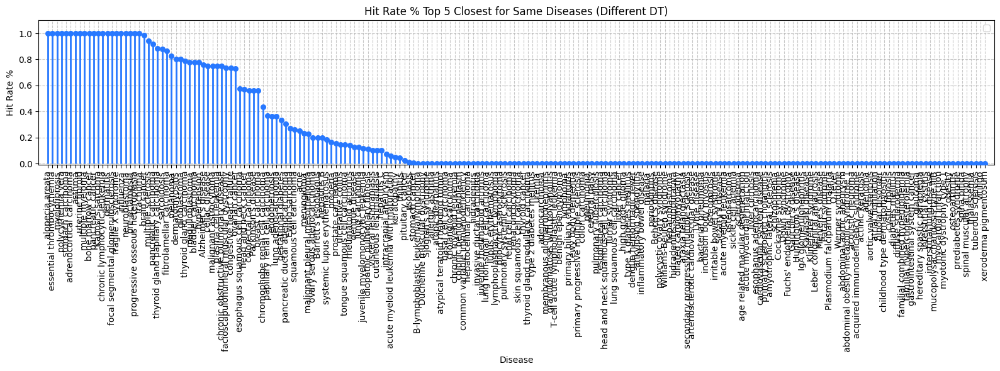

/tmp/ipykernel_8617/3771411444.py:27: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


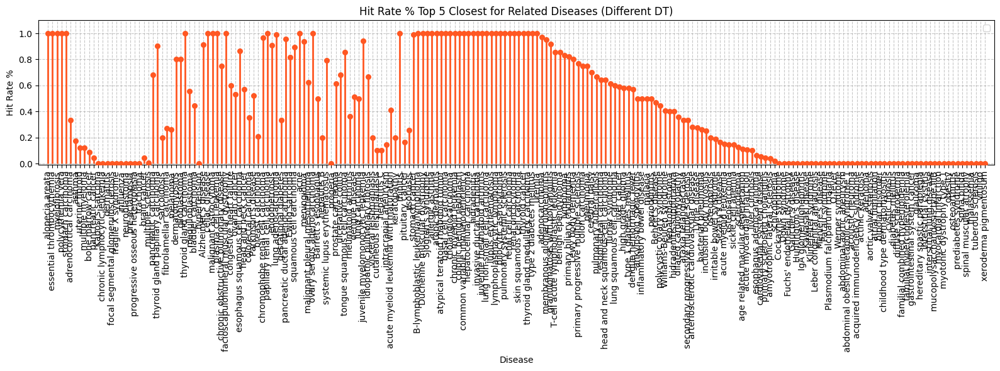

/tmp/ipykernel_8617/3771411444.py:27: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


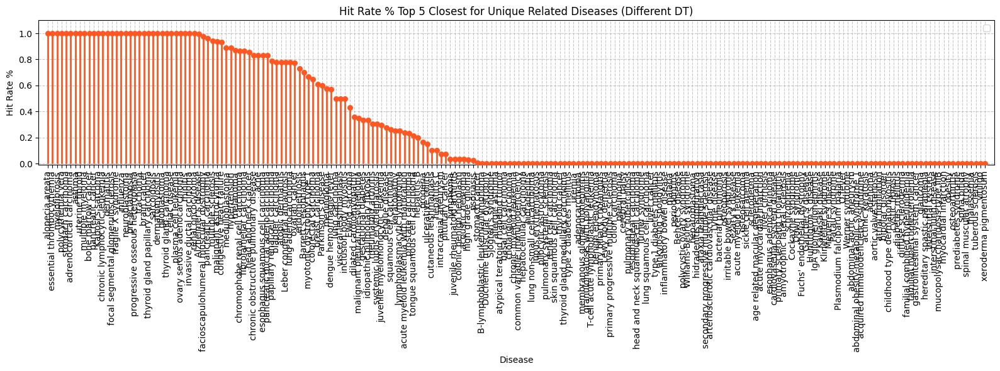

In [ ]:



def plot_lollipop(x_vals, labels, title, metric, color):
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D

    # numeric positions for categories
    xpos = np.arange(len(labels))

    plt.figure(figsize=(16, 6))
    plt.scatter(xpos, x_vals, color=color, s=30, zorder=3)  # dots

    # stems first (so dots appear on top)
    plt.vlines(np.arange(len(labels)), 0.0, x_vals, color=color, alpha=1, linewidth=2, zorder=2)

    # cosmetics
    plt.xticks(xpos, labels, rotation=90,)
    plt.margins(x=0.01, y=0.1)
    plt.ylim(-0.01, max(1, max(x_vals)) + 0.1)
    plt.grid(linestyle='--', alpha=0.7, zorder=-3)

    # labels / title (note: you're plotting average_precision, not AUROC)
    plt.xlabel("Disease")
    plt.ylabel(f"{metric}")
    plt.title(f"{title}")

    # legend entries for point and red segments
    plt.legend(loc='best')

    plt.tight_layout()
    plt.show()


top_k = 5

d_2_k = df_test_per_smp_v2.groupby("disease")[f"top_{top_k}_dis"].sum().to_dict()
d_2_count = df_test_per_smp_v2.groupby("disease")[f"top_{top_k}_dis"].count().to_dict()
dis_val = {k: v / d_2_count[k] for k, v in d_2_k.items()}

d_uniq_2_k = df_test_per_smp_v2.groupby("disease")["n_unique_hits"].sum().to_dict()
d_uniq_2_count = df_test_per_smp_v2.groupby("disease")["n_unique_hits"].count().to_dict()
d_uniq_val = {k: v / d_uniq_2_count[k] for k, v in d_uniq_2_k.items()}

rel_2_k = df_test_per_smp_v2.groupby("disease")[f"top_{top_k}_rel"].sum().to_dict()
rel_2_count = df_test_per_smp_v2.groupby("disease")[f"top_{top_k}_rel"].count().to_dict()
rel_val = {k: v / rel_2_count[k] for k, v in rel_2_k.items()}



# get optimal disease order
_df_order = pd.DataFrame({
    "dis": dis_val.keys(),
    "val_1": dis_val.values(),
    "val_2": [rel_val.get(k, 0) for k in dis_val.keys()],
    "val_3": [d_uniq_val.get(k, 0) for k in dis_val.keys()]
})
dis_order = _df_order.sort_values(by=["val_1", "val_2"], ascending=[False, False])["dis"].to_list()

# plot values
x_vals = [dis_val.get(d, np.nan) for d in dis_order]
plot_lollipop(x_vals, dis_order, f"Hit Rate % Top {top_k} Closest for Same Diseases (Different DT)", metric="Hit Rate %", color="#2778ff")

x_vals = [rel_val.get(d, np.nan) for d in dis_order]
plot_lollipop(x_vals, dis_order, f"Hit Rate % Top {top_k} Closest for Related Diseases (Different DT)", metric="Hit Rate %", color="#ff5722")

dis_order = _df_order.sort_values(by=["val_3","val_1", "val_2"], ascending=[False, False, False])["dis"].to_list()
x_vals = [d_uniq_val.get(d, np.nan) for d in dis_order]
plot_lollipop(x_vals, dis_order, f"Hit Rate % Top {top_k} Closest for Unique Related Diseases (Different DT)", metric="Hit Rate %", color="#ff5722")


/tmp/ipykernel_8617/581678538.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


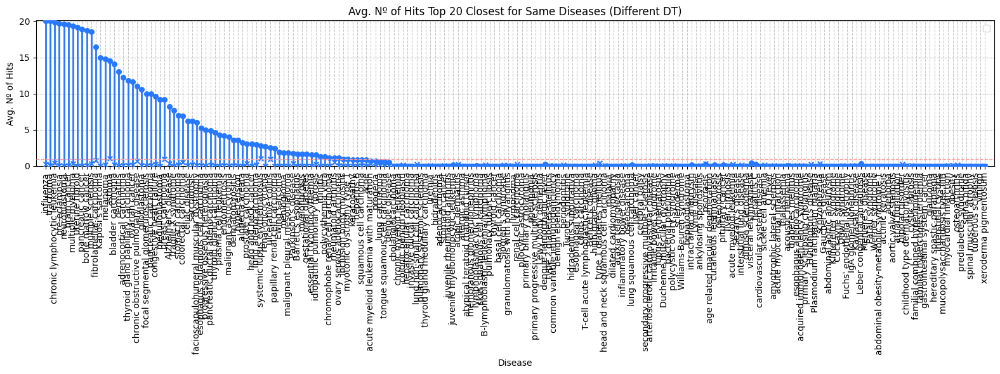

/tmp/ipykernel_8617/581678538.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


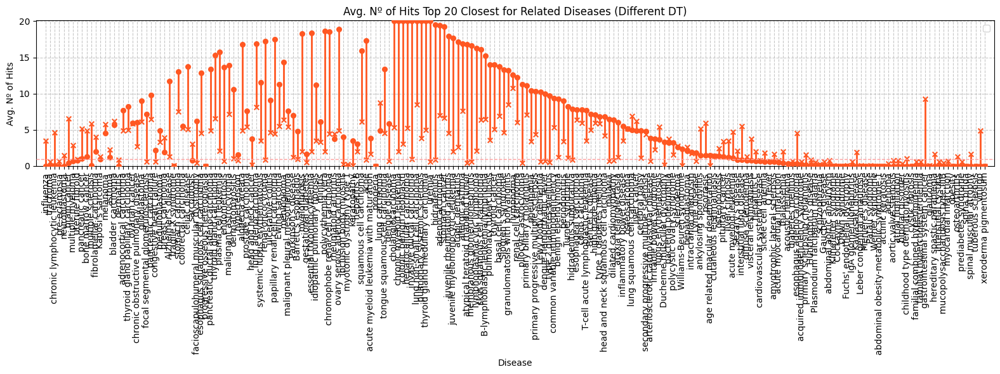

In [ ]:
def plot_lollipop_w_random(x_vals, rand_vals, labels, title, metric, color):
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D

    # numeric positions for categories
    xpos = np.arange(len(labels))

    plt.figure(figsize=(16, 6))
    plt.scatter(xpos, x_vals, color=color, s=30, zorder=3)  # dots
    plt.scatter(xpos, rand_vals, color=color, s=30, zorder=3, marker="x")  # x 

    # stems first (so dots appear on top)
    plt.vlines(np.arange(len(labels)), rand_vals, x_vals, color=color, alpha=1, linewidth=2, zorder=2)

    # cosmetics
    plt.xticks(xpos, labels, rotation=90,)
    plt.margins(x=0.01, y=0.1)
    plt.ylim(-0.01, max(x_vals + rand_vals) + 0.1)
    plt.grid(linestyle='--', alpha=0.7, zorder=-3)
    plt.axhline(y=1, color="#ff9e9d", linestyle='--', linewidth=1, zorder=3)

    # labels / title (note: you're plotting average_precision, not AUROC)
    plt.xlabel("Disease")
    plt.ylabel(f"{metric}")
    plt.title(f"{title}")

    # legend entries for point and red segments
    plt.legend(loc='best')

    plt.tight_layout()
    plt.show()


top_k = 20
d_2_k = df_test_per_smp_v2.groupby("disease")[f"n_{top_k}_dis"].mean().to_dict()
rel_2_k = df_test_per_smp_v2.groupby("disease")[f"n_{top_k}_rel"].mean().to_dict()


# get optimal disease order
_df_order = pd.DataFrame({
    "dis": d_2_k.keys(),
    "val_1": d_2_k.values(),
    "val_2": [rel_2_k.get(k, 0) for k in d_2_k.keys()]
})
_df_order["val_1"] = _df_order["val_1"].apply(lambda x: x if x > 0.5 else 0)
dis_order = _df_order.sort_values(by=["val_1", "val_2"], ascending=[False, False])["dis"].to_list()

x_vals = [d_2_k.get(d, np.nan) for d in dis_order]
rand_vals = df_test_per_smp_v2.groupby("disease")[f"top_{top_k}_dis_exp"].mean().to_dict()
rand_vals = [rand_vals.get(d, np.nan) for d in dis_order]
plot_lollipop_w_random(x_vals, rand_vals, dis_order, f"Avg. Nº of Hits Top {top_k} Closest for Same Diseases (Different DT)", metric="Avg. Nº of Hits", color="#2778ff")

x_vals = [rel_2_k.get(d, np.nan) for d in dis_order]
rand_vals = df_test_per_smp_v2.groupby("disease")[f"top_{top_k}_rel_exp"].mean().to_dict()
rand_vals = [rand_vals.get(d, np.nan) for d in dis_order]
plot_lollipop_w_random(x_vals, rand_vals, dis_order, f"Avg. Nº of Hits Top {top_k} Closest for Related Diseases (Different DT)", metric="Avg. Nº of Hits", color="#ff5722")

In [ ]:
df_stats.to_csv("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/run-25-09-13-18/test_dis_stats_no_ctrl.csv", index=False)

In [ ]:
a= stats.quantile_test(bg_dist_no_ctrl.get("DOID:11714"), q=0.9, p=0.98, alternative="less" )

In [ ]:
stats.ttest_1samp([1,2,3,4], 9,  alternative='greater')

TtestResult(statistic=-10.069756700139283, pvalue=0.9989572598425124, df=3)

In [ ]:
getattr(a, "pvalue")

0.0

In [ ]:
np.percentile(bg_dist_no_ctrl.get("DOID:11714"), 90)

0.45143837325030584

### 2.2.5 AUROC & AUPRC for Same Disease Retrieval

### Build Logistic Regression Model to predict disease type

In [ ]:
from sklearn.linear_model import LogisticRegression

models_per_dis = list()

# filter controls out
remove_controls = False
remove_related = False

if remove_controls:
    df_train = adata_train.obs[adata_train.obs["disease"] != "Control"]
    df_valid = adata_valid.obs[adata_valid.obs["disease"] != "Control"]
    df_test = adata_test.obs[adata_test.obs["disease"] != "Control"]
    
    e_test = embeddings_test[adata_test.obs["disease"] != "Control"]
    e_valid = embeddings_valid[adata_valid.obs["disease"] != "Control"]
    e_train = embeddings_train[adata_train.obs["disease"] != "Control"]
else:
    df_train = adata_train.obs
    df_valid = adata_valid.obs
    df_test = adata_test.obs

    e_test = embeddings_test
    e_valid = embeddings_valid
    e_train = embeddings_train


# perpare disease per model 
for doid_i in df_test["do_id"].unique():
    print(f"Training model for disease {doid_to_term.get(doid_i)} ({doid_i})")
    # get related diseases
    related_i = set(df_related.query(f"do1 == '{doid_i}'")["do2"].values)
    related_i = related_i.union(set(df_related.query(f"do2 == '{doid_i}'")["do1"].values))
    related_i = list(related_i)

    # unrelated diseases
    unrelated_i = set(df_unrelated.query(f"do1 == '{doid_i}'")["do2"].values)
    unrelated_i = unrelated_i.union(set(df_unrelated.query(f"do2 == '{doid_i}'")["do1"].values))
    unrelated_i = list(unrelated_i)

    if remove_related:
        # remove related diseases
        mask_train = ~df_train["doid_id"].isin(related_i )
        mask_valid = ~df_valid["doid_id"].isin(related_i)
        mask_test = ~df_test["doid_id"].isin(related_i)

        X_train = e_train[mask_train]
        y_train = (df_train[mask_train]["doid_id"] == doid_i).astype(int).values
    else: 
        X_train = e_train
        y_train = (df_train["doid_id"] == doid_i).astype(int).values


    # train model
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(X_train, y_train)

    # store model
    models_per_dis.append({
        "doid": doid_i,
        "model": model
    })


# predict per disease test
for model_info in models_per_dis:
    doid_i = model_info["doid"]
    model = model_info["model"]

    # get test data
    X_test = e_test
    y_test = (df_test["doid_id"] == doid_i).astype(int).values

    # predict
    y_score = model.predict_proba(X_test)[:, 1]

    # compute metrics
    ap_i = average_precision_score(y_test, y_score)
    auroc_i = roc_auc_score(y_test, y_score)

    print(f"Disease: {doid_to_term.get(doid_i)} ({doid_i}) - AP: {ap_i:.4f}, AUROC: {auroc_i:.4f}")
    model_info.update({
        "average_precision": ap_i,
        "roc_auc": auroc_i
    })

# generate matrix of predictions (samples x diseases)
df_ap_per_dis = pd.DataFrame(models_per_dis)
df_ap_per_dis.sort_values("average_precision", ascending=False, inplace=True)

Training model for disease None (Control)
Training model for disease retinoblastoma (DOID:768)
Training model for disease myotonic dystrophy type 1 (DOID:11722)
Training model for disease stomach carcinoma (DOID:5517)
Training model for disease chronic myeloid leukemia (DOID:8552)
Training model for disease colonic benign neoplasm (DOID:235)
Training model for disease Fuchs' endothelial dystrophy (DOID:11555)
Training model for disease intracranial aneurysm (DOID:10941)
Training model for disease spinal muscular atrophy (DOID:12377)
Training model for disease fibrolamellar carcinoma (DOID:5015)
Training model for disease head and neck cancer (DOID:11934)
Training model for disease lung carcinoma (DOID:3905)
Training model for disease cutaneous leishmaniasis (DOID:9111)
Training model for disease leprosy (DOID:1024)
Training model for disease systemic scleroderma (DOID:418)
Training model for disease neuroblastoma (DOID:769)
Training model for disease age related macular degeneration (D

In [ ]:

# --- Predict for all models and collect probabilities ---
disease_ids = [m["doid"] for m in models_per_dis]
prob_matrix = []  # will store [n_test_samples × n_diseases] matrix

for model_info in models_per_dis:
    doid_i = model_info["doid"]
    model = model_info["model"]

    # Get test data
    X_test = e_test
    y_test = (df_test["doid_id"] == doid_i).astype(int).values

    # Predict probabilities for this disease
    y_score = model.predict_proba(X_test)[:, 1]
    prob_matrix.append(y_score)

    # Compute metrics for diagnostic purposes
    ap_i = average_precision_score(y_test, y_score)
    auroc_i = roc_auc_score(y_test, y_score)
    model_info.update({
        "average_precision": ap_i,
        "roc_auc": auroc_i
    })
    print(f"Disease: {doid_to_term.get(doid_i)} ({doid_i}) - AP: {ap_i:.4f}, AUROC: {auroc_i:.4f}")

# --- Build probability matrix ---
# Shape: (n_test_samples, n_diseases)
prob_matrix = np.vstack(prob_matrix).T

df_probs = pd.DataFrame(
    prob_matrix,
    columns=disease_ids,
    index=df_test.index
)

print(f"Prediction matrix shape: {df_probs.shape}")
print(df_probs.head())

Disease: None (Control) - AP: 0.5556, AUROC: 0.7828
Disease: retinoblastoma (DOID:768) - AP: 1.0000, AUROC: 1.0000
Disease: myotonic dystrophy type 1 (DOID:11722) - AP: 0.1460, AUROC: 0.9877
Disease: stomach carcinoma (DOID:5517) - AP: 0.0013, AUROC: 0.5794
Disease: chronic myeloid leukemia (DOID:8552) - AP: 0.7207, AUROC: 0.9732
Disease: colonic benign neoplasm (DOID:235) - AP: 0.0020, AUROC: 0.6896
Disease: Fuchs' endothelial dystrophy (DOID:11555) - AP: 0.9167, AUROC: 0.9999
Disease: intracranial aneurysm (DOID:10941) - AP: 0.0057, AUROC: 0.6533
Disease: spinal muscular atrophy (DOID:12377) - AP: 0.0026, AUROC: 0.7976
Disease: fibrolamellar carcinoma (DOID:5015) - AP: 0.0020, AUROC: 0.6799
Disease: head and neck cancer (DOID:11934) - AP: 0.0023, AUROC: 0.7691
Disease: lung carcinoma (DOID:3905) - AP: 0.0011, AUROC: 0.4454
Disease: cutaneous leishmaniasis (DOID:9111) - AP: 0.6706, AUROC: 0.9972
Disease: leprosy (DOID:1024) - AP: 0.0029, AUROC: 0.6482
Disease: systemic scleroderma (DO

In [ ]:
# For each test sample: pick top-1 predicted disease
pred_top1 = df_probs.idxmax(axis=1)

# True disease for each sample
true_labels = df_test["doid_id"].values

# Compute global accuracy
global_acc = np.mean(pred_top1.values == true_labels)
print(f"\nGlobal Top-1 Accuracy: {global_acc:.4f}")

# --- Per-disease accuracy ---
per_disease_acc = []

for doid_i in disease_ids:
    mask = (true_labels == doid_i)
    if mask.sum() == 0:
        continue
    acc_i = np.mean(pred_top1[mask] == doid_i)
    per_disease_acc.append({
        "doid": doid_i,
        "disease": doid_to_term.get(doid_i),
        "n_samples": mask.sum(),
        "top1_accuracy": acc_i
    })

df_acc_per_dis = pd.DataFrame(per_disease_acc).sort_values("top1_accuracy", ascending=False)

print("\nPer-disease Top-1 accuracy:")
print(df_acc_per_dis.head(10))



Global Top-1 Accuracy: 0.2130

Per-disease Top-1 accuracy:
          doid                       disease  n_samples  top1_accuracy
6   DOID:11555  Fuchs' endothelial dystrophy          4       1.000000
90   DOID:3068                  glioblastoma          6       1.000000
20  DOID:11725    Cornelia de Lange syndrome          4       1.000000
1     DOID:768                retinoblastoma          5       1.000000
71  DOID:13922      eosinophilic esophagitis          9       0.888889
41   DOID:8472         localized scleroderma         16       0.875000
17   DOID:1520               colon carcinoma         20       0.800000
87   DOID:1040  chronic lymphocytic leukemia         47       0.765957
38  DOID:10584          retinitis pigmentosa         16       0.750000
22  DOID:10126                   keratoconus         19       0.578947


In [ ]:
# Binarize probability matrix at 0.5
binary_preds = (df_probs.values >= 0.5).astype(int)

# Keep same DataFrame structure for convenience
df_binary = pd.DataFrame(binary_preds, columns=df_probs.columns, index=df_probs.index)

print(f"\nBinary prediction matrix (threshold=0.5):")
print(df_binary.head())

# Compute hit rate (sample-level and per-disease)
true_labels = df_test["doid_id"].values

# For each sample: check if its true disease was predicted as 1
hits = []
for idx, true_doid in enumerate(true_labels):
    if true_doid in df_binary.columns:
        hit = df_binary.iloc[idx][true_doid] == 1
    else:
        hit = False  # disease unseen or filtered out
    hits.append(hit)

# Overall hit rate (how often the correct disease was predicted positive)
overall_hit_rate = np.mean(hits)
print(f"\nOverall hit rate at 0.5 threshold: {overall_hit_rate:.4f}")

# Per-disease hit rate
per_disease_hits = []
for doid_i in df_binary.columns:
    mask = (true_labels == doid_i)
    if mask.sum() == 0:
        continue
    hit_i = np.mean(df_binary.loc[mask, doid_i])
    per_disease_hits.append({
        "doid": doid_i,
        "disease": doid_to_term.get(doid_i),
        "n_samples": mask.sum(),
        "hit_rate_0.5": hit_i
    })

df_hit_per_dis = pd.DataFrame(per_disease_hits).sort_values("hit_rate_0.5", ascending=False)


Binary prediction matrix (threshold=0.5):
   Control  DOID:768  DOID:11722  DOID:5517  DOID:8552  DOID:235  DOID:11555  \
0        1         0           0          0          0         0           0   
1        1         0           0          0          0         0           0   
2        1         0           0          0          0         0           0   
3        1         0           0          0          0         0           0   
4        0         1           0          0          0         0           0   

   DOID:10941  DOID:12377  DOID:5015  ...  DOID:684  DOID:3907  DOID:4074  \
0           0           0          0  ...         0          0          0   
1           0           0          0  ...         0          0          0   
2           0           0          0  ...         0          0          0   
3           0           0          0  ...         0          0          0   
4           0           0          0  ...         0          0          0   

   DOID:3717 

In [ ]:
k = "predicted_top1"

# group by disease
_df_counts = get_counts(df_predictions, rel_map, k)
_hit_same = _df_counts.groupby("query_doid")["hits_same"].mean().mean()
_hit_rel = _df_counts.groupby("query_doid")["hits_rel"].mean().mean()
perf_results.append({
    "Key": k,
    "Across": "Diseases",
    "Condition": _condition,
    "Type": "Same Disease",
    "Hits Same Disease": f"{_hit_same*100:.1f}",
    "Precision@K": f"{_df_counts.groupby('query_doid')['prec@k'].mean().mean()*100:.1f}",
    "Set size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
    "Hits Related Disease": f"{_hit_rel*100:.1f}",
})

# across all samples
_df_counts = get_counts(df_predictions, rel_map, k)
_hit_same = _df_counts["hits_same"].mean()
_hit_rel = _df_counts["hits_rel"].mean()

perf_results.append({
    "Key": k,
    "Across": "Samples",
    "Condition": _condition,
    "Type": "Related Disease",
    "Hits Same Disease": f"{_hit_same*100:.1f}",
    "Precision@K": f"{_df_counts['prec@k'].mean()*100:.1f}",
    "Set size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
    "Hits Related Disease": f"{_hit_rel*100:.1f}",
})

NameError: name 'df_predictions' is not defined

In [ ]:
(np.sum(binary_preds, axis=1)>15).sum()

0

In [ ]:
# Logistic Regression with OneVsRestClassifier for probability-based metrics (AUROC, AUPRC, Hit@k)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.multiclass import OneVsRestClassifier

# filter controls out
remove_controls = True

if remove_controls:
    df_train = adata_train.obs[adata_train.obs["disease"] != "Control"]
    df_valid = adata_valid.obs[adata_valid.obs["disease"] != "Control"]
    df_test = adata_test.obs[adata_test.obs["disease"] != "Control"]
    
    e_test = embeddings_test[adata_test.obs["disease"] != "Control"]
    e_valid = embeddings_valid[adata_valid.obs["disease"] != "Control"]
    e_train = embeddings_train[adata_train.obs["disease"] != "Control"]
else:
    df_train = adata_train.obs
    df_valid = adata_valid.obs
    df_test = adata_test.obs

    e_test = embeddings_test
    e_valid = embeddings_valid
    e_train = embeddings_train


# 1) Encode labels using TRAIN classes only
le = LabelEncoder().fit(df_train["doid_id"].values)
y_train = le.transform(df_train["doid_id"].values)

# train
clf = OneVsRestClassifier(LogisticRegression(max_iter=1000,class_weight="balanced"), n_jobs=8)
clf.fit(e_train, y_train)

# 2) testation: restrict to doid_ids seen in TRAIN
test_labels = df_test["doid_id"].values
seen_mask = np.isin(test_labels, le.classes_)                 # only seen doid_ids
Xv = e_test[seen_mask]
yv_str = test_labels[seen_mask]
y_test = le.transform(yv_str)                                  # integer labels (seen only)
print(f"Evaluating on {len(y_test)} test cells from {len(le.classes_)} seen classes")
print(f"Nº of embeddings {Xv.shape} from original {e_test.shape} ")


# 3) Probabilities (no hard predict)
y_proba = clf.predict_proba(Xv)                                 # shape (n_samples, n_train_classes)

# 4) Probability-based metrics
#    (a) Macro AUROC (OvR) and Macro AUPRC over seen classes
y_test_bin = label_binarize(y_test, classes=np.arange(len(le.classes_)))
auroc_macro = roc_auc_score(y_test_bin, y_proba, average="macro", multi_class="ovr")
auprc_macro = average_precision_score(y_test_bin, y_proba, average="macro")

print(f"Macro AUROC (seen classes): {auroc_macro:.3f}")
print(f"Macro AUPRC (seen classes): {auprc_macro:.3f}")

#    (b) Per-class AUROC/AUPRC (optional, useful for doid_id-level reporting)
auroc_per_class = {}
auprc_per_class = {}
for c, name in enumerate(le.classes_):
    y_true_c = (y_test == c).astype(int)
    if y_true_c.sum() == 0:        # this class might not appear in the filtered test set
        continue
    auroc_per_class[name] = roc_auc_score(y_true_c, y_proba[:, c])
    auprc_per_class[name] = average_precision_score(y_true_c, y_proba[:, c])

# 5) Optional: Top-k from probabilities (still no hard predict)
def hit_at_k_from_proba(y_true_int, proba, k=5):
    topk = np.argsort(-proba, axis=1)[:, :k]  # top-k indices (unordered)
    # check if true label is in top-k set per row
    hits = [int(t in row) for t, row in zip(y_true_int, topk)]
    return np.mean(hits)

for k in (1, 5, 10):
    print(f"Hit@{k} (seen classes): {hit_at_k_from_proba(y_test, y_proba, k=k):.3f}")

Evaluating on 3611 test cells from 123 seen classes
Nº of embeddings (3611, 512) from original (3611, 512) 
Macro AUROC (seen classes): 0.713
Macro AUPRC (seen classes): 0.133
Hit@1 (seen classes): 0.083
Hit@5 (seen classes): 0.247
Hit@10 (seen classes): 0.409


In [ ]:
import pandas as pd

# Get top-1 predicted label index for each sample
top1_idx = np.argmax(y_proba, axis=1)

# Convert integer labels back to disease strings
true_disease = le.inverse_transform(y_test)
pred_top1 = le.inverse_transform(top1_idx)

# Create a DataFrame
df_predictions = pd.DataFrame({
    "query_doid": true_disease,
    "predicted_top1": [[p] for p in pred_top1]
})

# Optional: show first few rows
print(df_predictions.head())


  query_doid predicted_top1
0   DOID:768     [DOID:768]
1   DOID:768     [DOID:768]
2   DOID:768     [DOID:768]
3   DOID:768     [DOID:768]
4   DOID:768     [DOID:768]


In [ ]:
k = "predicted_top1"

# group by disease
_df_counts = get_counts(df_predictions, rel_map, k)
_hit_same = _df_counts.groupby("query_doid")["hits_same"].mean().mean()
_hit_rel = _df_counts.groupby("query_doid")["hits_rel"].mean().mean()
perf_results.append({
    "Key": k,
    "Across": "Diseases",
    "Condition": _condition,
    "Type": "Same Disease",
    "Hits Same Disease": f"{_hit_same*100:.1f}",
    "Precision@K": f"{_df_counts.groupby('query_doid')['prec@k'].mean().mean()*100:.1f}",
    "Set size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
    "Hits Related Disease": f"{_hit_rel*100:.1f}",
})

# across all samples
_df_counts = get_counts(df_predictions, rel_map, k)
_hit_same = _df_counts["hits_same"].mean()
_hit_rel = _df_counts["hits_rel"].mean()

perf_results.append({
    "Key": k,
    "Across": "Samples",
    "Condition": _condition,
    "Type": "Related Disease",
    "Hits Same Disease": f"{_hit_same*100:.1f}",
    "Precision@K": f"{_df_counts['prec@k'].mean()*100:.1f}",
    "Set size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
    "Hits Related Disease": f"{_hit_rel*100:.1f}",
})

In [ ]:
pd.DataFrame(perf_results)

,Key,Across,Condition,Type,Hits Same Disease,Precision@K,Size,Unique Size,Hits Related Disease,Set size
0,qtl_test_95,Diseases,No Control,Same Disease,0.0,0.0,8,8,0.0,NaN
1,qtl_test_95,Samples,No Control,Related Disease,0.0,0.0,8,8,0.0,NaN
2,qtl_test_95,Diseases,With Control,Same Disease,0.0,0.0,8,8,0.0,NaN
3,qtl_test_95,Samples,With Control,Related Disease,0.0,0.0,8,8,0.0,NaN
4,qtl_test_95_bonf,Diseases,No Control,Same Disease,0.0,0.0,5,5,0.0,NaN
5,qtl_test_95_bonf,Samples,No Control,Related Disease,0.0,0.0,5,5,0.0,NaN
6,qtl_test_95_bonf,Diseases,With Control,Same Disease,0.0,0.0,5,5,0.0,NaN
7,qtl_test_95_bonf,Samples,With Control,Related Disease,0.0,0.0,5,5,0.0,NaN
8,qtl_test_99,Diseases,No Control,Same Disease,0.0,0.0,3,3,0.0,NaN
9,qtl_test_99,Samples,No Control,Related Disease,0.0,0.0,3,3,0.0,NaN


In [ ]:
def hit_at_k_from_proba_grouped(y_true_int, proba, k=5):
    topk = np.argsort(-proba, axis=1)[:, :k]
    hits = np.array([int(t in row) for t, row in zip(y_true_int, topk)])
    
    df = pd.DataFrame({
        "true_label": y_true_int,
        "hit": hits
    })
    
    mean_hits = df.groupby("true_label")["hit"].mean().sort_values(ascending=False)
    return (mean_hits).mean()

for k in (1, 5, 10):
    print(f"Hit@{k} (seen classes): {hit_at_k_from_proba_grouped(y_test, y_proba, k=k)*100:.2f} %")

Hit@1 (seen classes): 11.11 %
Hit@5 (seen classes): 22.49 %
Hit@10 (seen classes): 30.13 %


In [ ]:
"my source of cake from EBL - they are expired - unless thay are with green thingy I eaty"

In [ ]:
# KNN with OneVsRestClassifier for probability-based metrics (AUROC, AUPRC, Hit@k)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.multiclass import OneVsRestClassifier

# filter controls out
remove_controls = False

if remove_controls:
    df_train = adata_train.obs[adata_train.obs["disease"] != "Control"]
    df_valid = adata_valid.obs[adata_valid.obs["disease"] != "Control"]
    df_test = adata_test.obs[adata_test.obs["disease"] != "Control"]
    
    e_test = embeddings_test[adata_test.obs["disease"] != "Control"]
    e_valid = embeddings_valid[adata_valid.obs["disease"] != "Control"]
    e_train = embeddings_train[adata_train.obs["disease"] != "Control"]
else:
    df_train = adata_train.obs
    df_valid = adata_valid.obs
    df_test = adata_test.obs

    e_test = embeddings_test
    e_valid = embeddings_valid
    e_train = embeddings_train

    
# 1) Encode labels using TRAIN classes only
le = LabelEncoder().fit(df_train["doid_id"].values)
y_train = le.transform(df_train["doid_id"].values)

# train
clf = OneVsRestClassifier(KNeighborsClassifier(n_neighbors=10,weights="distance"), n_jobs=8)
clf.fit(e_train, y_train)

# 2) testation: restrict to doid_ids seen in TRAIN
test_labels = df_test["doid_id"].values
seen_mask = np.isin(test_labels, le.classes_)                 # only seen doid_ids
Xv = e_test[seen_mask]
yv_str = test_labels[seen_mask]
y_test = le.transform(yv_str)                                  # integer labels (seen only)
print(f"Evaluating on {len(y_test)} test cells from {len(le.classes_)} seen classes")
print(f"Nº of embeddings {Xv.shape} from original {e_test.shape} ")


# 3) Probabilities (no hard predict)
y_proba = clf.predict_proba(Xv)                                 # shape (n_samples, n_train_classes)

# 4) Probability-based metrics
#    (a) Macro AUROC (OvR) and Macro AUPRC over seen classes
y_test_bin = label_binarize(y_test, classes=np.arange(len(le.classes_)))
auroc_macro = roc_auc_score(y_test_bin, y_proba, average="macro", multi_class="ovr")
auprc_macro = average_precision_score(y_test_bin, y_proba, average="macro")

print(f"Macro AUROC (seen classes): {auroc_macro:.3f}")
print(f"Macro AUPRC (seen classes): {auprc_macro:.3f}")

#    (b) Per-class AUROC/AUPRC (optional, useful for doid_id-level reporting)
auroc_per_class = {}
auprc_per_class = {}
for c, name in enumerate(le.classes_):
    y_true_c = (y_test == c).astype(int)
    if y_true_c.sum() == 0:        # this class might not appear in the filtered test set
        continue
    auroc_per_class[name] = roc_auc_score(y_true_c, y_proba[:, c])
    auprc_per_class[name] = average_precision_score(y_true_c, y_proba[:, c])

# 5) Optional: Top-k from probabilities (still no hard predict)
def hit_at_k_from_proba(y_true_int, proba, k=5):
    topk = np.argsort(-proba, axis=1)[:, :k]  # top-k indices (unordered)
    # check if true label is in top-k set per row
    hits = [int(t in row) for t, row in zip(y_true_int, topk)]
    return np.mean(hits)

for k in (1, 5, 10):
    print(f"Hit@{k} (seen classes): {hit_at_k_from_proba(y_test, y_proba, k=k):.3f}")

Evaluating on 5248 test cells from 124 seen classes
Nº of embeddings (5248, 512) from original (5248, 512) 
Macro AUROC (seen classes): 0.588
Macro AUPRC (seen classes): 0.093
Hit@1 (seen classes): 0.241
Hit@5 (seen classes): 0.365
Hit@10 (seen classes): 0.378


In [ ]:
import pandas as pd

# Get top-1 predicted label index for each sample
top1_idx = np.argmax(y_proba, axis=1)

# Convert integer labels back to disease strings
true_disease = le.inverse_transform(y_test)
pred_top1 = le.inverse_transform(top1_idx)

# Create a DataFrame
df_predictions = pd.DataFrame({
    "query_doid": true_disease,
    "predicted_top1": [[p] for p in pred_top1]
})

# Optional: show first few rows
print(df_predictions.head())


  query_doid predicted_top1
0    Control      [Control]
1    Control      [Control]
2    Control      [Control]
3    Control      [Control]
4   DOID:768     [DOID:768]


In [ ]:
import numpy as np
import pandas as pd

# Get top-1 predicted label index for each sample
top1_idx = np.argmax(y_proba, axis=1)

# Get all predicted label indices with probability >= 0.5 for each sample
pred_idx_thresh = [np.where(row >= 0.5)[0] for row in y_proba]
pred_idx_thresh_08 = [np.where(row >= 0.8)[0] for row in y_proba]

# Convert integer labels back to disease strings
true_disease = le.inverse_transform(y_test)
pred_top1 = le.inverse_transform(top1_idx)
pred_all_thresh = [le.inverse_transform(idx_list) for idx_list in pred_idx_thresh]
pred_all_thresh_08 = [le.inverse_transform(idx_list) for idx_list in pred_idx_thresh_08]

# Create DataFrame with both top-1 and all ≥0.5 predictions
df_predictions = pd.DataFrame({
    "query_doid": true_disease,
    "predicted_top1": [[p] for p in pred_top1],
    "predicted_above_0.5": pred_all_thresh,
    "predicted_above_0.8": pred_all_thresh_08
})

# Optional: show first few rows
print(df_predictions.head())


  query_doid predicted_top1
0    Control      [Control]
1    Control      [Control]
2    Control      [Control]
3    Control      [Control]
4   DOID:768     [DOID:768]


In [ ]:
k = "predicted_top1"

# group by disease
_df_counts = get_counts(df_predictions, rel_map, k)
_hit_same = _df_counts.groupby("query_doid")["hits_same"].mean().mean()
_hit_rel = _df_counts.groupby("query_doid")["hits_rel"].mean().mean()
perf_results.append({
    "Key": k,
    "Across": "Diseases",
    "Condition": _condition,
    "Type": "Same Disease",
    "Hits Same Disease": f"{_hit_same*100:.1f}",
    "Precision@K": f"{_df_counts.groupby('query_doid')['prec@k'].mean().mean()*100:.1f}",
    "Set size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
    "Hits Related Disease": f"{_hit_rel*100:.1f}",
})

# across all samples
_df_counts = get_counts(df_predictions, rel_map, k)
_hit_same = _df_counts["hits_same"].mean()
_hit_rel = _df_counts["hits_rel"].mean()

perf_results.append({
    "Key": k,
    "Across": "Samples",
    "Condition": _condition,
    "Type": "Related Disease",
    "Hits Same Disease": f"{_hit_same*100:.1f}",
    "Precision@K": f"{_df_counts['prec@k'].mean()*100:.1f}",
    "Set size": f'{_df_counts["n_total"].mean():.0f}±{_df_counts["n_total"].std():.0f}' if _df_counts["n_total"].std() > 0 else f'{_df_counts["n_total"].mean():.0f}',
    "Hits Related Disease": f"{_hit_rel*100:.1f}",
})

In [ ]:
pd.DataFrame(perf_results)

,Key,Across,Condition,Type,Hits Same Disease,Precision@K,Size,Unique Size,Hits Related Disease,Set size
0,qtl_test_95,Diseases,No Control,Same Disease,0.0,0.0,8,8,0.0,NaN
1,qtl_test_95,Samples,No Control,Related Disease,0.0,0.0,8,8,0.0,NaN
2,qtl_test_95,Diseases,With Control,Same Disease,0.0,0.0,8,8,0.0,NaN
3,qtl_test_95,Samples,With Control,Related Disease,0.0,0.0,8,8,0.0,NaN
4,qtl_test_95_bonf,Diseases,No Control,Same Disease,0.0,0.0,5,5,0.0,NaN
5,qtl_test_95_bonf,Samples,No Control,Related Disease,0.0,0.0,5,5,0.0,NaN
6,qtl_test_95_bonf,Diseases,With Control,Same Disease,0.0,0.0,5,5,0.0,NaN
7,qtl_test_95_bonf,Samples,With Control,Related Disease,0.0,0.0,5,5,0.0,NaN
8,qtl_test_99,Diseases,No Control,Same Disease,0.0,0.0,3,3,0.0,NaN
9,qtl_test_99,Samples,No Control,Related Disease,0.0,0.0,3,3,0.0,NaN


In [ ]:
def hit_at_k_from_proba_grouped(y_true_int, proba, k=5):
    topk = np.argsort(-proba, axis=1)[:, :k]
    hits = np.array([int(t in row) for t, row in zip(y_true_int, topk)])
    
    df = pd.DataFrame({
        "true_label": y_true_int,
        "hit": hits
    })
    
    mean_hits = df.groupby("true_label")["hit"].mean().sort_values(ascending=False)
    return (mean_hits).mean()

for k in (1, 5, 10):
    print(f"Hit@{k} (seen classes): {hit_at_k_from_proba_grouped(y_test, y_proba, k=k)*100:.2f} %")

Hit@1 (seen classes): 10.39 %
Hit@5 (seen classes): 12.35 %
Hit@10 (seen classes): 16.58 %


In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.metrics import roc_auc_score, average_precision_score

# ------------------------------
# Define SimpleNN (PyTorch model)
# ------------------------------
class SimpleNN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(SimpleNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, output_dim)

    def forward(self, x):
        x = self.fc1(x)
        x = torch.relu(x)
        x = self.fc2(x)
        x = torch.sigmoid(x)
        return x


# ------------------------------
# Filter control samples
# ------------------------------
remove_controls = True

if remove_controls:
    df_train = adata_train.obs[adata_train.obs["disease"] != "Control"]
    df_valid = adata_valid.obs[adata_valid.obs["disease"] != "Control"]
    df_test = adata_test.obs[adata_test.obs["disease"] != "Control"]

    e_train = embeddings_train[adata_train.obs["disease"] != "Control"]
    e_valid = embeddings_valid[adata_valid.obs["disease"] != "Control"]
    e_test = embeddings_test[adata_test.obs["disease"] != "Control"]
else:
    df_train = adata_train.obs
    df_valid = adata_valid.obs
    df_test = adata_test.obs

    e_train = embeddings_train
    e_valid = embeddings_valid
    e_test = embeddings_test


# ------------------------------
# Encode labels
# ------------------------------
le = LabelEncoder().fit(df_train["doid_id"].values)
y_train = le.transform(df_train["doid_id"].values)

# Convert to tensors
X_train = torch.tensor(e_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)

# ------------------------------
# Train PyTorch model
# ------------------------------
model = SimpleNN(input_dim=X_train.shape[1], output_dim=len(le.classes_))
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

epochs = 100
for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()
    if (epoch + 1) % 5 == 0:
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}")


# ------------------------------
# Prepare test data (only seen classes)
# ------------------------------
test_labels = df_test["doid_id"].values
seen_mask = np.isin(test_labels, le.classes_)
Xv = e_test[seen_mask]
yv_str = test_labels[seen_mask]
y_test = le.transform(yv_str)

print(f"Evaluating on {len(y_test)} test cells from {len(le.classes_)} seen classes")

# Convert to tensor
Xv_tensor = torch.tensor(Xv, dtype=torch.float32)
model.eval()
with torch.no_grad():
    y_proba = model(Xv_tensor).numpy()  # shape (n_samples, n_classes)

# ------------------------------
# Metrics: AUROC, AUPRC, Hit@k
# ------------------------------
y_test_bin = label_binarize(y_test, classes=np.arange(len(le.classes_)))

auroc_macro = roc_auc_score(y_test_bin, y_proba, average="macro", multi_class="ovr")
auprc_macro = average_precision_score(y_test_bin, y_proba, average="macro")

print(f"Macro AUROC: {auroc_macro:.3f}")
print(f"Macro AUPRC: {auprc_macro:.3f}")

# Per-class metrics
auroc_per_class, auprc_per_class = {}, {}
for c, name in enumerate(le.classes_):
    y_true_c = (y_test == c).astype(int)
    if y_true_c.sum() == 0:
        continue
    auroc_per_class[name] = roc_auc_score(y_true_c, y_proba[:, c])
    auprc_per_class[name] = average_precision_score(y_true_c, y_proba[:, c])

# ------------------------------
# Hit@k calculation
# ------------------------------
def hit_at_k_from_proba(y_true_int, proba, k=5):
    topk = np.argsort(-proba, axis=1)[:, :k]
    hits = [int(t in row) for t, row in zip(y_true_int, topk)]
    return np.mean(hits)

for k in (1, 5, 10):
    print(f"Hit@{k}: {hit_at_k_from_proba(y_test, y_proba, k=k):.3f}")


ValueError: Using a target size (torch.Size([11823])) that is different to the input size (torch.Size([11823, 123])) is deprecated. Please ensure they have the same size.